<H1> Les jeux de données pour le projet </H1>

Dans ce notebook nous présentons les jeux de données utilisés pour le projet. Nous proposons également des fonctions pour permettre de pouvoir facilement les données.   

Il n'y a donc plus qu'à chercher les meilleurs modèles et à répondre aux questions de l'énoncé du projet.   

Bon courage !

ps : il y a trois jeux de données et ils sont très différents donc attention vous aurez peut être 3 modèles différents.

## Installation



Avant de commencer, il est nécessaire de déjà posséder dans son environnement toutes les librairies utiles. Dans la seconde cellule nous importons toutes les librairies qui seront utiles à ce notebook. Il se peut que, lorsque vous lanciez l'éxecution de cette cellule, une soit absente. Dans ce cas il est nécessaire de l'installer. Pour cela dans la cellule suivante utiliser la commande :  

*! pip install nom_librairie*  

**Attention :** il est fortement conseillé lorsque l'une des librairies doit être installer de relancer le kernel de votre notebook.

**Remarque :** même si toutes les librairies sont importées dès le début, les librairies utiles pour des fonctions présentées au cours de ce notebook sont ré-importées de manière à indiquer d'où elles viennent et ainsi faciliter la réutilisation de la fonction dans un autre projet.



In [ ]:
# utiliser cette cellule pour installer les librairies manquantes
# pour cela il suffit de taper dans cette cellule : !pip install nom_librairie_manquante
# d'exécuter la cellule et de relancer la cellule suivante pour voir si tout se passe bien
# recommencer tant que toutes les librairies ne sont pas installées ...

# sous Colab il faut déjà intégrer ces deux librairies

!pip install umap-learn[plot]
!pip install holoviews
!pip install -U ipykernel
!pip install scikeras[tensorflow]
#!pip uninstall tensorflow
#!pip uninstall keras
#!pip install tensorflow
#!pip install keras
# eventuellement ne pas oublier de relancer le kernel du notebook

In [ ]:
# Importation des différentes librairies utiles pour le notebook

#Sickit learn met régulièrement à jour des versions et
#indique des futurs warnings.
#ces deux lignes permettent de ne pas les afficher.
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# librairies générales
import pickle
import pandas as pd
from scipy.stats import randint
import numpy as np
import string
import time
import base64
import re
import sys
import copy
import random
from numpy import mean
from numpy import std


# librairie affichage
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import plotly.graph_objs as go
import plotly.offline as py

from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

# TensorFlow et keras
import tensorflow as tf
from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array, load_img
from keras.callbacks import ModelCheckpoint, EarlyStopping
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.preprocessing import image
from tqdm import tqdm
from keras.models import load_model
from sklearn.model_selection import KFold
from keras.datasets import fashion_mnist
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Dense
from keras.layers import Flatten
from tensorflow.keras.optimizers import SGD
import os
from os import listdir
from os.path import isfile, join
import cv2
import glob

2023-11-24 11:25:44.840879: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-24 11:25:45.933357: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [ ]:
# Importation des différentes librairies utiles pour le notebook

#Sickit learn met régulièrement à jour des versions et
#indique des futurs warnings.
#ces deux lignes permettent de ne pas les afficher.
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# librairies générales
import pickle
import pandas as pd
from scipy.stats import randint
import numpy as np
import string
import time
import base64
import re
import sys
import copy


# librairie affichage
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import plotly.graph_objs as go
import plotly.offline as py
import plotly.express as px

from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

# librairies NLTK
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from nltk import word_tokenize


nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')
stop_words = set(stopwords.words('english'))

# Umap
import umap.plot
from umap import UMAP

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
/usr/local/lib/python3.10/dist-packages/umap/plot.py:203: NumbaDeprecationWarning:

The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.



Pour pouvoir sauvegarder sur votre répertoire Google Drive, il est nécessaire de fournir une autorisation. Pour cela il suffit d'éxecuter la ligne suivante et de saisir le code donné par Google.

In [ ]:
# pour monter son drive Google Drive local
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Corriger éventuellement la ligne ci-dessous pour mettre le chemin vers un répertoire spécifique dans votre répertoire Google Drive :

In [ ]:
import sys
my_local_drive='/content/gdrive/My Drive/Colab Notebooks/ML2_2023_2024'
# Ajout du path pour les librairies, fonctions et données
sys.path.append(my_local_drive)
# Se positionner sur le répertoire associé
%cd $my_local_drive

%pwd

/content/gdrive/My Drive/Colab Notebooks/ML2_2023_2024


'/content/gdrive/My Drive/Colab Notebooks/ML2_2023_2024'

####Les jeux de données


Récupération des jeux de données :      

In [ ]:
!wget https://www.lirmm.fr/~poncelet/Ressources/Tiger-Fox-Elephant.zip

--2023-11-21 08:19:39--  https://www.lirmm.fr/~poncelet/Ressources/Tiger-Fox-Elephant.zip
Resolving www.lirmm.fr (www.lirmm.fr)... 193.49.104.251
Connecting to www.lirmm.fr (www.lirmm.fr)|193.49.104.251|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7605545 (7.3M) [application/zip]
Saving to: ‘Tiger-Fox-Elephant.zip.19’

Tiger-Fox-Elephant. 100%[===================>]   7.25M  7.94MB/s    in 0.9s    

2023-11-21 08:19:40 (7.94 MB/s) - ‘Tiger-Fox-Elephant.zip.19’ saved [7605545/7605545]



In [ ]:
import zipfile
with zipfile.ZipFile("Tiger-Fox-Elephant.zip","r") as zip_ref:
    zip_ref.extractall("Data_Project")


Il y a trois jeux de données différents : des tigres, des éléphants et des renards. Pour chacun d'entre eux il y a un ensemble d'images positive et un ensemble d'images négatives. Par exemple dans le répertoire *tiger* il n'y a que des images de tigre et dans le répertoire *Tiger_negative_class* il n'y a que des images d'animaux qui ne correspondent pas à des tigres.   

Le code ci-dessous permet de visualiser quelques images contenues dans le répertoire *tiger*.

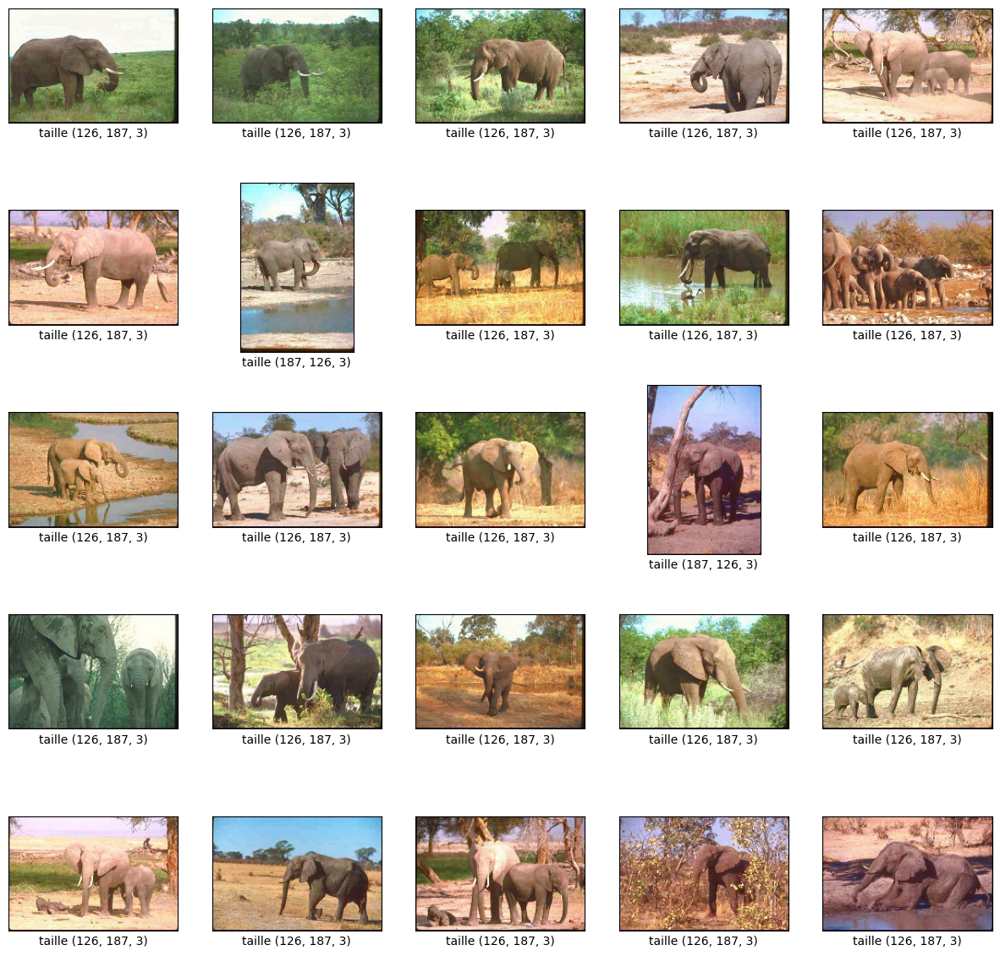

In [ ]:
mypath='Data_Project/Tiger-Fox-Elephant/elephant'
onlyfiles = [ f for f in listdir(mypath) if isfile(join(mypath,f)) ]
images = np.empty(len(onlyfiles), dtype=object)
for n in range(0, len(onlyfiles)):
  images[n] = cv2.imread( join(mypath,onlyfiles[n]) )


COLUMNS = 25 # Nombre d'images à afficher

plt.figure(figsize=(15,15))
for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    # il faut donc convertir pour afficher les bonnes couleurs
    images[i] = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
    plt.imshow(images[i],cmap=plt.cm.binary)
    plt.xlabel('taille ' + str(images[i].shape))

Nous pouvons constater que les images ne sont pas de la même taille. Il faut donc les convertir. Une manière simple de faire et de faire la conversion lors de la lecture des images : ici nous convertissons toutes les images en 124x124.

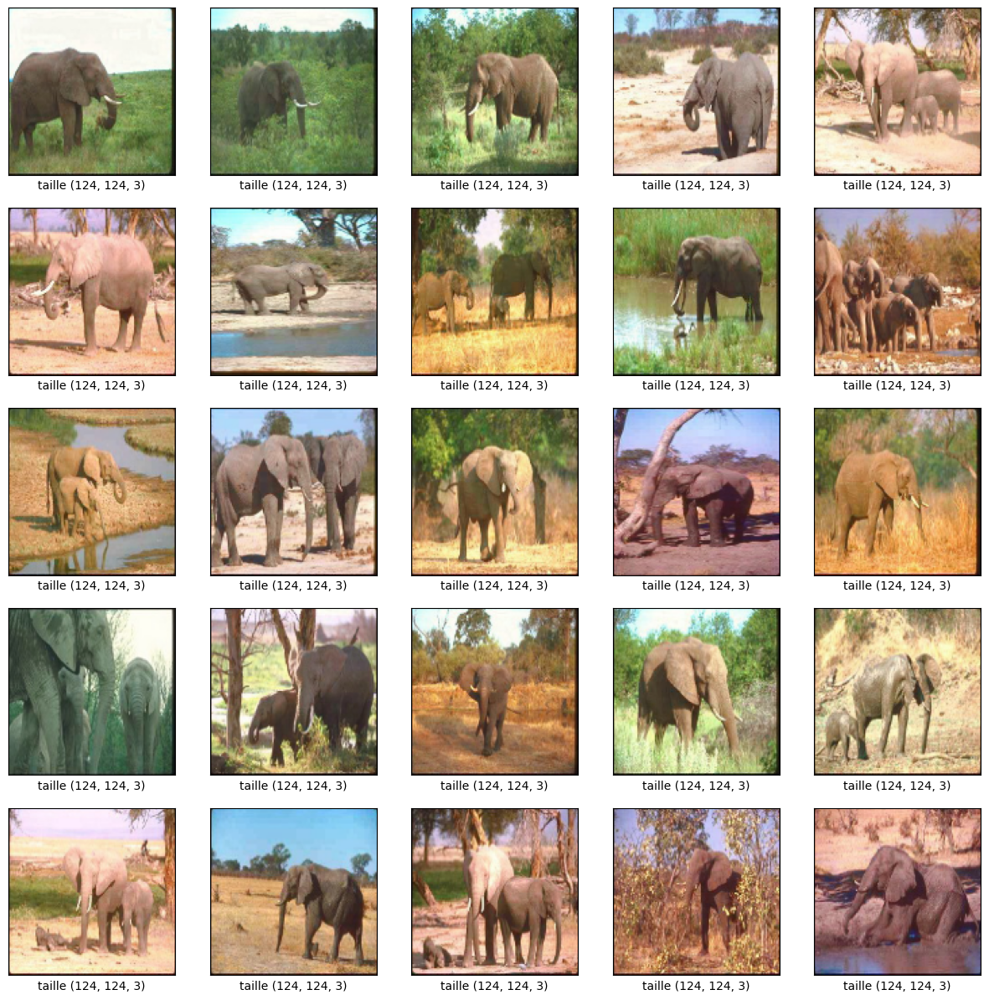

In [ ]:
IMG_SIZE=124
mypath='Data_Project/Tiger-Fox-Elephant/elephant'
onlyfiles = [ f for f in listdir(mypath) if isfile(join(mypath,f)) ]
images = np.empty(len(onlyfiles), dtype=object)
for n in range(0, len(onlyfiles)):
  images[n] = cv2.imread( join(mypath,onlyfiles[n]) )
  images[n]  = cv2.resize(images[n], (IMG_SIZE, IMG_SIZE))

plt.figure(figsize=(15,15))
for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    # il faut donc convertir pour afficher les bonnes couleurs
    images[i] = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
    plt.imshow(images[i],cmap=plt.cm.binary)
    plt.xlabel('taille ' + str(images[i].shape))

**Créer le jeu de données**   

Actuellement pour chaque animal nous avons un répertoire qui contient des images positives et un répertoire qui contient des images négatives. Pour pouvoir créer un jeu de données nous devons obtenir X et y. Les fonctions ci-dessous permettent de générer, à partir des répertoires, un jeu de données aléatoire pour X et y.

In [ ]:
def create_training_data(path_data, list_classes):
  training_data=[]
  for classes in list_classes:
      path=os.path.join(path_data, classes)
      class_num=list_classes.index(classes)
      for img in os.listdir(path):
        try:
          img_array = cv2.imread(os.path.join(path,img), cv2.IMREAD_UNCHANGED)
          new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
          training_data.append([new_array, class_num])
        except Exception as e:
          pass
  return training_data

def create_X_y (path_data, list_classes):
      # récupération des données
      training_data=create_training_data(path_data, list_classes)
      # tri des données
      random.shuffle(training_data)
      # création de X et y
      X=[]
      y=[]
      for features, label in training_data:
        X.append(features)
        y.append(label)
      X=np.array(X).reshape(-1,IMG_SIZE, IMG_SIZE, 3)
      y=np.array(y)
      return X,y

def plot_examples(X,y):
  plt.figure(figsize=(15,15))
  for i in range(COLUMNS):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    # cv2 lit met les images en BGR et matplotlib lit du RGB
    X[i] = cv2.cvtColor(X[i], cv2.COLOR_BGR2RGB)
    plt.imshow(X[i]/255.,cmap=plt.cm.binary)
    plt.xlabel('classe ' + str(y[i]))

Définition de constante globale      


In [ ]:
# constantes globales

IMG_SIZE=124
COLUMNS = 25 # Nombre d'images à afficher

Pour les tigres :

Nombre de données :  200
Taille d'une image pour connaître l'input du réseau (124, 124, 3)
Distribution des labels dans le jeu d'apprentissage


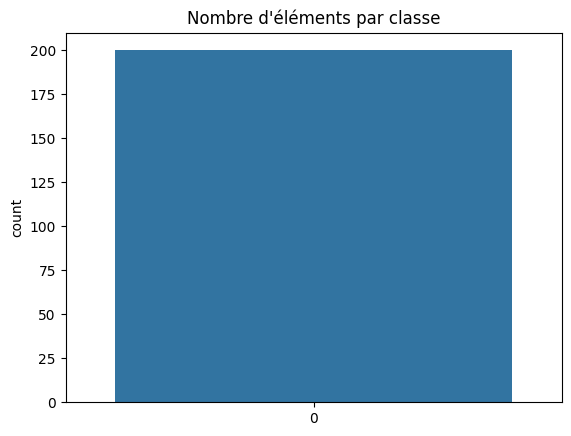

In [ ]:
my_path="Data_Project/Tiger-Fox-Elephant/"
my_classes=['elephant','Elephant_negative_class']
X,y=create_X_y (my_path,my_classes)
print ("Nombre de données : ",X.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
sns.countplot(np.array(y))
plt.title("Nombre d'éléments par classe")
# affichage
#plot_examples(X,y)

# Surtout ne pas oublier de normaliser les données avec :
X=X.astype('float')
X=X/255.0

X_elephant = copy.deepcopy(X)
y_elephant = copy.deepcopy(y)
#y_tiger = to_categorical(y_tiger) #one_hot encoding, on en a pas besoin quand on fait la classification binaire

#Quelques fonctions utiles

In [ ]:
#fonctions d'activation
def sigmoid(Z):
    return 1/(1+np.exp(-Z))

def relu(Z):
    return np.maximum(0,Z)

def valueoutput(y_hat):
    for i in range(len(y_hat)):
        if y_hat[i]>0.5:
            y_hat[i]=1
        else:
            y_hat[i]=0
    return y_hat

In [ ]:
def clean_data(train, test):
	# convertion d'entier en float
	train_norm = train.astype('float32')
	test_norm = test.astype('float32')
	# normalisation entre 0 et 1
	train_norm = train_norm / 255.0
	test_norm = test_norm / 255.0
	return train_norm, test_norm

In [ ]:
def plot_curves_confusion (history,confusion_matrix,class_names):
    plt.figure(1,figsize=(16,6))
    plt.gcf().subplots_adjust(left = 0.125, bottom = 0.2, right = 1,
                            top = 0.9, wspace = 0.25, hspace = 0)

    # division de la fenêtre graphique en 1 ligne, 3 colonnes,
    # graphique en position 1 - loss fonction

    plt.subplot(1,3,1)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['Training loss', 'Validation loss'], loc='upper left')
    # graphique en position 2 - accuracy
    plt.subplot(1,3,2)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['Training accuracy', 'Validation accuracy'], loc='upper left')

    # matrice de correlation
    plt.subplot(1,3,3)
    sns.heatmap(confusion_matrix,annot=True,fmt="d",cmap='Blues',xticklabels=class_names, yticklabels=class_names)# label=class_names)
    # labels, title and ticks
    plt.xlabel('Predicted', fontsize=12)
    #plt.set_label_position('top')
    #plt.set_ticklabels(class_names, fontsize = 8)
    #plt.tick_top()
    plt.title("Correlation matrix")
    plt.ylabel('True', fontsize=12)
    #plt.set_ticklabels(class_names, fontsize = 8)
    plt.show()


def plot_curves(histories, printk=True):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    colors = ['blue', 'orange']  # Couleurs pour les courbes Train et Validation
    labels = ['Train', 'Validation']

    for k, history in enumerate(histories, start=1):
        # Courbe de loss
        ax1.plot(history.history['loss'], color=colors[0])
        ax1.plot(history.history['val_loss'], color=colors[1])

        # Courbe d'accuracy
        ax2.plot(history.history['accuracy'], color=colors[0])
        ax2.plot(history.history['val_accuracy'], color=colors[1])

        if printk:
            # Ajout de la valeur de k sur les courbes
            ax1.text(len(history.history['loss']) - 1, history.history['loss'][-1], f'Fold={k}', ha='right', va='bottom', color='black')
            ax1.text(len(history.history['val_loss']) - 1, history.history['val_loss'][-1], f'Fold={k}', ha='right', va='top', color='black')
            ax2.text(len(history.history['accuracy']) - 1, history.history['accuracy'][-1], f'Fold={k}', ha='right', va='bottom', color='black')
            ax2.text(len(history.history['val_accuracy']) - 1, history.history['val_accuracy'][-1], f'Fold={k}', ha='right', va='top', color='black')

    ax1.set_title('Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend(labels)

    ax2.set_title('Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend(labels)

    plt.show()

#Modèle simple Baseline


In [ ]:
new_X=X.reshape(X.shape[0],X.shape[1]*X.shape[2]*X.shape[3]) #juste pour la visualisation
print(new_X.shape[0],new_X.shape[1])

200 46128


In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import RMSprop
from scikeras.wrappers import KerasClassifier, KerasRegressor
from sklearn.model_selection import GridSearchCV

# definition du premier modèle baseline
def define_model():
  # Créez votre modèle
  model1 = models.Sequential()
  model1.add(Conv2D(filters=32, kernel_size=(3, 3), input_shape=(124, 124, 3), activation='relu'))
  model1.add(layers.Flatten(input_shape=(124, 124, 3)))  # Couche Flatten pour les images en couleur (28x28x3)
  model1.add(layers.Dense(128, activation='relu'))
  model1.add(layers.Dense(1, activation='sigmoid'))

  model1.compile(optimizer='adam', loss='binary_crossentropy',metrics=['accuracy'])

  return model1

# Evaluation avec un k-fold
def evaluate_model(model, dataX, dataY, n_folds=5, epochs=10):
    scores, histories = list(), list()
    kfold = KFold(n_folds, shuffle=True, random_state=1)

    # parcourir les splits du k-fold
    for train_ix, test_ix in kfold.split(dataX):
        # selection des données
        X_train, y_train, X_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]

        # ré-initialisation du modèle
        model = define_model()
        # fit du modele
        history = model.fit(X_train, y_train, epochs=epochs, batch_size=32,
                            validation_data=(X_test, y_test), verbose=1)

        # evaluate du modele
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        y_pred = model.predict(X_test)

        #dans le cas du one_hot encoding, là le argmax va nous afficher l'indice de la ligne,
        #et donc là où on a 1 dans notre vecteur [0,0,1] va renvoyer 2 donc on sait que ça appartient à la classe 2
        y_pred_binary = (y_pred > 0.5).astype(int) # Convertir en étiquettes binaires
        conf = confusion_matrix(y_test, y_pred_binary)
        print(conf)
        plot_curves_confusion(history, conf, my_classes)

        print('accuracy %.3f' % (acc * 100.0))
        scores.append(acc)
        histories.append(history)

    return scores, histories


# fonction pour charger, transformer et évaluer le modele
# elle lance n-folds fois l'évaluation et affiche les courbes et résultats
def run_evaluation(n_folds, epochs, X_train, y_train, printk=True):
    # define model
    model = define_model()
    print(model.summary())
    # evaluate model
    scores, histories = evaluate_model(model, X_train, y_train, n_folds, epochs)
    plot_curves(histories, printk)
    print('Accuracy: mean=%.3f std=%.3f, n=%d' % (mean(scores)*100, std(scores)*100, len(scores)))

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_elephant, y_elephant, test_size=0.05, random_state=42)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 122, 122, 32)      896       
                                                                 
 flatten (Flatten)           (None, 476288)            0         
                                                                 
 dense (Dense)               (None, 128)               60964992  
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 60,966,017
Trainable params: 60,966,017
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/50
6/6 [==============================] - 15s 91ms/step - loss: 9.1434 - accuracy: 0.6550 - val_loss: 6.9795 - val_accuracy: 0.5789
Epoch 2/50
6/6 [===============

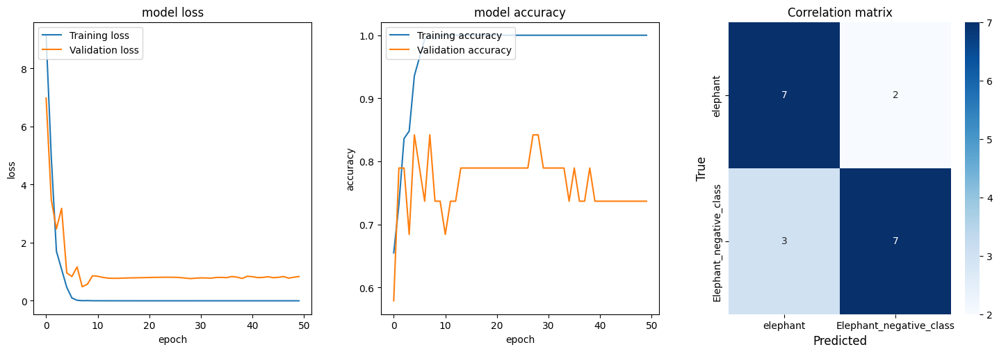

accuracy 73.684
Epoch 1/50
6/6 [==============================] - 3s 89ms/step - loss: 16.5643 - accuracy: 0.6023 - val_loss: 0.9249 - val_accuracy: 0.8421
Epoch 2/50
6/6 [==============================] - 0s 36ms/step - loss: 1.6158 - accuracy: 0.7719 - val_loss: 0.3645 - val_accuracy: 0.8947
Epoch 3/50
6/6 [==============================] - 0s 34ms/step - loss: 0.6181 - accuracy: 0.8889 - val_loss: 0.3798 - val_accuracy: 0.8421
Epoch 4/50
6/6 [==============================] - 0s 31ms/step - loss: 1.0419 - accuracy: 0.8538 - val_loss: 1.1874 - val_accuracy: 0.8421
Epoch 5/50
6/6 [==============================] - 0s 31ms/step - loss: 1.1841 - accuracy: 0.8304 - val_loss: 1.6789 - val_accuracy: 0.8421
Epoch 6/50
6/6 [==============================] - 0s 33ms/step - loss: 1.1070 - accuracy: 0.8129 - val_loss: 1.0062 - val_accuracy: 0.8947
Epoch 7/50
6/6 [==============================] - 0s 34ms/step - loss: 0.2967 - accuracy: 0.9532 - val_loss: 0.7975 - val_accuracy: 0.8947
Epoch 8/50

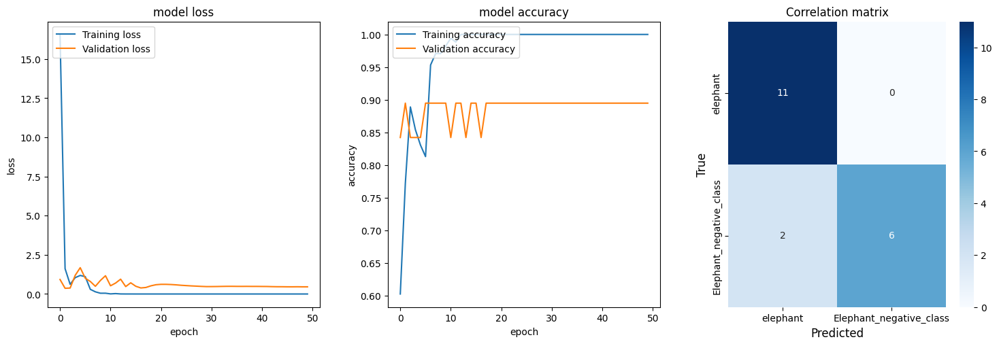

accuracy 89.474
Epoch 1/50
6/6 [==============================] - 2s 58ms/step - loss: 22.0069 - accuracy: 0.5673 - val_loss: 81.6766 - val_accuracy: 0.3684
Epoch 2/50
6/6 [==============================] - 0s 29ms/step - loss: 35.7996 - accuracy: 0.5439 - val_loss: 8.8176 - val_accuracy: 0.6316
Epoch 3/50
6/6 [==============================] - 0s 28ms/step - loss: 9.0178 - accuracy: 0.4912 - val_loss: 1.3482 - val_accuracy: 0.6316
Epoch 4/50
6/6 [==============================] - 0s 30ms/step - loss: 1.7334 - accuracy: 0.6199 - val_loss: 2.1906 - val_accuracy: 0.3684
Epoch 5/50
6/6 [==============================] - 0s 33ms/step - loss: 0.7639 - accuracy: 0.6433 - val_loss: 0.5343 - val_accuracy: 0.6316
Epoch 6/50
6/6 [==============================] - 0s 32ms/step - loss: 0.4246 - accuracy: 0.8129 - val_loss: 0.4854 - val_accuracy: 0.8421
Epoch 7/50
6/6 [==============================] - 0s 31ms/step - loss: 0.3198 - accuracy: 0.9123 - val_loss: 0.4181 - val_accuracy: 0.8947
Epoch 8/

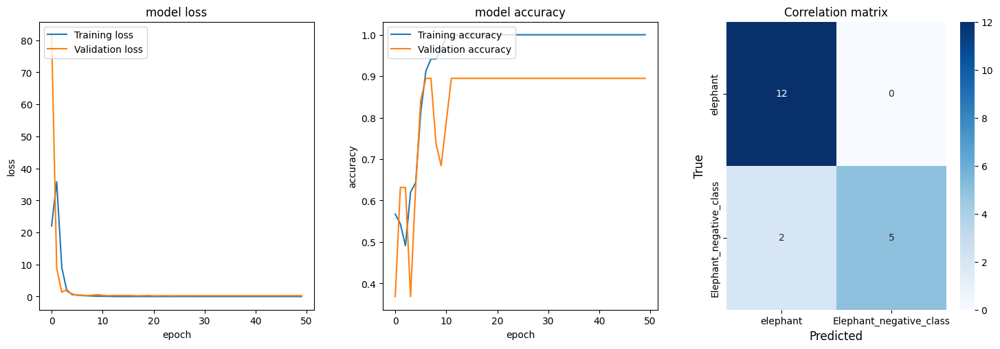

accuracy 89.474
Epoch 1/50
6/6 [==============================] - 2s 64ms/step - loss: 24.3541 - accuracy: 0.5556 - val_loss: 17.5005 - val_accuracy: 0.4737
Epoch 2/50
6/6 [==============================] - 0s 28ms/step - loss: 10.7339 - accuracy: 0.6433 - val_loss: 5.6970 - val_accuracy: 0.5263
Epoch 3/50
6/6 [==============================] - 0s 27ms/step - loss: 3.3461 - accuracy: 0.7778 - val_loss: 2.5955 - val_accuracy: 0.7895
Epoch 4/50
6/6 [==============================] - 0s 28ms/step - loss: 1.0611 - accuracy: 0.8830 - val_loss: 2.3759 - val_accuracy: 0.6316
Epoch 5/50
6/6 [==============================] - 0s 26ms/step - loss: 0.8204 - accuracy: 0.8889 - val_loss: 1.2898 - val_accuracy: 0.8421
Epoch 6/50
6/6 [==============================] - 0s 26ms/step - loss: 0.3647 - accuracy: 0.9123 - val_loss: 0.6766 - val_accuracy: 0.8421
Epoch 7/50
6/6 [==============================] - 0s 27ms/step - loss: 0.1530 - accuracy: 0.9357 - val_loss: 0.6651 - val_accuracy: 0.8947
Epoch 8/

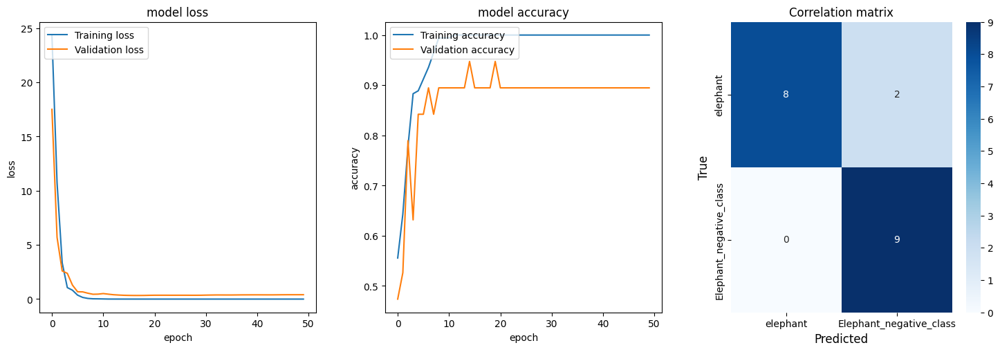

accuracy 89.474
Epoch 1/50
6/6 [==============================] - 2s 82ms/step - loss: 21.9904 - accuracy: 0.5029 - val_loss: 22.2132 - val_accuracy: 0.4211
Epoch 2/50
6/6 [==============================] - 0s 39ms/step - loss: 10.4935 - accuracy: 0.5029 - val_loss: 5.7923 - val_accuracy: 0.5789
Epoch 3/50
6/6 [==============================] - 0s 34ms/step - loss: 3.6793 - accuracy: 0.6433 - val_loss: 4.1698 - val_accuracy: 0.4211
Epoch 4/50
6/6 [==============================] - 0s 30ms/step - loss: 0.8749 - accuracy: 0.7719 - val_loss: 0.1753 - val_accuracy: 0.9474
Epoch 5/50
6/6 [==============================] - 0s 35ms/step - loss: 0.3874 - accuracy: 0.8304 - val_loss: 0.1552 - val_accuracy: 0.9474
Epoch 6/50
6/6 [==============================] - 0s 30ms/step - loss: 0.2439 - accuracy: 0.9123 - val_loss: 0.4095 - val_accuracy: 0.7895
Epoch 7/50
6/6 [==============================] - 0s 29ms/step - loss: 0.1789 - accuracy: 0.9532 - val_loss: 0.1894 - val_accuracy: 0.9474
Epoch 8/

1/1 [==============================] - 0s 92ms/step
[[8 3]
 [0 8]]


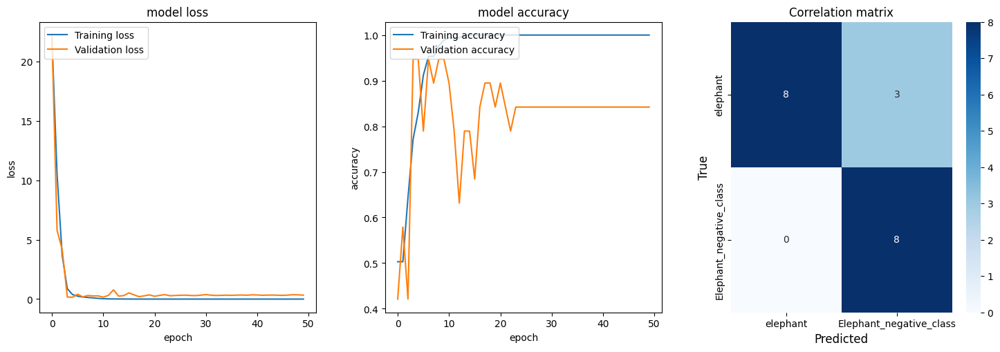

accuracy 84.211
Epoch 1/50
6/6 [==============================] - 2s 80ms/step - loss: 22.4066 - accuracy: 0.5673 - val_loss: 1.7833 - val_accuracy: 0.7368
Epoch 2/50
6/6 [==============================] - 0s 35ms/step - loss: 2.8199 - accuracy: 0.7836 - val_loss: 0.9376 - val_accuracy: 0.8947
Epoch 3/50
6/6 [==============================] - 0s 34ms/step - loss: 1.1159 - accuracy: 0.8129 - val_loss: 2.4502 - val_accuracy: 0.7368
Epoch 4/50
6/6 [==============================] - 0s 35ms/step - loss: 0.9099 - accuracy: 0.8713 - val_loss: 0.7584 - val_accuracy: 0.8947
Epoch 5/50
6/6 [==============================] - 0s 30ms/step - loss: 0.1887 - accuracy: 0.9474 - val_loss: 1.5086 - val_accuracy: 0.7368
Epoch 6/50
6/6 [==============================] - 0s 27ms/step - loss: 0.1669 - accuracy: 0.9532 - val_loss: 0.9148 - val_accuracy: 0.8421
Epoch 7/50
6/6 [==============================] - 0s 26ms/step - loss: 0.0266 - accuracy: 0.9825 - val_loss: 0.7509 - val_accuracy: 0.7895
Epoch 8/50

1/1 [==============================] - 0s 62ms/step
[[ 5  1]
 [ 3 10]]


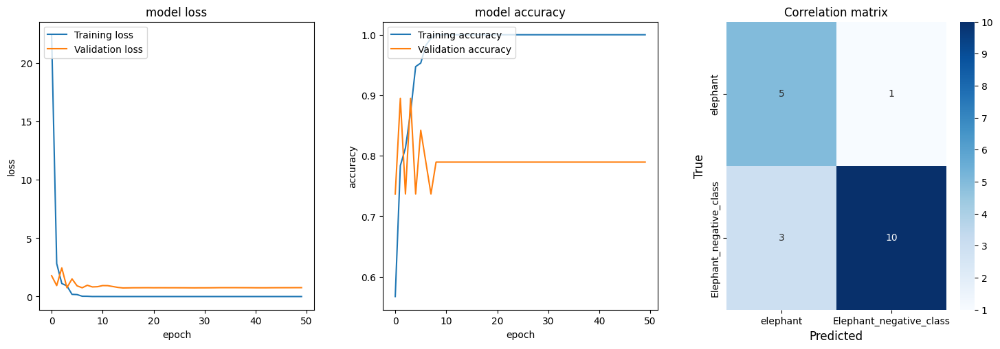

accuracy 78.947
Epoch 1/50
6/6 [==============================] - 2s 62ms/step - loss: 13.9109 - accuracy: 0.4854 - val_loss: 11.2932 - val_accuracy: 0.5263
Epoch 2/50
6/6 [==============================] - 0s 30ms/step - loss: 7.0868 - accuracy: 0.5673 - val_loss: 4.2523 - val_accuracy: 0.6842
Epoch 3/50
6/6 [==============================] - 0s 29ms/step - loss: 1.7415 - accuracy: 0.7427 - val_loss: 1.0502 - val_accuracy: 0.6842
Epoch 4/50
6/6 [==============================] - 0s 28ms/step - loss: 0.6220 - accuracy: 0.8596 - val_loss: 1.2392 - val_accuracy: 0.7368
Epoch 5/50
6/6 [==============================] - 0s 27ms/step - loss: 0.3253 - accuracy: 0.8772 - val_loss: 0.3642 - val_accuracy: 0.8421
Epoch 6/50
6/6 [==============================] - 0s 26ms/step - loss: 0.1000 - accuracy: 0.9708 - val_loss: 0.7768 - val_accuracy: 0.7368
Epoch 7/50
6/6 [==============================] - 0s 27ms/step - loss: 0.0661 - accuracy: 0.9708 - val_loss: 0.7142 - val_accuracy: 0.7368
Epoch 8/5

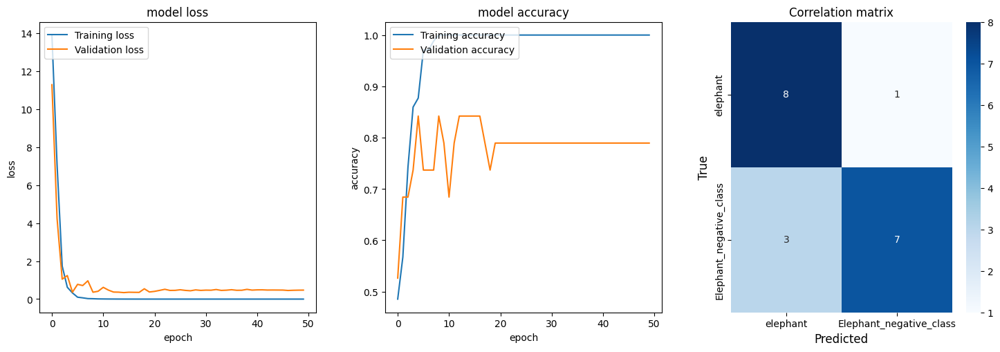

accuracy 78.947
Epoch 1/50
6/6 [==============================] - 2s 75ms/step - loss: 20.5628 - accuracy: 0.5146 - val_loss: 8.1609 - val_accuracy: 0.6316
Epoch 2/50
6/6 [==============================] - 0s 35ms/step - loss: 4.0740 - accuracy: 0.7076 - val_loss: 7.5581 - val_accuracy: 0.6316
Epoch 3/50
6/6 [==============================] - 0s 35ms/step - loss: 2.9698 - accuracy: 0.7427 - val_loss: 1.7307 - val_accuracy: 0.6842
Epoch 4/50
6/6 [==============================] - 0s 31ms/step - loss: 0.7982 - accuracy: 0.8070 - val_loss: 1.4245 - val_accuracy: 0.8421
Epoch 5/50
6/6 [==============================] - 0s 34ms/step - loss: 0.2004 - accuracy: 0.9415 - val_loss: 0.6105 - val_accuracy: 0.7368
Epoch 6/50
6/6 [==============================] - 0s 33ms/step - loss: 0.0880 - accuracy: 0.9766 - val_loss: 0.4906 - val_accuracy: 0.7895
Epoch 7/50
6/6 [==============================] - 0s 31ms/step - loss: 0.0599 - accuracy: 0.9766 - val_loss: 0.5027 - val_accuracy: 0.7368
Epoch 8/50

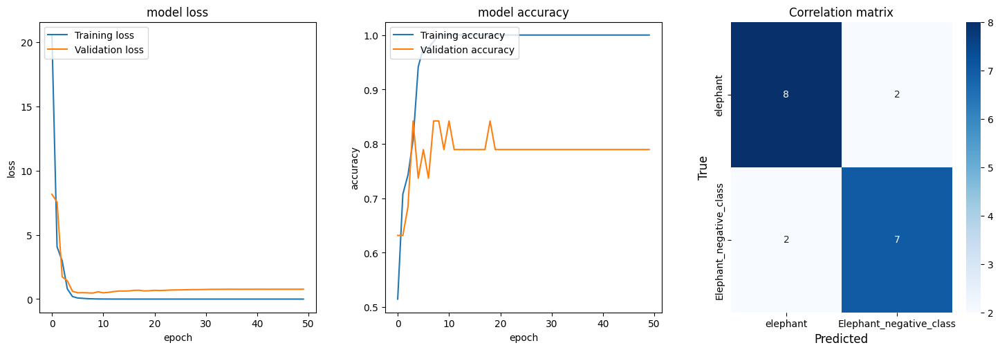

accuracy 78.947
Epoch 1/50
6/6 [==============================] - 2s 63ms/step - loss: 41.7229 - accuracy: 0.5497 - val_loss: 16.0913 - val_accuracy: 0.3684
Epoch 2/50
6/6 [==============================] - 0s 31ms/step - loss: 10.3351 - accuracy: 0.6140 - val_loss: 4.7801 - val_accuracy: 0.6842
Epoch 3/50
6/6 [==============================] - 0s 29ms/step - loss: 4.6513 - accuracy: 0.7193 - val_loss: 0.5873 - val_accuracy: 0.8947
Epoch 4/50
6/6 [==============================] - 0s 27ms/step - loss: 1.2864 - accuracy: 0.8070 - val_loss: 0.3168 - val_accuracy: 0.8421
Epoch 5/50
6/6 [==============================] - 0s 27ms/step - loss: 0.8742 - accuracy: 0.8655 - val_loss: 0.2476 - val_accuracy: 0.8947
Epoch 6/50
6/6 [==============================] - 0s 27ms/step - loss: 0.3855 - accuracy: 0.9181 - val_loss: 0.3718 - val_accuracy: 0.8947
Epoch 7/50
6/6 [==============================] - 0s 26ms/step - loss: 0.1277 - accuracy: 0.9532 - val_loss: 0.2044 - val_accuracy: 0.9474
Epoch 8/

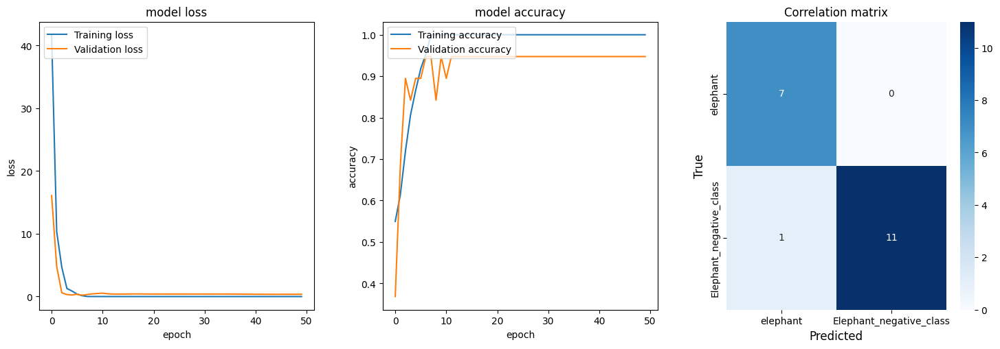

accuracy 94.737
Epoch 1/50
6/6 [==============================] - 2s 83ms/step - loss: 11.2939 - accuracy: 0.5263 - val_loss: 13.6591 - val_accuracy: 0.5263
Epoch 2/50
6/6 [==============================] - 0s 38ms/step - loss: 6.5486 - accuracy: 0.5497 - val_loss: 0.2313 - val_accuracy: 0.8947
Epoch 3/50
6/6 [==============================] - 0s 32ms/step - loss: 1.0447 - accuracy: 0.7953 - val_loss: 0.8205 - val_accuracy: 0.7368
Epoch 4/50
6/6 [==============================] - 0s 35ms/step - loss: 0.2768 - accuracy: 0.8830 - val_loss: 0.1198 - val_accuracy: 0.9474
Epoch 5/50
6/6 [==============================] - 0s 34ms/step - loss: 0.1621 - accuracy: 0.9181 - val_loss: 0.1846 - val_accuracy: 0.8947
Epoch 6/50
6/6 [==============================] - 0s 37ms/step - loss: 0.0919 - accuracy: 0.9649 - val_loss: 0.1438 - val_accuracy: 0.8947
Epoch 7/50
6/6 [==============================] - 0s 32ms/step - loss: 0.0557 - accuracy: 0.9942 - val_loss: 0.4314 - val_accuracy: 0.7895
Epoch 8/5

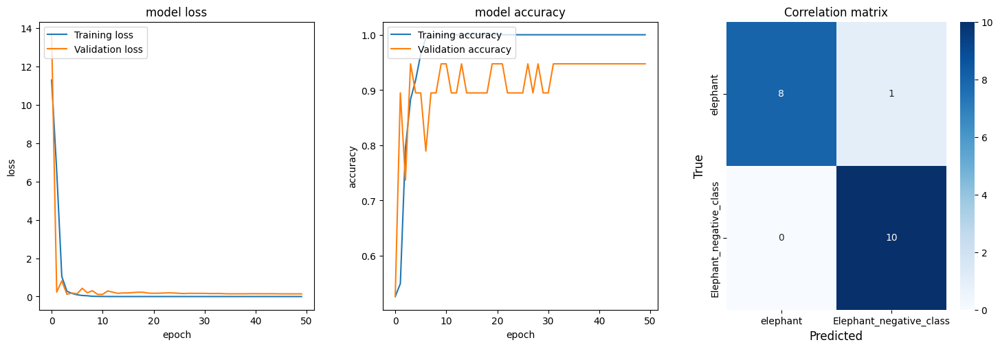

accuracy 94.737


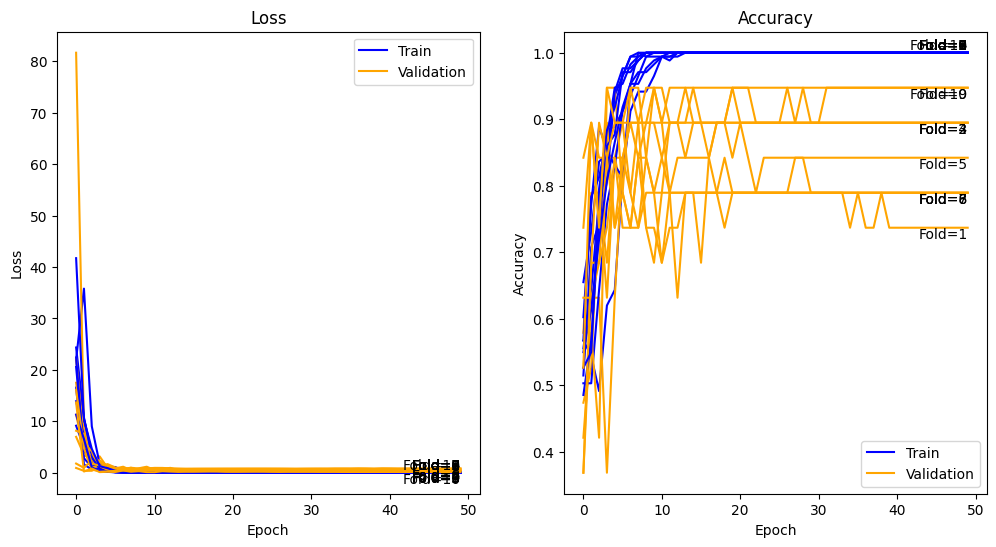

Accuracy: mean=85.263 std=6.982, n=10


In [ ]:
n_folds=10
epochs=50
run_evaluation(n_folds,epochs,X_train,y_train,printk=True)

On voit clairement qu'on fait du **overfitting**, les courbes d'apprentissage montrent que :

* La courbe *loss* pour l'entraînement continue de diminuer.
* La courbe *loss* pour la validation diminue jusqu'à un certain point et recommence à augmenter.
* La courbe *accuracy* pour l'entraintement monte jusqu'à 100%.
* La courbe *accuracy* pour la validation reste stagnée à un moment.

#Amélioration : Ajout Droupout + faire varier nbr filtres + taille filtres + batch size + kernel_size

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import RMSprop
from scikeras.wrappers import KerasClassifier, KerasRegressor
from sklearn.model_selection import GridSearchCV

# definition du premier modèle baseline
def define_modeleElephant(fi,ks):
  # Créez votre modèle
  model1 = models.Sequential()
  model1.add(Conv2D(filters=fi, kernel_size=ks, input_shape=(124, 124, 3), activation='relu'))
  model1.add(Dropout(0.2))
  model1.add(layers.Flatten(input_shape=(124, 124, 3)))  # Couche Flatten pour les images en couleur (28x28x3)
  model1.add(Dropout(0.2))
  model1.add(layers.Dense(128, activation='relu'))
  model1.add(Dropout(0.2))
  model1.add(layers.Dense(1, activation='sigmoid'))

  model1.compile(optimizer='adam', loss='binary_crossentropy',metrics=['accuracy'])

  return model1

# Evaluation avec un k-fold
def evaluate_model(model, dataX, dataY,fi,ks,bs, n_folds=5, epochs=10):
    scores, histories = list(), list()
    kfold = KFold(n_folds, shuffle=True, random_state=1)

    # parcourir les splits du k-fold
    for train_ix, test_ix in kfold.split(dataX):
        # selection des données
        X_train, y_train, X_test, y_test = dataX[train_ix], dataY[train_ix], dataX[test_ix], dataY[test_ix]

        # ré-initialisation du modèle
        model = define_modeleElephant(fi,ks)
        # fit du modele
        history = model.fit(X_train, y_train, epochs=epochs, batch_size=bs,
                            validation_data=(X_test, y_test), verbose=1)

        # evaluate du modele
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        y_pred = model.predict(X_test)

        #dans le cas du one_hot encoding, là le argmax va nous afficher l'indice de la ligne,
        #et donc là où on a 1 dans notre vecteur [0,0,1] va renvoyer 2 donc on sait que ça appartient à la classe 2
        y_pred_binary = (y_pred > 0.5).astype(int) # Convertir en étiquettes binaires
        conf = confusion_matrix(y_test, y_pred_binary)
        print(conf)
        plot_curves_confusion(history, conf, my_classes)

        print('accuracy %.3f' % (acc * 100.0))
        scores.append(acc)
        histories.append(history)

    return scores, histories

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_elephant, y_elephant, test_size=0.05, random_state=42)

Testing: Filters=10, Kernel=(1, 1), Batch size=5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 124, 124, 10)      40        
                                                                 
 dropout (Dropout)           (None, 124, 124, 10)      0         
                                                                 
 flatten (Flatten)           (None, 153760)            0         
                                                                 
 dropout_1 (Dropout)         (None, 153760)            0         
                                                                 
 dense (Dense)               (None, 128)               19681408  
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_

2023-11-24 10:33:55.446302: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-24 10:33:55.448714: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-11-24 10:33:55.448943: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

None
Epoch 1/20


2023-11-24 10:33:59.427476: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/dropout_3/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2023-11-24 10:34:00.160619: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x589b4fdca3b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-11-24 10:34:00.160666: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2023-11-24 10:34:00.167990: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-11-24 10:34:00.352234: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8906
2023-11-24 10:34:00.553102: I ./tensorflow/compiler/jit/device_compiler.h:180] Compiled cluste

31/31 [==============================] - 5s 57ms/step - loss: 7.1468 - accuracy: 0.5855 - val_loss: 4.9588 - val_accuracy: 0.6053
Epoch 2/20
31/31 [==============================] - 0s 11ms/step - loss: 2.3809 - accuracy: 0.7500 - val_loss: 1.3702 - val_accuracy: 0.8421
Epoch 3/20
31/31 [==============================] - 0s 12ms/step - loss: 1.4103 - accuracy: 0.8158 - val_loss: 0.6135 - val_accuracy: 0.8947
Epoch 4/20
31/31 [==============================] - 0s 11ms/step - loss: 0.8268 - accuracy: 0.8289 - val_loss: 0.6143 - val_accuracy: 0.8158
Epoch 5/20
31/31 [==============================] - 0s 10ms/step - loss: 0.3794 - accuracy: 0.8553 - val_loss: 0.5604 - val_accuracy: 0.8684
Epoch 6/20
31/31 [==============================] - 0s 10ms/step - loss: 0.4577 - accuracy: 0.8355 - val_loss: 0.3287 - val_accuracy: 0.8421
Epoch 7/20
31/31 [==============================] - 0s 11ms/step - loss: 0.3359 - accuracy: 0.8882 - val_loss: 0.5029 - val_accuracy: 0.8421
Epoch 8/20
31/31 [======

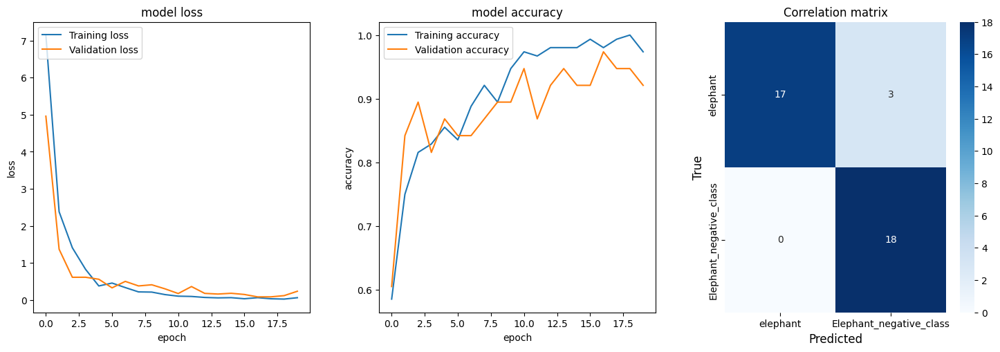

accuracy 92.105
Epoch 1/20


2023-11-24 10:34:11.765022: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_2/dropout_6/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 2s 14ms/step - loss: 4.3129 - accuracy: 0.5592 - val_loss: 2.0576 - val_accuracy: 0.7105
Epoch 2/20
31/31 [==============================] - 0s 9ms/step - loss: 1.9090 - accuracy: 0.7368 - val_loss: 0.7234 - val_accuracy: 0.7895
Epoch 3/20
31/31 [==============================] - 0s 10ms/step - loss: 0.5843 - accuracy: 0.8092 - val_loss: 0.3981 - val_accuracy: 0.7895
Epoch 4/20
31/31 [==============================] - 0s 9ms/step - loss: 0.2832 - accuracy: 0.8816 - val_loss: 0.8070 - val_accuracy: 0.6842
Epoch 5/20
31/31 [==============================] - 0s 9ms/step - loss: 0.3320 - accuracy: 0.8618 - val_loss: 0.3621 - val_accuracy: 0.8947
Epoch 6/20
31/31 [==============================] - 0s 9ms/step - loss: 0.2688 - accuracy: 0.8882 - val_loss: 0.5012 - val_accuracy: 0.8421
Epoch 7/20
31/31 [==============================] - 0s 9ms/step - loss: 0.1781 - accuracy: 0.9276 - val_loss: 1.0370 - val_accuracy: 0.6579
Epoch 8/20
31/31 [===========

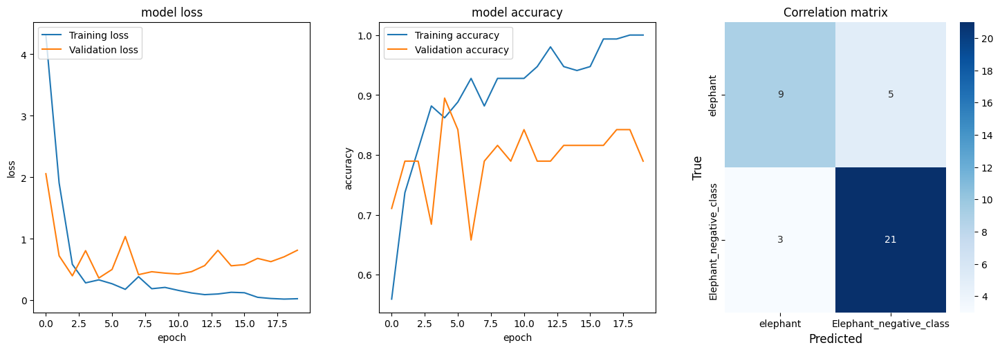

accuracy 78.947
Epoch 1/20


2023-11-24 10:34:24.947250: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_3/dropout_9/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 20ms/step - loss: 13.3535 - accuracy: 0.5855 - val_loss: 6.1152 - val_accuracy: 0.5789
Epoch 2/20
31/31 [==============================] - 0s 11ms/step - loss: 4.0618 - accuracy: 0.7368 - val_loss: 0.9252 - val_accuracy: 0.8684
Epoch 3/20
31/31 [==============================] - 0s 11ms/step - loss: 1.0377 - accuracy: 0.8421 - val_loss: 0.7680 - val_accuracy: 0.8684
Epoch 4/20
31/31 [==============================] - 0s 9ms/step - loss: 0.6822 - accuracy: 0.8289 - val_loss: 0.3388 - val_accuracy: 0.8947
Epoch 5/20
31/31 [==============================] - 0s 9ms/step - loss: 0.2198 - accuracy: 0.9211 - val_loss: 0.1546 - val_accuracy: 0.9474
Epoch 6/20
31/31 [==============================] - 0s 9ms/step - loss: 0.1954 - accuracy: 0.9342 - val_loss: 0.2187 - val_accuracy: 0.9474
Epoch 7/20
31/31 [==============================] - 0s 9ms/step - loss: 0.2460 - accuracy: 0.8816 - val_loss: 0.2023 - val_accuracy: 0.9474
Epoch 8/20
31/31 [=========

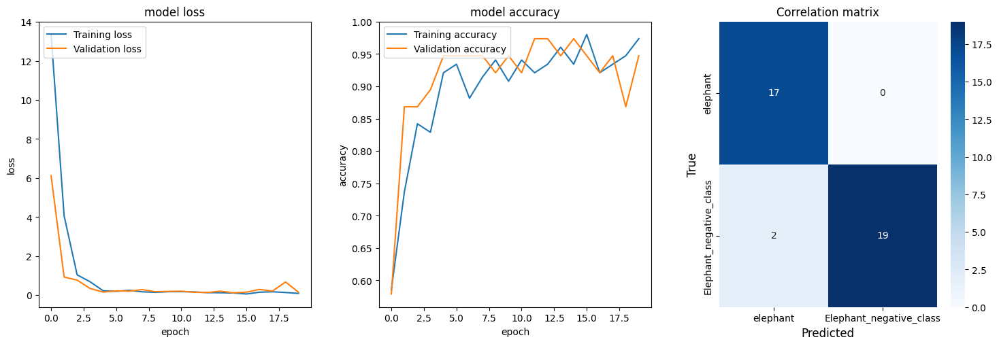

accuracy 94.737
Epoch 1/20


2023-11-24 10:34:36.990845: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_4/dropout_12/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 35ms/step - loss: 8.5474 - accuracy: 0.5526 - val_loss: 1.3251 - val_accuracy: 0.7895
Epoch 2/20
31/31 [==============================] - 1s 32ms/step - loss: 3.3329 - accuracy: 0.6447 - val_loss: 1.4833 - val_accuracy: 0.6053
Epoch 3/20
31/31 [==============================] - 1s 19ms/step - loss: 1.4276 - accuracy: 0.6974 - val_loss: 0.3446 - val_accuracy: 0.8158
Epoch 4/20
31/31 [==============================] - 1s 35ms/step - loss: 0.4480 - accuracy: 0.8487 - val_loss: 0.3880 - val_accuracy: 0.8158
Epoch 5/20
31/31 [==============================] - 1s 23ms/step - loss: 0.3657 - accuracy: 0.8289 - val_loss: 0.2869 - val_accuracy: 0.8684
Epoch 6/20
31/31 [==============================] - 0s 11ms/step - loss: 0.3689 - accuracy: 0.8355 - val_loss: 0.3132 - val_accuracy: 0.8421
Epoch 7/20
31/31 [==============================] - 0s 12ms/step - loss: 0.3377 - accuracy: 0.9013 - val_loss: 0.2260 - val_accuracy: 0.8684
Epoch 8/20
31/31 [======

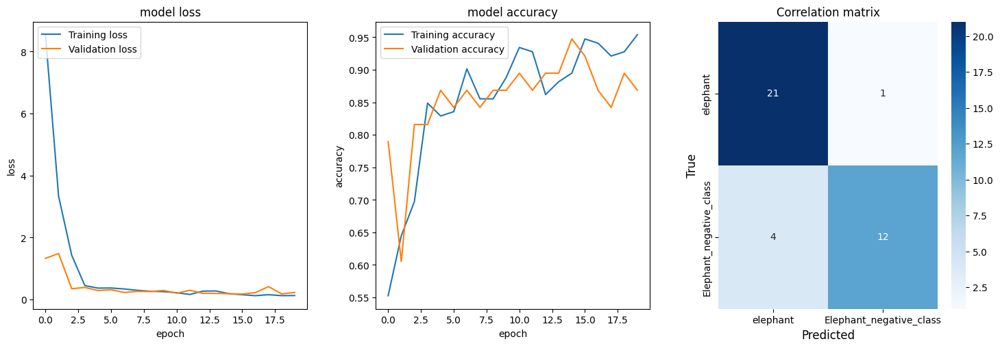

accuracy 86.842
Epoch 1/20


2023-11-24 10:34:50.146288: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_5/dropout_15/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 2s 15ms/step - loss: 11.4902 - accuracy: 0.5526 - val_loss: 2.2832 - val_accuracy: 0.7105
Epoch 2/20
31/31 [==============================] - 0s 11ms/step - loss: 2.3239 - accuracy: 0.7829 - val_loss: 2.2289 - val_accuracy: 0.7368
Epoch 3/20
31/31 [==============================] - 0s 11ms/step - loss: 1.3810 - accuracy: 0.8026 - val_loss: 0.7986 - val_accuracy: 0.7895
Epoch 4/20
31/31 [==============================] - 0s 10ms/step - loss: 0.6870 - accuracy: 0.8224 - val_loss: 0.5155 - val_accuracy: 0.8158
Epoch 5/20
31/31 [==============================] - 0s 9ms/step - loss: 0.2774 - accuracy: 0.8750 - val_loss: 0.4537 - val_accuracy: 0.7895
Epoch 6/20
31/31 [==============================] - 0s 10ms/step - loss: 0.2382 - accuracy: 0.8947 - val_loss: 0.4370 - val_accuracy: 0.8158
Epoch 7/20
31/31 [==============================] - 0s 9ms/step - loss: 0.2148 - accuracy: 0.9013 - val_loss: 0.3920 - val_accuracy: 0.7895
Epoch 8/20
31/31 [=======

2/2 [==============================] - 0s 9ms/step
[[19  2]
 [ 1 16]]


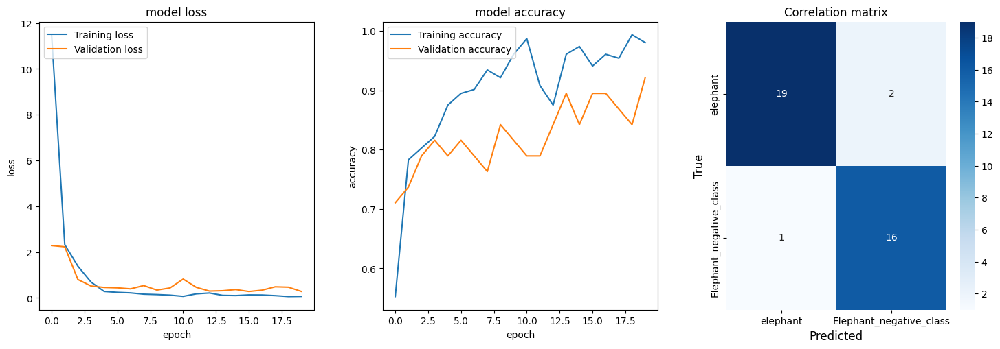

accuracy 92.105
Accuracy: mean=88.947 std=5.620, n=5
Testing: Filters=10, Kernel=(1, 1), Batch size=10
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 124, 124, 10)      40        
                                                                 
 dropout_18 (Dropout)        (None, 124, 124, 10)      0         
                                                                 
 flatten_6 (Flatten)         (None, 153760)            0         
                                                                 
 dropout_19 (Dropout)        (None, 153760)            0         
                                                                 
 dense_12 (Dense)            (None, 128)               19681408  
                                                                 
 dropout_20 (Dropout)        (None, 128)               0         
                 

2023-11-24 10:34:59.168025: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_7/dropout_21/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 38ms/step - loss: 9.8089 - accuracy: 0.5855 - val_loss: 1.5379 - val_accuracy: 0.7895
Epoch 2/20
16/16 [==============================] - 0s 14ms/step - loss: 2.5658 - accuracy: 0.7895 - val_loss: 1.1467 - val_accuracy: 0.7895
Epoch 3/20
16/16 [==============================] - 0s 15ms/step - loss: 1.5220 - accuracy: 0.7697 - val_loss: 0.5588 - val_accuracy: 0.8158
Epoch 4/20
16/16 [==============================] - 0s 14ms/step - loss: 0.6901 - accuracy: 0.8421 - val_loss: 0.7345 - val_accuracy: 0.7105
Epoch 5/20
16/16 [==============================] - 0s 14ms/step - loss: 0.5947 - accuracy: 0.8026 - val_loss: 0.5638 - val_accuracy: 0.7895
Epoch 6/20
16/16 [==============================] - 0s 13ms/step - loss: 0.4650 - accuracy: 0.8289 - val_loss: 0.5746 - val_accuracy: 0.7368
Epoch 7/20
16/16 [==============================] - 0s 14ms/step - loss: 0.3371 - accuracy: 0.8553 - val_loss: 0.2773 - val_accuracy: 0.8947
Epoch 8/20
16/16 [======

2/2 [==============================] - 0s 6ms/step
[[19  1]
 [ 1 17]]


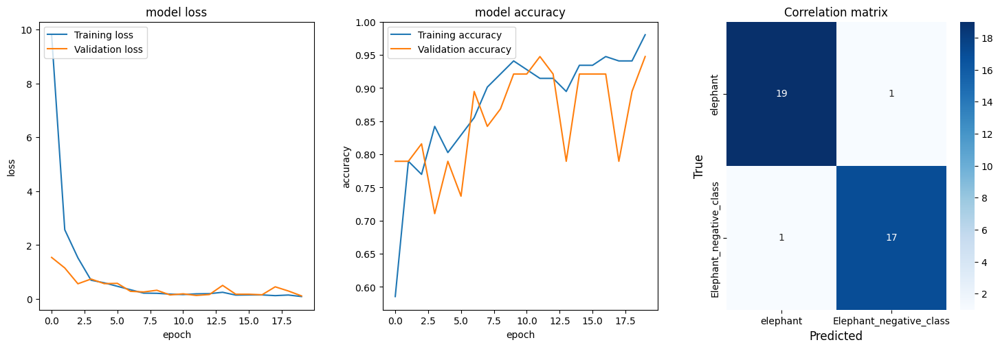

accuracy 94.737
Epoch 1/20


2023-11-24 10:35:11.259387: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_8/dropout_24/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 24ms/step - loss: 3.0194 - accuracy: 0.6184 - val_loss: 0.7912 - val_accuracy: 0.6316
Epoch 2/20
16/16 [==============================] - 0s 13ms/step - loss: 0.6995 - accuracy: 0.7829 - val_loss: 0.4669 - val_accuracy: 0.7895
Epoch 3/20
16/16 [==============================] - 0s 12ms/step - loss: 0.3880 - accuracy: 0.8553 - val_loss: 0.3341 - val_accuracy: 0.8421
Epoch 4/20
16/16 [==============================] - 0s 12ms/step - loss: 0.2380 - accuracy: 0.9013 - val_loss: 0.2396 - val_accuracy: 0.9211
Epoch 5/20
16/16 [==============================] - 0s 12ms/step - loss: 0.3008 - accuracy: 0.8684 - val_loss: 0.3034 - val_accuracy: 0.8684
Epoch 6/20
16/16 [==============================] - 0s 12ms/step - loss: 0.2004 - accuracy: 0.9342 - val_loss: 0.3690 - val_accuracy: 0.8158
Epoch 7/20
16/16 [==============================] - 0s 12ms/step - loss: 0.1392 - accuracy: 0.9474 - val_loss: 0.3564 - val_accuracy: 0.8158
Epoch 8/20
16/16 [======

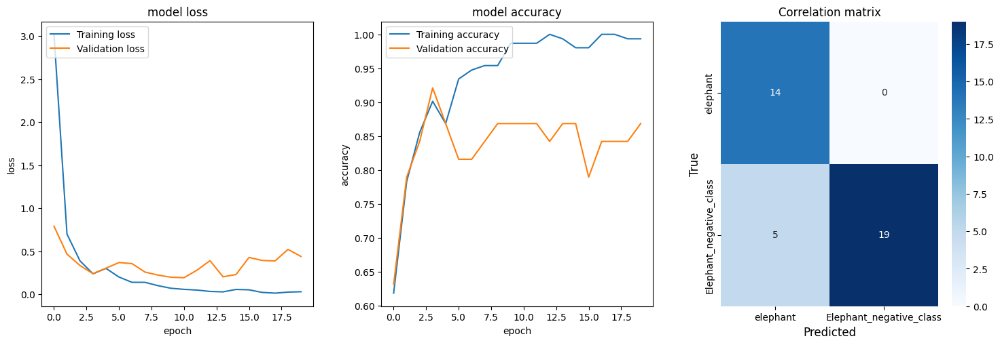

accuracy 86.842
Epoch 1/20


2023-11-24 10:35:18.381053: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_9/dropout_27/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 29ms/step - loss: 7.5442 - accuracy: 0.6645 - val_loss: 0.9281 - val_accuracy: 0.8158
Epoch 2/20
16/16 [==============================] - 0s 14ms/step - loss: 2.7243 - accuracy: 0.7303 - val_loss: 0.7565 - val_accuracy: 0.8684
Epoch 3/20
16/16 [==============================] - 0s 14ms/step - loss: 1.1491 - accuracy: 0.8092 - val_loss: 0.9304 - val_accuracy: 0.8947
Epoch 4/20
16/16 [==============================] - 0s 14ms/step - loss: 1.0455 - accuracy: 0.8355 - val_loss: 0.4603 - val_accuracy: 0.8158
Epoch 5/20
16/16 [==============================] - 0s 14ms/step - loss: 0.3864 - accuracy: 0.9013 - val_loss: 1.1526 - val_accuracy: 0.8421
Epoch 6/20
16/16 [==============================] - 0s 13ms/step - loss: 0.6045 - accuracy: 0.8553 - val_loss: 0.5338 - val_accuracy: 0.8421
Epoch 7/20
16/16 [==============================] - 0s 13ms/step - loss: 0.2726 - accuracy: 0.8882 - val_loss: 0.3729 - val_accuracy: 0.8684
Epoch 8/20
16/16 [======

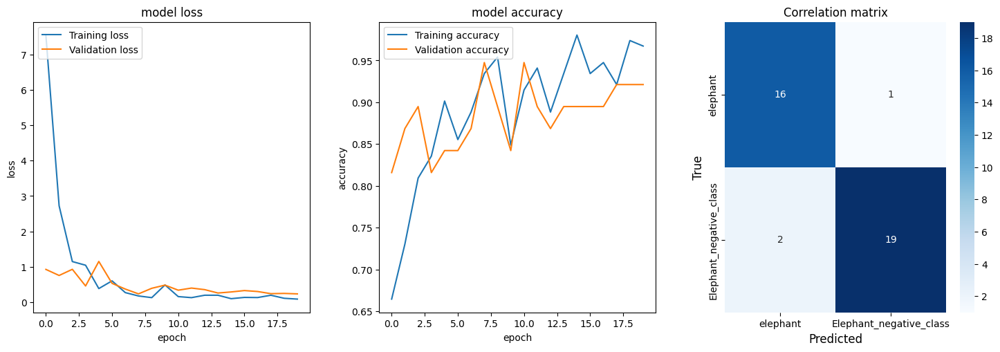

accuracy 92.105
Epoch 1/20


2023-11-24 10:35:30.425954: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_10/dropout_30/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 23ms/step - loss: 4.4426 - accuracy: 0.5855 - val_loss: 0.7256 - val_accuracy: 0.7895
Epoch 2/20
16/16 [==============================] - 0s 13ms/step - loss: 1.2159 - accuracy: 0.7895 - val_loss: 0.7134 - val_accuracy: 0.7895
Epoch 3/20
16/16 [==============================] - 0s 12ms/step - loss: 0.7029 - accuracy: 0.8289 - val_loss: 0.3381 - val_accuracy: 0.8947
Epoch 4/20
16/16 [==============================] - 0s 11ms/step - loss: 0.8566 - accuracy: 0.8158 - val_loss: 0.5562 - val_accuracy: 0.8158
Epoch 5/20
16/16 [==============================] - 0s 13ms/step - loss: 0.6150 - accuracy: 0.8092 - val_loss: 0.5173 - val_accuracy: 0.8158
Epoch 6/20
16/16 [==============================] - 0s 12ms/step - loss: 0.2176 - accuracy: 0.8947 - val_loss: 0.3244 - val_accuracy: 0.8947
Epoch 7/20
16/16 [==============================] - 0s 12ms/step - loss: 0.1838 - accuracy: 0.9145 - val_loss: 0.2759 - val_accuracy: 0.8947
Epoch 8/20
16/16 [======

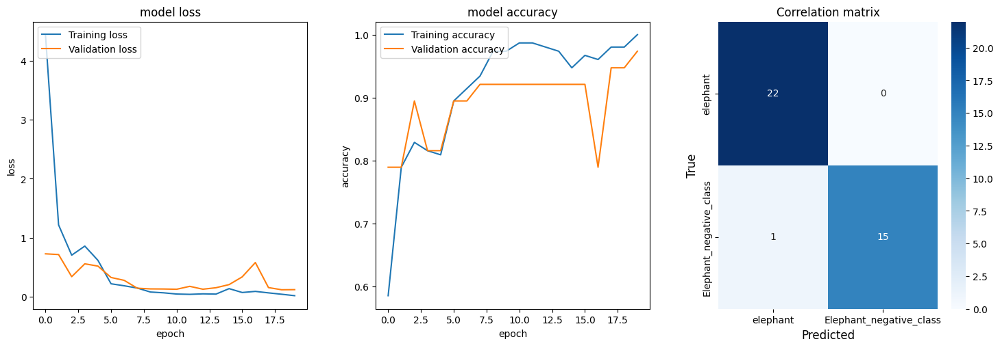

accuracy 97.368
Epoch 1/20


2023-11-24 10:35:37.542455: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_11/dropout_33/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 29ms/step - loss: 6.7981 - accuracy: 0.5855 - val_loss: 1.9977 - val_accuracy: 0.6579
Epoch 2/20
16/16 [==============================] - 0s 15ms/step - loss: 1.7959 - accuracy: 0.7237 - val_loss: 0.7410 - val_accuracy: 0.8158
Epoch 3/20
16/16 [==============================] - 0s 14ms/step - loss: 1.7305 - accuracy: 0.7303 - val_loss: 1.0556 - val_accuracy: 0.6842
Epoch 4/20
16/16 [==============================] - 0s 18ms/step - loss: 0.3887 - accuracy: 0.8750 - val_loss: 0.4284 - val_accuracy: 0.8158
Epoch 5/20
16/16 [==============================] - 0s 18ms/step - loss: 0.3438 - accuracy: 0.8816 - val_loss: 0.5359 - val_accuracy: 0.7632
Epoch 6/20
16/16 [==============================] - 0s 15ms/step - loss: 0.2572 - accuracy: 0.9079 - val_loss: 0.4594 - val_accuracy: 0.7632
Epoch 7/20
16/16 [==============================] - 0s 16ms/step - loss: 0.2214 - accuracy: 0.9013 - val_loss: 0.6448 - val_accuracy: 0.7895
Epoch 8/20
16/16 [======

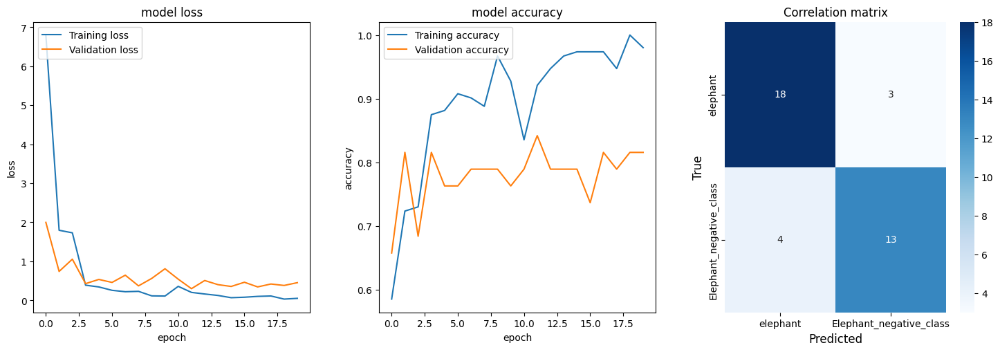

accuracy 81.579
Accuracy: mean=90.526 std=5.669, n=5
Testing: Filters=10, Kernel=(1, 1), Batch size=16
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 124, 124, 10)      40        
                                                                 
 dropout_36 (Dropout)        (None, 124, 124, 10)      0         
                                                                 
 flatten_12 (Flatten)        (None, 153760)            0         
                                                                 
 dropout_37 (Dropout)        (None, 153760)            0         
                                                                 
 dense_24 (Dense)            (None, 128)               19681408  
                                                                 
 dropout_38 (Dropout)        (None, 128)               0         
                

2023-11-24 10:35:46.628732: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_13/dropout_39/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 108ms/step - loss: 5.6249 - accuracy: 0.5855 - val_loss: 1.0632 - val_accuracy: 0.7368
Epoch 2/20
10/10 [==============================] - 0s 15ms/step - loss: 2.0678 - accuracy: 0.7303 - val_loss: 1.0533 - val_accuracy: 0.7632
Epoch 3/20
10/10 [==============================] - 0s 18ms/step - loss: 1.2861 - accuracy: 0.7632 - val_loss: 1.3834 - val_accuracy: 0.7368
Epoch 4/20
10/10 [==============================] - 0s 16ms/step - loss: 1.2854 - accuracy: 0.7763 - val_loss: 1.1257 - val_accuracy: 0.7368
Epoch 5/20
10/10 [==============================] - 0s 16ms/step - loss: 1.1609 - accuracy: 0.7434 - val_loss: 0.8928 - val_accuracy: 0.7632
Epoch 6/20
10/10 [==============================] - 0s 16ms/step - loss: 0.7404 - accuracy: 0.8224 - val_loss: 0.4712 - val_accuracy: 0.8158
Epoch 7/20
10/10 [==============================] - 0s 14ms/step - loss: 0.3196 - accuracy: 0.8947 - val_loss: 0.9055 - val_accuracy: 0.7632
Epoch 8/20
10/10 [=====

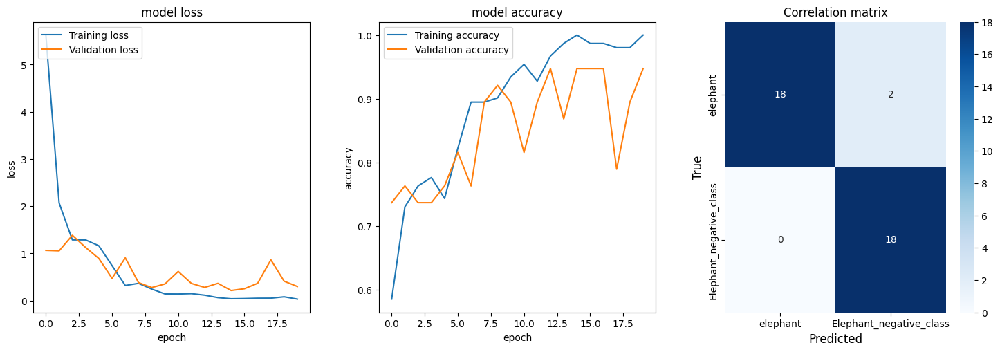

accuracy 94.737
Epoch 1/20


2023-11-24 10:35:53.225571: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_14/dropout_42/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 34ms/step - loss: 2.9721 - accuracy: 0.5789 - val_loss: 2.4923 - val_accuracy: 0.6316
Epoch 2/20
10/10 [==============================] - 0s 15ms/step - loss: 1.5519 - accuracy: 0.6447 - val_loss: 0.7724 - val_accuracy: 0.7895
Epoch 3/20
10/10 [==============================] - 0s 15ms/step - loss: 0.5931 - accuracy: 0.7829 - val_loss: 0.4840 - val_accuracy: 0.7632
Epoch 4/20
10/10 [==============================] - 0s 16ms/step - loss: 0.5309 - accuracy: 0.7895 - val_loss: 0.4621 - val_accuracy: 0.8158
Epoch 5/20
10/10 [==============================] - 0s 14ms/step - loss: 0.3263 - accuracy: 0.8618 - val_loss: 0.4029 - val_accuracy: 0.7895
Epoch 6/20
10/10 [==============================] - 0s 14ms/step - loss: 0.2540 - accuracy: 0.8882 - val_loss: 0.4851 - val_accuracy: 0.7895
Epoch 7/20
10/10 [==============================] - 0s 16ms/step - loss: 0.2615 - accuracy: 0.9013 - val_loss: 0.3633 - val_accuracy: 0.8684
Epoch 8/20
10/10 [======

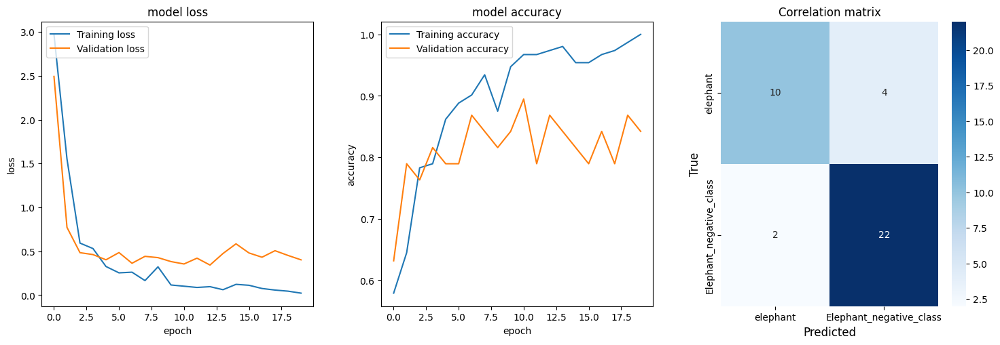

accuracy 84.211
Epoch 1/20


2023-11-24 10:35:59.546192: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_15/dropout_45/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 45ms/step - loss: 14.1263 - accuracy: 0.5132 - val_loss: 1.0580 - val_accuracy: 0.7105
Epoch 2/20
10/10 [==============================] - 0s 21ms/step - loss: 4.1919 - accuracy: 0.6447 - val_loss: 1.5695 - val_accuracy: 0.8684
Epoch 3/20
10/10 [==============================] - 0s 21ms/step - loss: 3.5714 - accuracy: 0.6842 - val_loss: 1.9371 - val_accuracy: 0.6842
Epoch 4/20
10/10 [==============================] - 0s 21ms/step - loss: 1.9258 - accuracy: 0.7171 - val_loss: 2.4038 - val_accuracy: 0.6316
Epoch 5/20
10/10 [==============================] - 0s 21ms/step - loss: 0.7826 - accuracy: 0.7697 - val_loss: 0.3673 - val_accuracy: 0.7895
Epoch 6/20
10/10 [==============================] - 0s 21ms/step - loss: 0.4179 - accuracy: 0.8487 - val_loss: 0.4437 - val_accuracy: 0.8421
Epoch 7/20
10/10 [==============================] - 0s 18ms/step - loss: 0.3373 - accuracy: 0.8289 - val_loss: 0.3265 - val_accuracy: 0.8947
Epoch 8/20
10/10 [=====

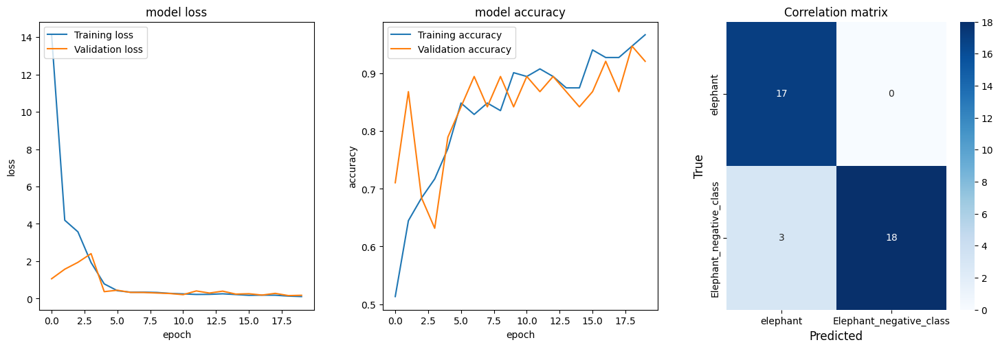

accuracy 92.105
Epoch 1/20


2023-11-24 10:36:07.459771: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_16/dropout_48/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 35ms/step - loss: 2.5363 - accuracy: 0.6250 - val_loss: 0.3724 - val_accuracy: 0.8158
Epoch 2/20
10/10 [==============================] - 0s 15ms/step - loss: 0.9621 - accuracy: 0.7566 - val_loss: 0.3478 - val_accuracy: 0.9211
Epoch 3/20
10/10 [==============================] - 0s 14ms/step - loss: 0.8438 - accuracy: 0.7632 - val_loss: 0.8010 - val_accuracy: 0.7632
Epoch 4/20
10/10 [==============================] - 0s 15ms/step - loss: 0.8416 - accuracy: 0.7566 - val_loss: 0.2441 - val_accuracy: 0.9474
Epoch 5/20
10/10 [==============================] - 0s 15ms/step - loss: 0.6697 - accuracy: 0.7697 - val_loss: 0.2342 - val_accuracy: 0.8947
Epoch 6/20
10/10 [==============================] - 0s 15ms/step - loss: 0.3129 - accuracy: 0.8487 - val_loss: 0.2392 - val_accuracy: 0.8684
Epoch 7/20
10/10 [==============================] - 0s 15ms/step - loss: 0.3039 - accuracy: 0.8882 - val_loss: 0.1583 - val_accuracy: 0.9474
Epoch 8/20
10/10 [======

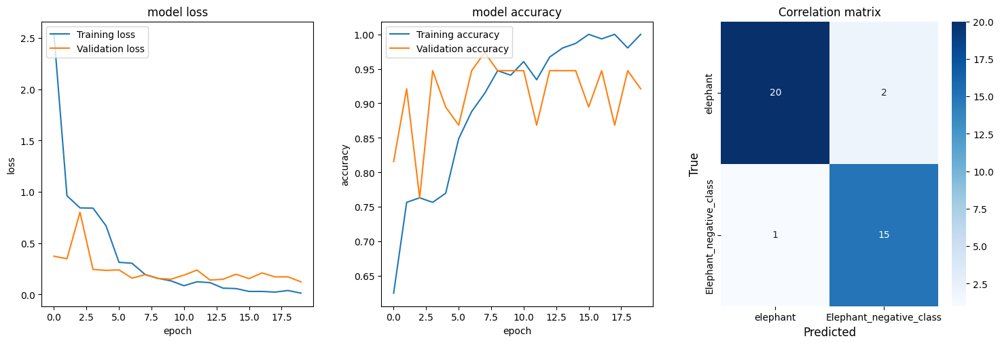

accuracy 92.105
Epoch 1/20


2023-11-24 10:36:13.212941: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_17/dropout_51/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 31ms/step - loss: 11.2999 - accuracy: 0.4671 - val_loss: 1.8957 - val_accuracy: 0.6842
Epoch 2/20
10/10 [==============================] - 0s 15ms/step - loss: 1.5952 - accuracy: 0.7434 - val_loss: 1.3337 - val_accuracy: 0.7368
Epoch 3/20
10/10 [==============================] - 0s 16ms/step - loss: 0.7448 - accuracy: 0.8158 - val_loss: 0.8137 - val_accuracy: 0.7895
Epoch 4/20
10/10 [==============================] - 0s 16ms/step - loss: 0.5342 - accuracy: 0.8618 - val_loss: 0.3797 - val_accuracy: 0.8158
Epoch 5/20
10/10 [==============================] - 0s 15ms/step - loss: 0.6064 - accuracy: 0.8158 - val_loss: 0.3178 - val_accuracy: 0.8947
Epoch 6/20
10/10 [==============================] - 0s 15ms/step - loss: 0.2202 - accuracy: 0.9211 - val_loss: 0.7146 - val_accuracy: 0.8158
Epoch 7/20
10/10 [==============================] - 0s 15ms/step - loss: 0.2704 - accuracy: 0.9276 - val_loss: 0.3428 - val_accuracy: 0.8421
Epoch 8/20
10/10 [=====

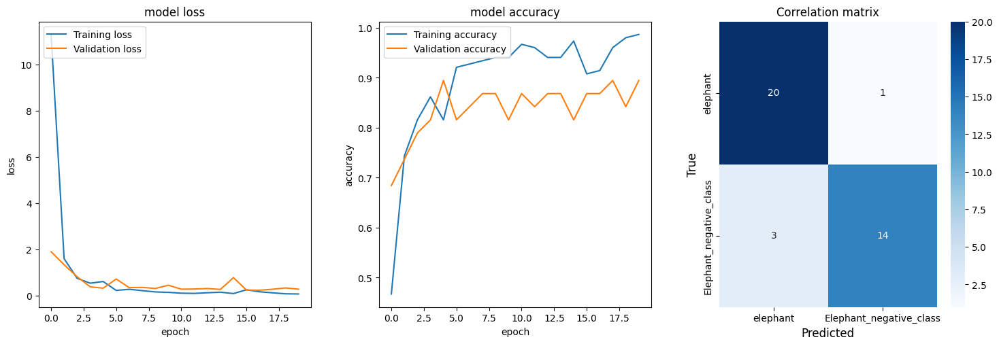

accuracy 89.474
Accuracy: mean=90.526 std=3.570, n=5
Testing: Filters=10, Kernel=(2, 2), Batch size=5
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 123, 123, 10)      130       
                                                                 
 dropout_54 (Dropout)        (None, 123, 123, 10)      0         
                                                                 
 flatten_18 (Flatten)        (None, 151290)            0         
                                                                 
 dropout_55 (Dropout)        (None, 151290)            0         
                                                                 
 dense_36 (Dense)            (None, 128)               19365248  
                                                                 
 dropout_56 (Dropout)        (None, 128)               0         
                 

2023-11-24 10:36:20.893221: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_19/dropout_57/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 22ms/step - loss: 7.8278 - accuracy: 0.6184 - val_loss: 1.1221 - val_accuracy: 0.7632
Epoch 2/20
31/31 [==============================] - 0s 13ms/step - loss: 1.7756 - accuracy: 0.7895 - val_loss: 0.7424 - val_accuracy: 0.8421
Epoch 3/20
31/31 [==============================] - 0s 12ms/step - loss: 0.5292 - accuracy: 0.8421 - val_loss: 0.7679 - val_accuracy: 0.8158
Epoch 4/20
31/31 [==============================] - 0s 14ms/step - loss: 0.3117 - accuracy: 0.9211 - val_loss: 0.6121 - val_accuracy: 0.8158
Epoch 5/20
31/31 [==============================] - 0s 11ms/step - loss: 0.2651 - accuracy: 0.8947 - val_loss: 0.4629 - val_accuracy: 0.8684
Epoch 6/20
31/31 [==============================] - 0s 13ms/step - loss: 0.1564 - accuracy: 0.9342 - val_loss: 0.5018 - val_accuracy: 0.7632
Epoch 7/20
31/31 [==============================] - 0s 14ms/step - loss: 0.1594 - accuracy: 0.9474 - val_loss: 0.3430 - val_accuracy: 0.8947
Epoch 8/20
31/31 [======

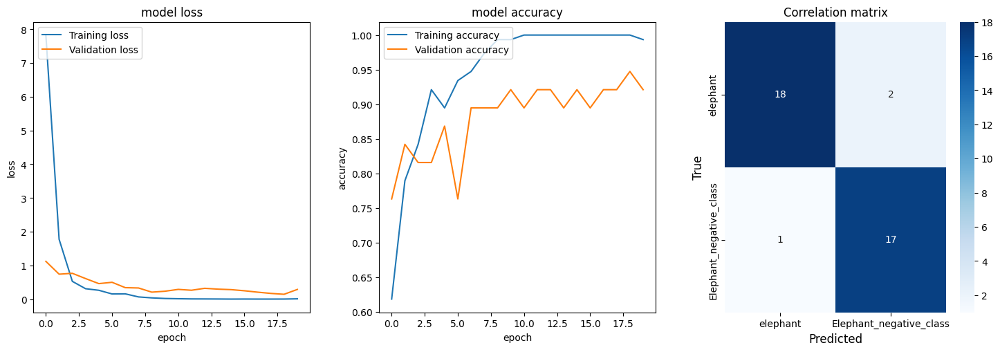

accuracy 92.105
Epoch 1/20


2023-11-24 10:36:32.968832: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_20/dropout_60/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 2s 17ms/step - loss: 4.2483 - accuracy: 0.6250 - val_loss: 1.1283 - val_accuracy: 0.7895
Epoch 2/20
31/31 [==============================] - 0s 10ms/step - loss: 1.6288 - accuracy: 0.7434 - val_loss: 2.2711 - val_accuracy: 0.6842
Epoch 3/20
31/31 [==============================] - 0s 10ms/step - loss: 0.9013 - accuracy: 0.8224 - val_loss: 0.6474 - val_accuracy: 0.8158
Epoch 4/20
31/31 [==============================] - 0s 10ms/step - loss: 0.1834 - accuracy: 0.9145 - val_loss: 0.4800 - val_accuracy: 0.8421
Epoch 5/20
31/31 [==============================] - 0s 10ms/step - loss: 0.1192 - accuracy: 0.9671 - val_loss: 0.4164 - val_accuracy: 0.8421
Epoch 6/20
31/31 [==============================] - 0s 10ms/step - loss: 0.0264 - accuracy: 0.9934 - val_loss: 0.4214 - val_accuracy: 0.8421
Epoch 7/20
31/31 [==============================] - 0s 10ms/step - loss: 0.0160 - accuracy: 0.9934 - val_loss: 0.3472 - val_accuracy: 0.8421
Epoch 8/20
31/31 [======

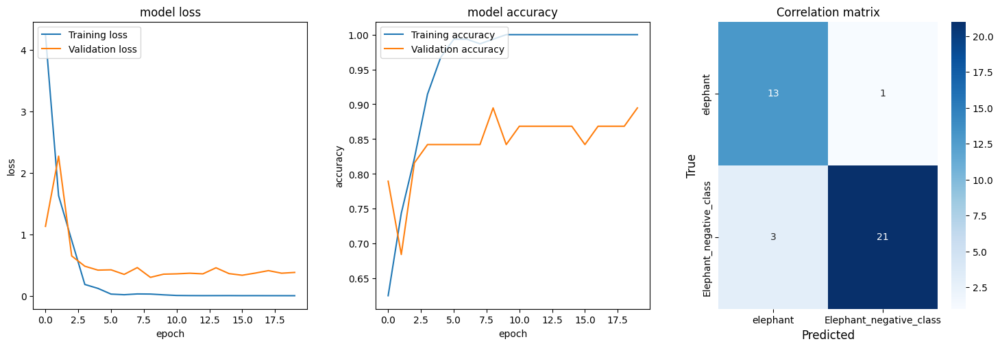

accuracy 89.474
Epoch 1/20


2023-11-24 10:36:42.971873: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_21/dropout_63/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 21ms/step - loss: 5.0438 - accuracy: 0.5526 - val_loss: 1.1242 - val_accuracy: 0.6842
Epoch 2/20
31/31 [==============================] - 0s 14ms/step - loss: 0.6063 - accuracy: 0.8026 - val_loss: 0.3174 - val_accuracy: 0.8421
Epoch 3/20
31/31 [==============================] - 0s 13ms/step - loss: 0.2736 - accuracy: 0.8882 - val_loss: 0.3100 - val_accuracy: 0.8421
Epoch 4/20
31/31 [==============================] - 0s 14ms/step - loss: 0.1320 - accuracy: 0.9474 - val_loss: 0.2402 - val_accuracy: 0.9211
Epoch 5/20
31/31 [==============================] - 0s 13ms/step - loss: 0.0680 - accuracy: 0.9868 - val_loss: 0.2634 - val_accuracy: 0.8684
Epoch 6/20
31/31 [==============================] - 0s 14ms/step - loss: 0.0506 - accuracy: 0.9803 - val_loss: 0.1642 - val_accuracy: 0.9474
Epoch 7/20
31/31 [==============================] - 0s 15ms/step - loss: 0.0321 - accuracy: 0.9934 - val_loss: 0.2049 - val_accuracy: 0.8947
Epoch 8/20
31/31 [======

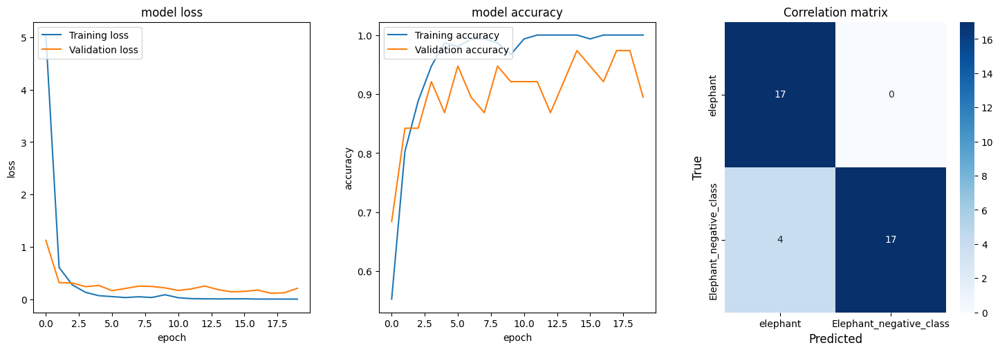

accuracy 89.474
Epoch 1/20


2023-11-24 10:36:54.060269: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_22/dropout_66/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 2s 16ms/step - loss: 3.3006 - accuracy: 0.6053 - val_loss: 0.3120 - val_accuracy: 0.8947
Epoch 2/20
31/31 [==============================] - 0s 10ms/step - loss: 1.2744 - accuracy: 0.7237 - val_loss: 0.2365 - val_accuracy: 0.9737
Epoch 3/20
31/31 [==============================] - 0s 10ms/step - loss: 0.3063 - accuracy: 0.8684 - val_loss: 0.2364 - val_accuracy: 0.8684
Epoch 4/20
31/31 [==============================] - 0s 10ms/step - loss: 0.2310 - accuracy: 0.9145 - val_loss: 0.2161 - val_accuracy: 0.9211
Epoch 5/20
31/31 [==============================] - 0s 10ms/step - loss: 0.1891 - accuracy: 0.9342 - val_loss: 0.1645 - val_accuracy: 0.9474
Epoch 6/20
31/31 [==============================] - 0s 10ms/step - loss: 0.1524 - accuracy: 0.9474 - val_loss: 0.1901 - val_accuracy: 0.9211
Epoch 7/20
31/31 [==============================] - 0s 11ms/step - loss: 0.1369 - accuracy: 0.9342 - val_loss: 0.1789 - val_accuracy: 0.9474
Epoch 8/20
31/31 [======

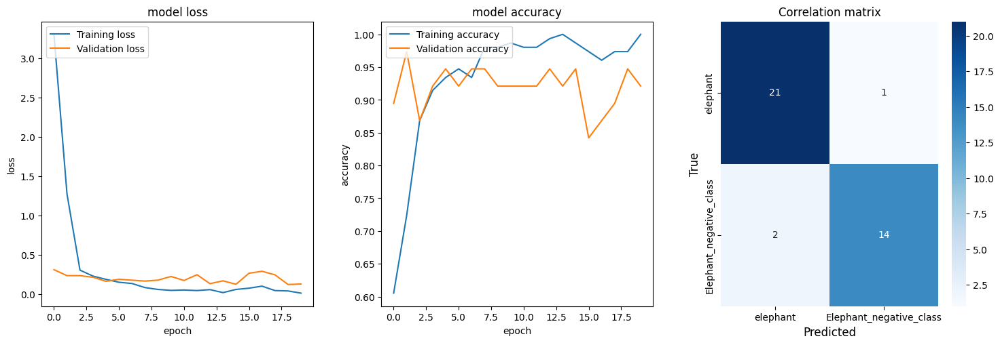

accuracy 92.105
Epoch 1/20


2023-11-24 10:37:04.725084: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_23/dropout_69/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 4s 22ms/step - loss: 6.2883 - accuracy: 0.6382 - val_loss: 2.9754 - val_accuracy: 0.6842
Epoch 2/20
31/31 [==============================] - 0s 14ms/step - loss: 1.2416 - accuracy: 0.8289 - val_loss: 0.7653 - val_accuracy: 0.7632
Epoch 3/20
31/31 [==============================] - 0s 14ms/step - loss: 1.0307 - accuracy: 0.8158 - val_loss: 1.3735 - val_accuracy: 0.7632
Epoch 4/20
31/31 [==============================] - 0s 15ms/step - loss: 0.1588 - accuracy: 0.9605 - val_loss: 0.3688 - val_accuracy: 0.8421
Epoch 5/20
31/31 [==============================] - 0s 13ms/step - loss: 0.1051 - accuracy: 0.9671 - val_loss: 0.8977 - val_accuracy: 0.7895
Epoch 6/20
31/31 [==============================] - 0s 13ms/step - loss: 0.1399 - accuracy: 0.9605 - val_loss: 0.7296 - val_accuracy: 0.8158
Epoch 7/20
31/31 [==============================] - 0s 13ms/step - loss: 0.1776 - accuracy: 0.9276 - val_loss: 0.3694 - val_accuracy: 0.8158
Epoch 8/20
31/31 [======

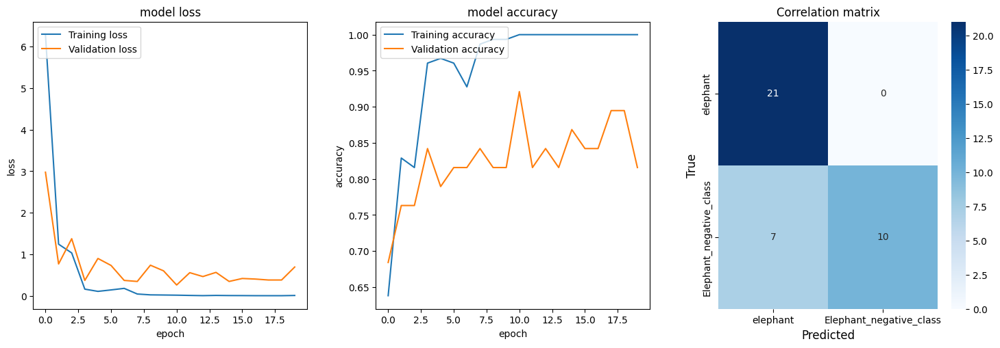

accuracy 81.579
Accuracy: mean=88.947 std=3.868, n=5
Testing: Filters=10, Kernel=(2, 2), Batch size=10
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 123, 123, 10)      130       
                                                                 
 dropout_72 (Dropout)        (None, 123, 123, 10)      0         
                                                                 
 flatten_24 (Flatten)        (None, 151290)            0         
                                                                 
 dropout_73 (Dropout)        (None, 151290)            0         
                                                                 
 dense_48 (Dense)            (None, 128)               19365248  
                                                                 
 dropout_74 (Dropout)        (None, 128)               0         
                

2023-11-24 10:37:16.194163: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_25/dropout_75/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 26ms/step - loss: 3.2651 - accuracy: 0.5921 - val_loss: 0.8549 - val_accuracy: 0.7895
Epoch 2/20
16/16 [==============================] - 0s 13ms/step - loss: 0.8465 - accuracy: 0.7961 - val_loss: 1.0810 - val_accuracy: 0.8158
Epoch 3/20
16/16 [==============================] - 0s 13ms/step - loss: 0.3715 - accuracy: 0.8882 - val_loss: 0.7765 - val_accuracy: 0.8421
Epoch 4/20
16/16 [==============================] - 0s 13ms/step - loss: 0.1886 - accuracy: 0.9408 - val_loss: 0.5780 - val_accuracy: 0.8158
Epoch 5/20
16/16 [==============================] - 0s 13ms/step - loss: 0.1317 - accuracy: 0.9539 - val_loss: 0.2068 - val_accuracy: 0.8684
Epoch 6/20
16/16 [==============================] - 0s 12ms/step - loss: 0.0604 - accuracy: 0.9737 - val_loss: 0.2862 - val_accuracy: 0.8684
Epoch 7/20
16/16 [==============================] - 0s 13ms/step - loss: 0.0830 - accuracy: 0.9671 - val_loss: 0.9819 - val_accuracy: 0.7105
Epoch 8/20
16/16 [======

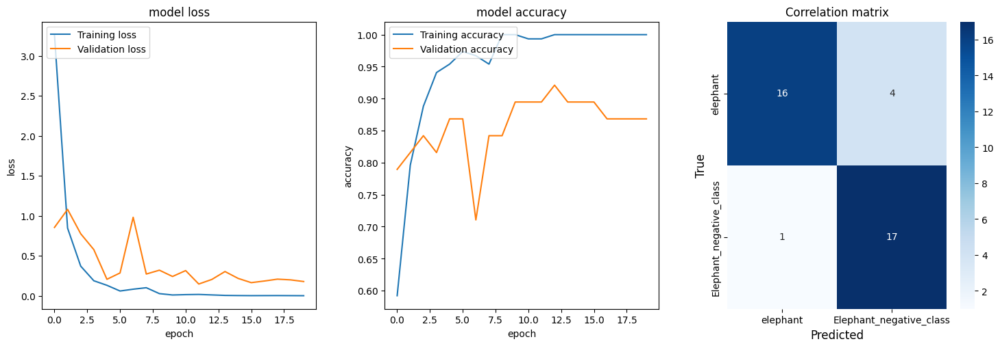

accuracy 86.842
Epoch 1/20


2023-11-24 10:37:23.239178: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_26/dropout_78/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 31ms/step - loss: 4.5544 - accuracy: 0.5855 - val_loss: 1.0486 - val_accuracy: 0.8158
Epoch 2/20
16/16 [==============================] - 0s 18ms/step - loss: 1.1963 - accuracy: 0.7961 - val_loss: 0.6610 - val_accuracy: 0.8158
Epoch 3/20
16/16 [==============================] - 0s 17ms/step - loss: 1.1794 - accuracy: 0.7961 - val_loss: 0.5468 - val_accuracy: 0.8684
Epoch 4/20
16/16 [==============================] - 0s 17ms/step - loss: 0.5804 - accuracy: 0.8092 - val_loss: 0.4968 - val_accuracy: 0.8158
Epoch 5/20
16/16 [==============================] - 0s 18ms/step - loss: 0.2632 - accuracy: 0.8947 - val_loss: 0.4019 - val_accuracy: 0.7895
Epoch 6/20
16/16 [==============================] - 0s 17ms/step - loss: 0.1921 - accuracy: 0.9211 - val_loss: 0.4009 - val_accuracy: 0.8158
Epoch 7/20
16/16 [==============================] - 0s 20ms/step - loss: 0.1554 - accuracy: 0.9276 - val_loss: 0.3636 - val_accuracy: 0.8421
Epoch 8/20
16/16 [======

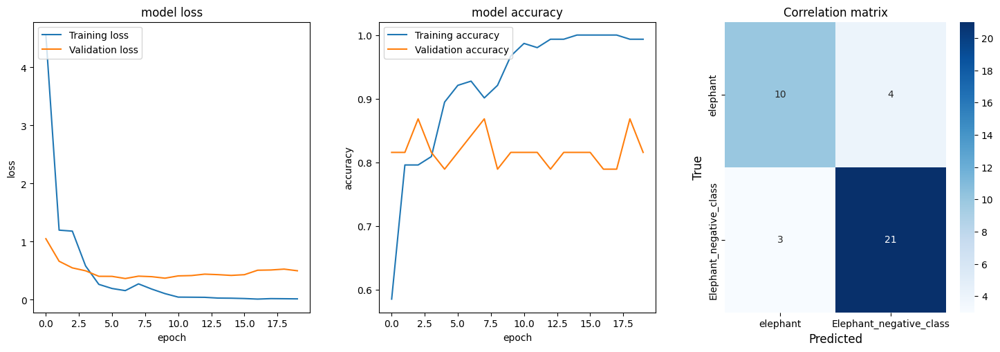

accuracy 81.579
Epoch 1/20


2023-11-24 10:37:35.287096: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_27/dropout_81/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 28ms/step - loss: 9.9010 - accuracy: 0.5461 - val_loss: 2.6412 - val_accuracy: 0.5526
Epoch 2/20
16/16 [==============================] - 0s 13ms/step - loss: 3.3442 - accuracy: 0.5724 - val_loss: 0.5393 - val_accuracy: 0.8947
Epoch 3/20
16/16 [==============================] - 0s 14ms/step - loss: 0.8435 - accuracy: 0.7632 - val_loss: 0.3452 - val_accuracy: 0.8684
Epoch 4/20
16/16 [==============================] - 0s 13ms/step - loss: 0.6775 - accuracy: 0.8026 - val_loss: 0.2735 - val_accuracy: 0.8947
Epoch 5/20
16/16 [==============================] - 0s 12ms/step - loss: 0.3386 - accuracy: 0.8618 - val_loss: 0.4430 - val_accuracy: 0.7895
Epoch 6/20
16/16 [==============================] - 0s 13ms/step - loss: 0.2993 - accuracy: 0.8553 - val_loss: 0.2637 - val_accuracy: 0.9211
Epoch 7/20
16/16 [==============================] - 0s 12ms/step - loss: 0.2229 - accuracy: 0.9013 - val_loss: 0.2124 - val_accuracy: 0.8947
Epoch 8/20
16/16 [======

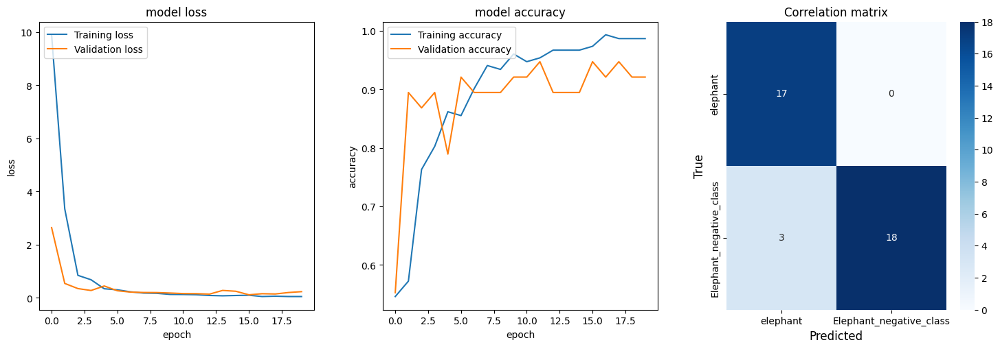

accuracy 92.105
Epoch 1/20


2023-11-24 10:37:41.885243: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_28/dropout_84/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 29ms/step - loss: 2.6005 - accuracy: 0.5987 - val_loss: 0.2413 - val_accuracy: 0.8947
Epoch 2/20
16/16 [==============================] - 0s 22ms/step - loss: 0.4610 - accuracy: 0.8224 - val_loss: 0.2097 - val_accuracy: 0.8947
Epoch 3/20
16/16 [==============================] - 0s 21ms/step - loss: 0.2901 - accuracy: 0.8684 - val_loss: 0.1755 - val_accuracy: 0.9474
Epoch 4/20
16/16 [==============================] - 0s 19ms/step - loss: 0.1719 - accuracy: 0.9211 - val_loss: 0.1514 - val_accuracy: 0.9474
Epoch 5/20
16/16 [==============================] - 0s 19ms/step - loss: 0.0909 - accuracy: 0.9605 - val_loss: 0.1707 - val_accuracy: 0.8947
Epoch 6/20
16/16 [==============================] - 0s 20ms/step - loss: 0.0557 - accuracy: 0.9868 - val_loss: 0.2145 - val_accuracy: 0.8947
Epoch 7/20
16/16 [==============================] - 0s 19ms/step - loss: 0.0540 - accuracy: 0.9803 - val_loss: 0.1596 - val_accuracy: 0.9474
Epoch 8/20
16/16 [======

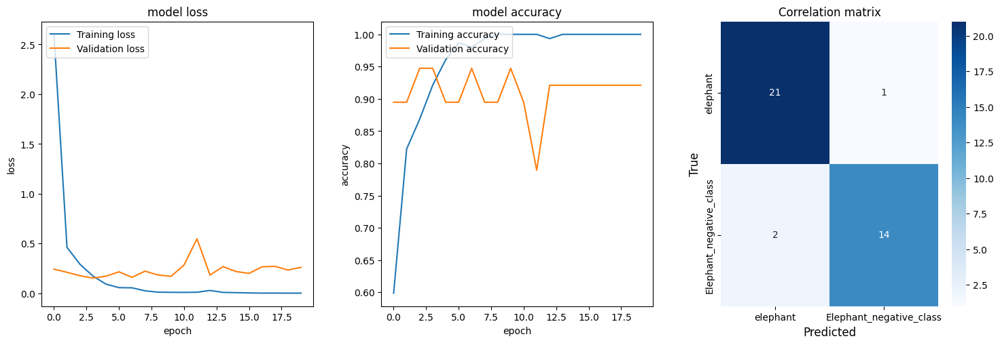

accuracy 92.105
Epoch 1/20


2023-11-24 10:37:51.114048: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_29/dropout_87/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 34ms/step - loss: 6.3214 - accuracy: 0.5987 - val_loss: 4.9854 - val_accuracy: 0.6316
Epoch 2/20
16/16 [==============================] - 0s 22ms/step - loss: 3.6967 - accuracy: 0.7039 - val_loss: 3.6660 - val_accuracy: 0.6579
Epoch 3/20
16/16 [==============================] - 0s 19ms/step - loss: 0.8796 - accuracy: 0.8224 - val_loss: 2.1303 - val_accuracy: 0.6842
Epoch 4/20
16/16 [==============================] - 0s 20ms/step - loss: 0.4479 - accuracy: 0.8816 - val_loss: 0.9787 - val_accuracy: 0.7895
Epoch 5/20
16/16 [==============================] - 0s 21ms/step - loss: 0.3382 - accuracy: 0.9013 - val_loss: 0.6328 - val_accuracy: 0.7632
Epoch 6/20
16/16 [==============================] - 0s 21ms/step - loss: 0.2094 - accuracy: 0.9276 - val_loss: 0.5097 - val_accuracy: 0.7895
Epoch 7/20
16/16 [==============================] - 0s 15ms/step - loss: 0.0758 - accuracy: 0.9605 - val_loss: 0.6476 - val_accuracy: 0.7895
Epoch 8/20
16/16 [======

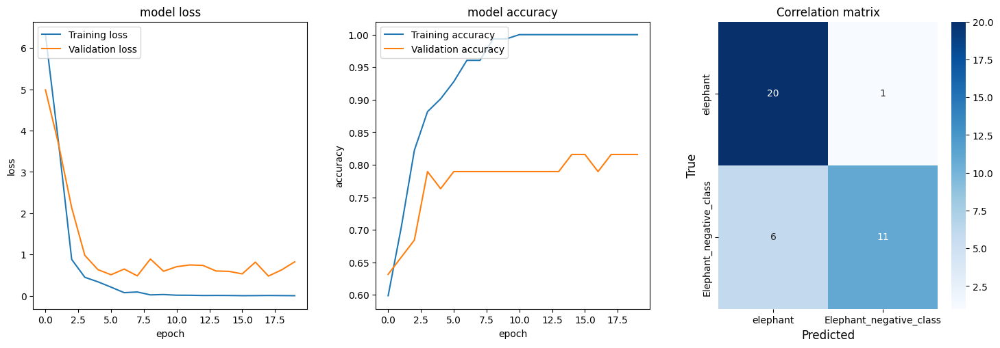

accuracy 81.579
Accuracy: mean=86.842 std=4.708, n=5
Testing: Filters=10, Kernel=(2, 2), Batch size=16
Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 123, 123, 10)      130       
                                                                 
 dropout_90 (Dropout)        (None, 123, 123, 10)      0         
                                                                 
 flatten_30 (Flatten)        (None, 151290)            0         
                                                                 
 dropout_91 (Dropout)        (None, 151290)            0         
                                                                 
 dense_60 (Dense)            (None, 128)               19365248  
                                                                 
 dropout_92 (Dropout)        (None, 128)               0         
                

2023-11-24 10:38:03.493898: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_31/dropout_93/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 44ms/step - loss: 2.2957 - accuracy: 0.5855 - val_loss: 0.5348 - val_accuracy: 0.8158
Epoch 2/20
10/10 [==============================] - 0s 23ms/step - loss: 0.4633 - accuracy: 0.7829 - val_loss: 0.8631 - val_accuracy: 0.7105
Epoch 3/20
10/10 [==============================] - 0s 30ms/step - loss: 0.3106 - accuracy: 0.8816 - val_loss: 1.0207 - val_accuracy: 0.7105
Epoch 4/20
10/10 [==============================] - 0s 25ms/step - loss: 0.2877 - accuracy: 0.8816 - val_loss: 0.9401 - val_accuracy: 0.7105
Epoch 5/20
10/10 [==============================] - 0s 22ms/step - loss: 0.1452 - accuracy: 0.9539 - val_loss: 0.6705 - val_accuracy: 0.7632
Epoch 6/20
10/10 [==============================] - 0s 24ms/step - loss: 0.1766 - accuracy: 0.9342 - val_loss: 0.5949 - val_accuracy: 0.7895
Epoch 7/20
10/10 [==============================] - 0s 19ms/step - loss: 0.0743 - accuracy: 0.9868 - val_loss: 0.9128 - val_accuracy: 0.7632
Epoch 8/20
10/10 [======

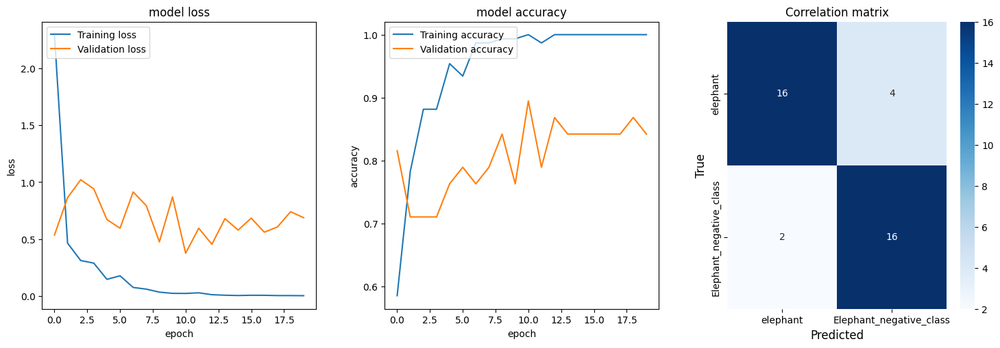

accuracy 84.211
Epoch 1/20


2023-11-24 10:38:15.459631: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_32/dropout_96/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 35ms/step - loss: 9.9610 - accuracy: 0.5197 - val_loss: 10.2873 - val_accuracy: 0.4211
Epoch 2/20
10/10 [==============================] - 0s 17ms/step - loss: 4.8768 - accuracy: 0.6711 - val_loss: 1.1747 - val_accuracy: 0.7632
Epoch 3/20
10/10 [==============================] - 0s 18ms/step - loss: 1.7709 - accuracy: 0.8092 - val_loss: 0.7287 - val_accuracy: 0.8684
Epoch 4/20
10/10 [==============================] - 0s 18ms/step - loss: 0.8042 - accuracy: 0.7961 - val_loss: 1.1422 - val_accuracy: 0.7895
Epoch 5/20
10/10 [==============================] - 0s 17ms/step - loss: 1.3619 - accuracy: 0.7763 - val_loss: 0.3151 - val_accuracy: 0.8684
Epoch 6/20
10/10 [==============================] - 0s 18ms/step - loss: 0.6820 - accuracy: 0.7632 - val_loss: 0.3574 - val_accuracy: 0.8421
Epoch 7/20
10/10 [==============================] - 0s 16ms/step - loss: 0.2861 - accuracy: 0.9276 - val_loss: 0.3917 - val_accuracy: 0.8421
Epoch 8/20
10/10 [=====

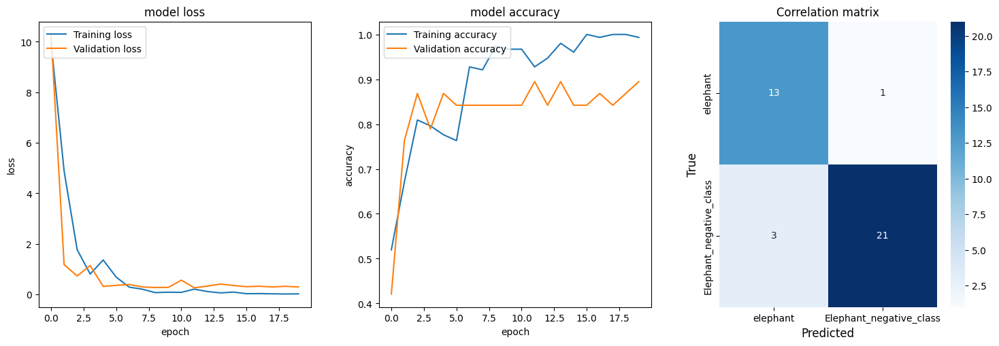

accuracy 89.474
Epoch 1/20


2023-11-24 10:38:21.372582: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_33/dropout_99/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 35ms/step - loss: 2.7247 - accuracy: 0.6184 - val_loss: 1.7332 - val_accuracy: 0.6053
Epoch 2/20
10/10 [==============================] - 0s 16ms/step - loss: 1.1150 - accuracy: 0.7303 - val_loss: 0.3060 - val_accuracy: 0.8421
Epoch 3/20
10/10 [==============================] - 0s 19ms/step - loss: 0.4760 - accuracy: 0.9013 - val_loss: 0.2410 - val_accuracy: 0.9474
Epoch 4/20
10/10 [==============================] - 0s 16ms/step - loss: 0.1293 - accuracy: 0.9474 - val_loss: 0.1739 - val_accuracy: 0.9211
Epoch 5/20
10/10 [==============================] - 0s 17ms/step - loss: 0.1276 - accuracy: 0.9539 - val_loss: 0.1651 - val_accuracy: 0.9211
Epoch 6/20
10/10 [==============================] - 0s 15ms/step - loss: 0.1418 - accuracy: 0.9737 - val_loss: 0.1495 - val_accuracy: 0.9211
Epoch 7/20
10/10 [==============================] - 0s 22ms/step - loss: 0.0647 - accuracy: 0.9803 - val_loss: 0.1956 - val_accuracy: 0.8947
Epoch 8/20
10/10 [======

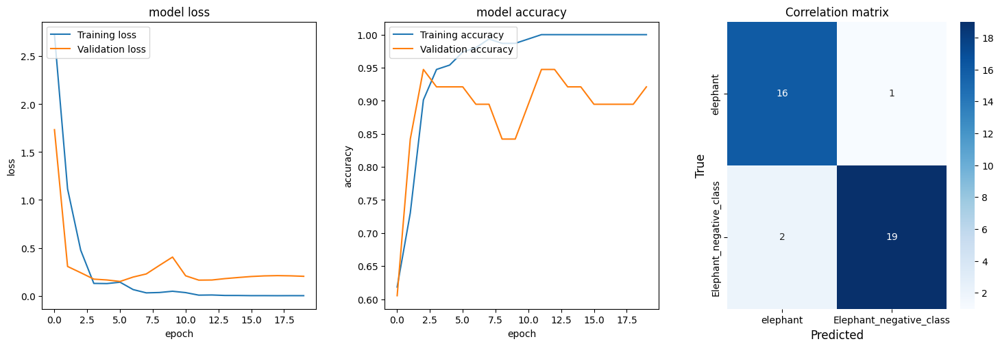

accuracy 92.105
Epoch 1/20


2023-11-24 10:38:29.062016: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_34/dropout_102/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 49ms/step - loss: 7.6091 - accuracy: 0.5263 - val_loss: 0.4150 - val_accuracy: 0.8158
Epoch 2/20
10/10 [==============================] - 0s 22ms/step - loss: 1.7729 - accuracy: 0.6711 - val_loss: 0.5914 - val_accuracy: 0.7895
Epoch 3/20
10/10 [==============================] - 0s 23ms/step - loss: 1.0621 - accuracy: 0.7368 - val_loss: 0.2487 - val_accuracy: 0.8421
Epoch 4/20
10/10 [==============================] - 0s 25ms/step - loss: 0.9233 - accuracy: 0.7434 - val_loss: 0.2444 - val_accuracy: 0.8947
Epoch 5/20
10/10 [==============================] - 0s 26ms/step - loss: 0.5434 - accuracy: 0.8487 - val_loss: 0.2072 - val_accuracy: 0.8421
Epoch 6/20
10/10 [==============================] - 0s 26ms/step - loss: 0.2739 - accuracy: 0.8882 - val_loss: 0.2265 - val_accuracy: 0.8947
Epoch 7/20
10/10 [==============================] - 0s 25ms/step - loss: 0.2194 - accuracy: 0.9145 - val_loss: 0.2784 - val_accuracy: 0.8421
Epoch 8/20
10/10 [======

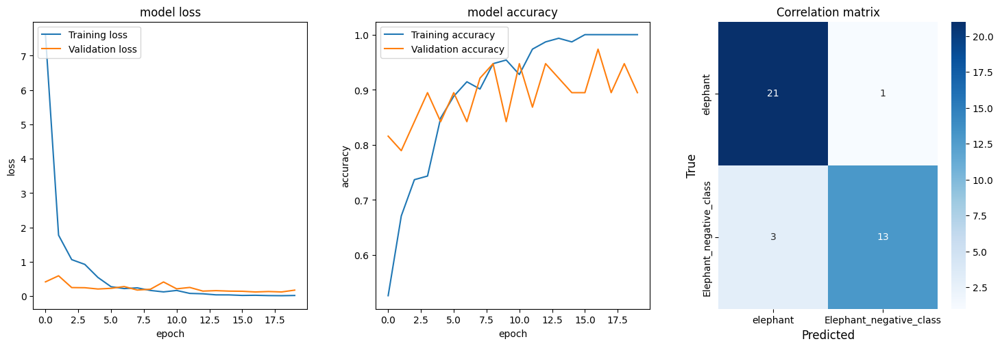

accuracy 89.474
Epoch 1/20


2023-11-24 10:38:38.279132: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_35/dropout_105/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 38ms/step - loss: 16.7137 - accuracy: 0.4803 - val_loss: 1.5808 - val_accuracy: 0.7105
Epoch 2/20
10/10 [==============================] - 0s 18ms/step - loss: 6.7793 - accuracy: 0.6382 - val_loss: 12.2069 - val_accuracy: 0.6053
Epoch 3/20
10/10 [==============================] - 0s 20ms/step - loss: 2.9951 - accuracy: 0.7434 - val_loss: 1.6391 - val_accuracy: 0.7632
Epoch 4/20
10/10 [==============================] - 0s 20ms/step - loss: 1.8869 - accuracy: 0.8026 - val_loss: 1.3668 - val_accuracy: 0.7632
Epoch 5/20
10/10 [==============================] - 0s 19ms/step - loss: 1.4240 - accuracy: 0.8026 - val_loss: 2.1672 - val_accuracy: 0.7105
Epoch 6/20
10/10 [==============================] - 0s 19ms/step - loss: 0.8947 - accuracy: 0.8289 - val_loss: 0.6125 - val_accuracy: 0.8158
Epoch 7/20
10/10 [==============================] - 0s 18ms/step - loss: 0.3372 - accuracy: 0.8947 - val_loss: 0.7143 - val_accuracy: 0.8158
Epoch 8/20
10/10 [====

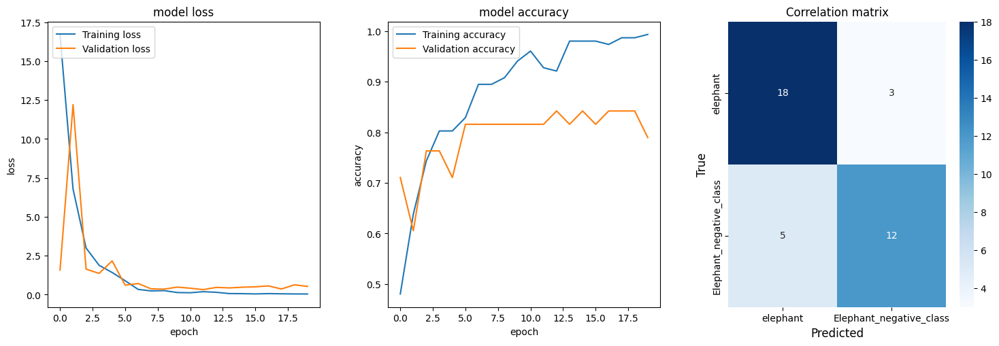

accuracy 78.947
Accuracy: mean=86.842 std=4.708, n=5
Testing: Filters=10, Kernel=(5, 5), Batch size=5
Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 120, 120, 10)      760       
                                                                 
 dropout_108 (Dropout)       (None, 120, 120, 10)      0         
                                                                 
 flatten_36 (Flatten)        (None, 144000)            0         
                                                                 
 dropout_109 (Dropout)       (None, 144000)            0         
                                                                 
 dense_72 (Dense)            (None, 128)               18432128  
                                                                 
 dropout_110 (Dropout)       (None, 128)               0         
                 

2023-11-24 10:38:45.575092: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_37/dropout_111/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 28ms/step - loss: 2.7296 - accuracy: 0.5461 - val_loss: 0.6739 - val_accuracy: 0.5263
Epoch 2/20
31/31 [==============================] - 0s 15ms/step - loss: 0.6366 - accuracy: 0.6184 - val_loss: 0.5775 - val_accuracy: 0.6842
Epoch 3/20
31/31 [==============================] - 0s 13ms/step - loss: 0.4575 - accuracy: 0.8224 - val_loss: 0.4477 - val_accuracy: 0.8158
Epoch 4/20
31/31 [==============================] - 0s 14ms/step - loss: 0.2152 - accuracy: 0.9342 - val_loss: 0.6999 - val_accuracy: 0.7105
Epoch 5/20
31/31 [==============================] - 0s 14ms/step - loss: 0.2310 - accuracy: 0.9211 - val_loss: 0.3731 - val_accuracy: 0.7895
Epoch 6/20
31/31 [==============================] - 0s 13ms/step - loss: 0.2042 - accuracy: 0.9408 - val_loss: 1.0765 - val_accuracy: 0.5000
Epoch 7/20
31/31 [==============================] - 0s 15ms/step - loss: 0.1473 - accuracy: 0.9474 - val_loss: 0.4557 - val_accuracy: 0.7895
Epoch 8/20
31/31 [======

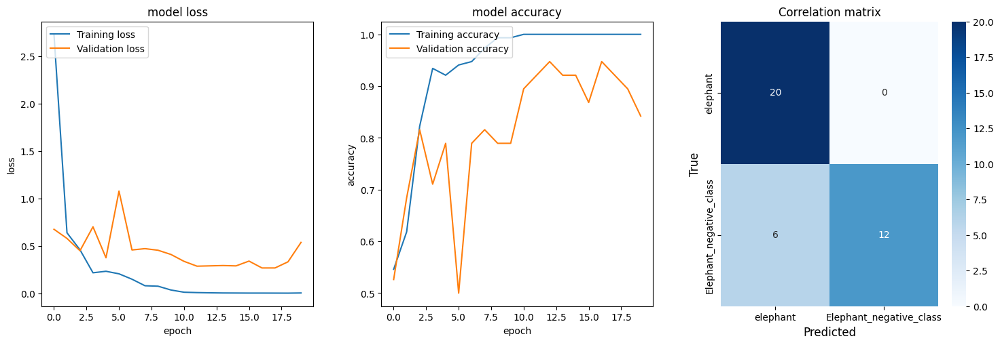

accuracy 84.211
Epoch 1/20


2023-11-24 10:38:59.195435: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_38/dropout_114/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 18ms/step - loss: 4.9968 - accuracy: 0.4671 - val_loss: 0.6745 - val_accuracy: 0.6579
Epoch 2/20
31/31 [==============================] - 0s 12ms/step - loss: 0.6175 - accuracy: 0.7237 - val_loss: 0.5670 - val_accuracy: 0.6579
Epoch 3/20
31/31 [==============================] - 0s 11ms/step - loss: 0.4373 - accuracy: 0.8289 - val_loss: 0.6473 - val_accuracy: 0.5789
Epoch 4/20
31/31 [==============================] - 0s 11ms/step - loss: 0.3640 - accuracy: 0.9276 - val_loss: 0.7932 - val_accuracy: 0.6316
Epoch 5/20
31/31 [==============================] - 0s 10ms/step - loss: 0.1255 - accuracy: 0.9539 - val_loss: 0.5208 - val_accuracy: 0.7368
Epoch 6/20
31/31 [==============================] - 0s 15ms/step - loss: 0.0410 - accuracy: 0.9934 - val_loss: 0.5817 - val_accuracy: 0.7632
Epoch 7/20
31/31 [==============================] - 0s 11ms/step - loss: 0.0196 - accuracy: 1.0000 - val_loss: 0.5276 - val_accuracy: 0.7105
Epoch 8/20
31/31 [======

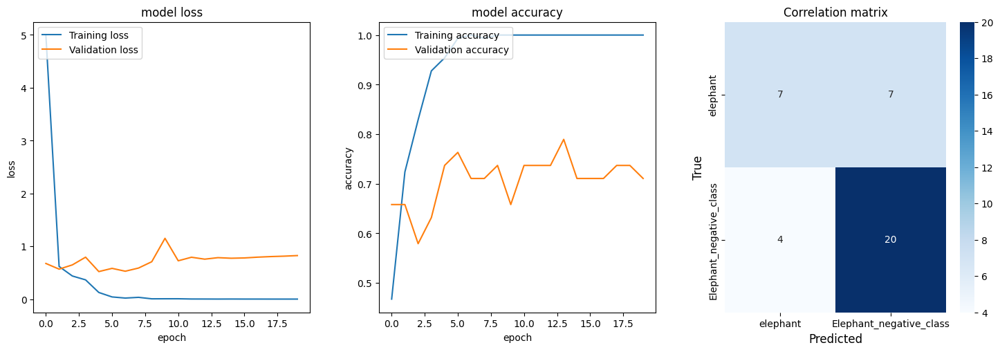

accuracy 71.053
Epoch 1/20


2023-11-24 10:39:08.903029: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_39/dropout_117/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 2s 20ms/step - loss: 6.1400 - accuracy: 0.5789 - val_loss: 0.7150 - val_accuracy: 0.7105
Epoch 2/20
31/31 [==============================] - 0s 16ms/step - loss: 0.5676 - accuracy: 0.7697 - val_loss: 0.6947 - val_accuracy: 0.7368
Epoch 3/20
31/31 [==============================] - 0s 14ms/step - loss: 0.3226 - accuracy: 0.8816 - val_loss: 0.6094 - val_accuracy: 0.7632
Epoch 4/20
31/31 [==============================] - 0s 12ms/step - loss: 0.1732 - accuracy: 0.9342 - val_loss: 0.5596 - val_accuracy: 0.7632
Epoch 5/20
31/31 [==============================] - 0s 14ms/step - loss: 0.1608 - accuracy: 0.9342 - val_loss: 0.6173 - val_accuracy: 0.7632
Epoch 6/20
31/31 [==============================] - 0s 13ms/step - loss: 0.1081 - accuracy: 0.9737 - val_loss: 0.5857 - val_accuracy: 0.7895
Epoch 7/20
31/31 [==============================] - 0s 15ms/step - loss: 0.1144 - accuracy: 0.9539 - val_loss: 0.7272 - val_accuracy: 0.7632
Epoch 8/20
31/31 [======

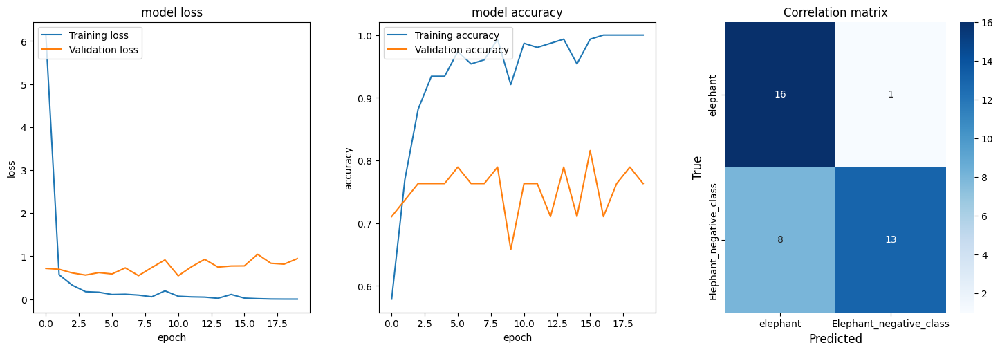

accuracy 76.316
Epoch 1/20


2023-11-24 10:39:22.479527: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_40/dropout_120/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 17ms/step - loss: 1.8741 - accuracy: 0.6447 - val_loss: 0.5649 - val_accuracy: 0.7895
Epoch 2/20
31/31 [==============================] - 0s 11ms/step - loss: 0.4436 - accuracy: 0.8289 - val_loss: 0.3503 - val_accuracy: 0.8158
Epoch 3/20
31/31 [==============================] - 0s 12ms/step - loss: 0.2511 - accuracy: 0.9013 - val_loss: 0.2226 - val_accuracy: 0.8947
Epoch 4/20
31/31 [==============================] - 0s 11ms/step - loss: 0.1757 - accuracy: 0.9539 - val_loss: 0.2235 - val_accuracy: 0.8947
Epoch 5/20
31/31 [==============================] - 0s 10ms/step - loss: 0.0503 - accuracy: 0.9868 - val_loss: 0.2269 - val_accuracy: 0.8947
Epoch 6/20
31/31 [==============================] - 0s 11ms/step - loss: 0.0378 - accuracy: 1.0000 - val_loss: 0.2222 - val_accuracy: 0.9211
Epoch 7/20
31/31 [==============================] - 0s 10ms/step - loss: 0.0197 - accuracy: 0.9934 - val_loss: 0.2353 - val_accuracy: 0.9211
Epoch 8/20
31/31 [======

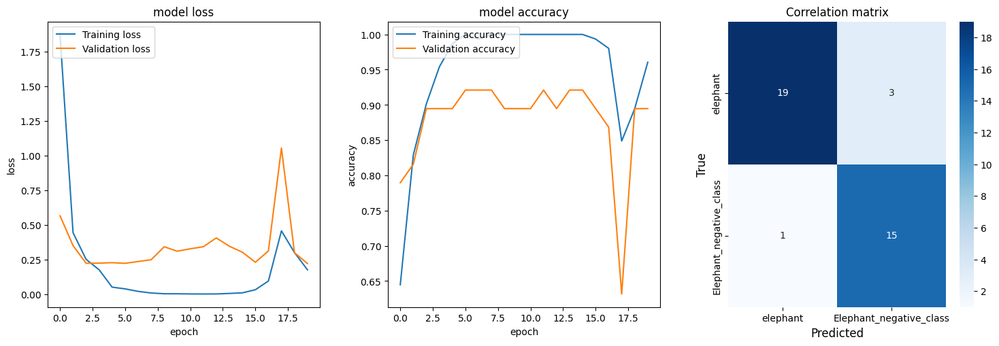

accuracy 89.474
Epoch 1/20


2023-11-24 10:39:35.332892: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_41/dropout_123/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 23ms/step - loss: 2.4689 - accuracy: 0.5658 - val_loss: 0.6645 - val_accuracy: 0.5263
Epoch 2/20
31/31 [==============================] - 0s 16ms/step - loss: 0.5100 - accuracy: 0.8289 - val_loss: 0.5512 - val_accuracy: 0.7368
Epoch 3/20
31/31 [==============================] - 0s 14ms/step - loss: 0.3160 - accuracy: 0.8816 - val_loss: 0.5025 - val_accuracy: 0.6842
Epoch 4/20
31/31 [==============================] - 0s 15ms/step - loss: 0.1870 - accuracy: 0.9408 - val_loss: 0.7387 - val_accuracy: 0.6053
Epoch 5/20
31/31 [==============================] - 0s 15ms/step - loss: 0.2037 - accuracy: 0.9276 - val_loss: 0.5389 - val_accuracy: 0.7632
Epoch 6/20
31/31 [==============================] - 0s 14ms/step - loss: 0.0487 - accuracy: 0.9868 - val_loss: 0.5120 - val_accuracy: 0.7632
Epoch 7/20
31/31 [==============================] - 0s 16ms/step - loss: 0.0066 - accuracy: 1.0000 - val_loss: 0.9572 - val_accuracy: 0.7105
Epoch 8/20
31/31 [======

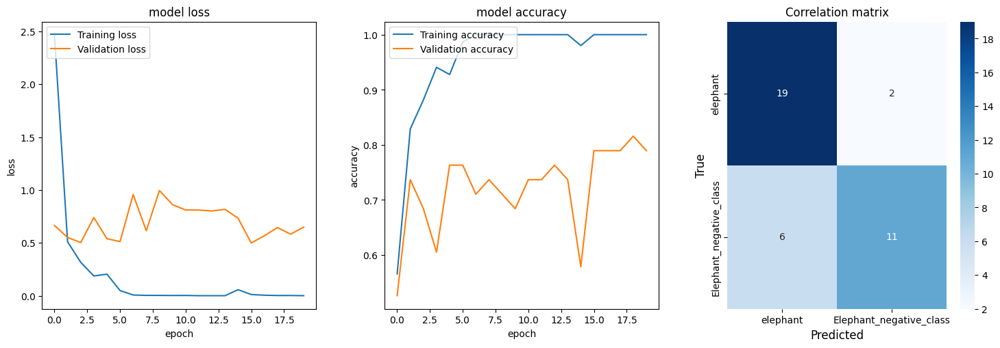

accuracy 78.947
Accuracy: mean=80.000 std=6.359, n=5
Testing: Filters=10, Kernel=(5, 5), Batch size=10
Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_42 (Conv2D)          (None, 120, 120, 10)      760       
                                                                 
 dropout_126 (Dropout)       (None, 120, 120, 10)      0         
                                                                 
 flatten_42 (Flatten)        (None, 144000)            0         
                                                                 
 dropout_127 (Dropout)       (None, 144000)            0         
                                                                 
 dense_84 (Dense)            (None, 128)               18432128  
                                                                 
 dropout_128 (Dropout)       (None, 128)               0         
                

2023-11-24 10:39:47.694364: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_43/dropout_129/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 32ms/step - loss: 13.7277 - accuracy: 0.5395 - val_loss: 2.3507 - val_accuracy: 0.5526
Epoch 2/20
16/16 [==============================] - 0s 15ms/step - loss: 1.4213 - accuracy: 0.5921 - val_loss: 0.6092 - val_accuracy: 0.6579
Epoch 3/20
16/16 [==============================] - 0s 14ms/step - loss: 0.5088 - accuracy: 0.8289 - val_loss: 0.5614 - val_accuracy: 0.7895
Epoch 4/20
16/16 [==============================] - 0s 14ms/step - loss: 0.3040 - accuracy: 0.9079 - val_loss: 0.3658 - val_accuracy: 0.8684
Epoch 5/20
16/16 [==============================] - 0s 15ms/step - loss: 0.1686 - accuracy: 0.9211 - val_loss: 0.5043 - val_accuracy: 0.8158
Epoch 6/20
16/16 [==============================] - 0s 14ms/step - loss: 0.0618 - accuracy: 0.9868 - val_loss: 0.3958 - val_accuracy: 0.8947
Epoch 7/20
16/16 [==============================] - 0s 13ms/step - loss: 0.0192 - accuracy: 1.0000 - val_loss: 0.2843 - val_accuracy: 0.8947
Epoch 8/20
16/16 [=====

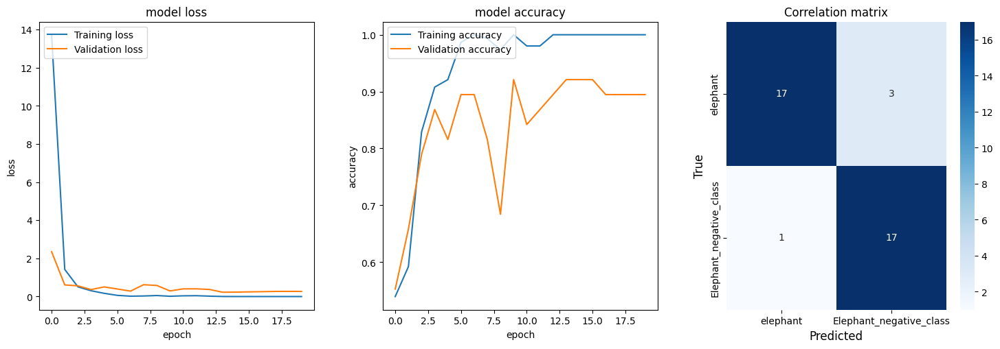

accuracy 89.474
Epoch 1/20


2023-11-24 10:40:00.799462: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_44/dropout_132/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 25ms/step - loss: 1.1534 - accuracy: 0.5987 - val_loss: 0.6364 - val_accuracy: 0.6316
Epoch 2/20
16/16 [==============================] - 0s 14ms/step - loss: 0.5242 - accuracy: 0.7961 - val_loss: 0.7982 - val_accuracy: 0.5000
Epoch 3/20
16/16 [==============================] - 0s 15ms/step - loss: 0.3611 - accuracy: 0.8553 - val_loss: 0.6583 - val_accuracy: 0.6842
Epoch 4/20
16/16 [==============================] - 0s 13ms/step - loss: 0.2008 - accuracy: 0.9211 - val_loss: 0.9607 - val_accuracy: 0.5526
Epoch 5/20
16/16 [==============================] - 0s 16ms/step - loss: 0.1172 - accuracy: 0.9737 - val_loss: 0.6832 - val_accuracy: 0.6316
Epoch 6/20
16/16 [==============================] - 0s 13ms/step - loss: 0.0397 - accuracy: 0.9934 - val_loss: 1.1768 - val_accuracy: 0.5789
Epoch 7/20
16/16 [==============================] - 0s 13ms/step - loss: 0.0635 - accuracy: 0.9803 - val_loss: 0.5402 - val_accuracy: 0.7895
Epoch 8/20
16/16 [======

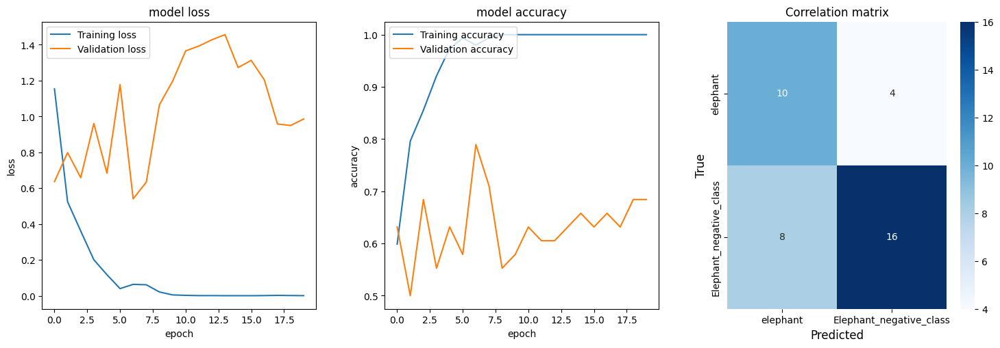

accuracy 68.421
Epoch 1/20


2023-11-24 10:40:08.112807: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_45/dropout_135/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 26ms/step - loss: 2.5556 - accuracy: 0.6645 - val_loss: 0.3693 - val_accuracy: 0.8684
Epoch 2/20
16/16 [==============================] - 0s 15ms/step - loss: 0.4340 - accuracy: 0.8158 - val_loss: 0.3315 - val_accuracy: 0.8947
Epoch 3/20
16/16 [==============================] - 0s 14ms/step - loss: 0.2013 - accuracy: 0.9539 - val_loss: 0.2888 - val_accuracy: 0.8947
Epoch 4/20
16/16 [==============================] - 0s 13ms/step - loss: 0.1100 - accuracy: 0.9671 - val_loss: 0.3183 - val_accuracy: 0.8684
Epoch 5/20
16/16 [==============================] - 0s 16ms/step - loss: 0.0685 - accuracy: 0.9737 - val_loss: 0.4106 - val_accuracy: 0.8158
Epoch 6/20
16/16 [==============================] - 0s 13ms/step - loss: 0.0283 - accuracy: 0.9934 - val_loss: 0.2420 - val_accuracy: 0.8947
Epoch 7/20
16/16 [==============================] - 0s 13ms/step - loss: 0.0134 - accuracy: 1.0000 - val_loss: 0.1620 - val_accuracy: 0.9211
Epoch 8/20
16/16 [======

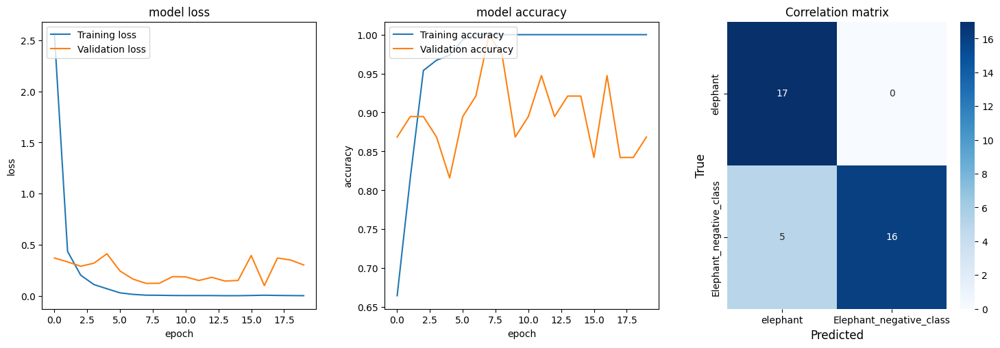

accuracy 86.842
Epoch 1/20


2023-11-24 10:40:17.668747: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_46/dropout_138/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 4s 42ms/step - loss: 2.7959 - accuracy: 0.5855 - val_loss: 0.4200 - val_accuracy: 0.8947
Epoch 2/20
16/16 [==============================] - 0s 20ms/step - loss: 0.4999 - accuracy: 0.8158 - val_loss: 0.5894 - val_accuracy: 0.7632
Epoch 3/20
16/16 [==============================] - 0s 18ms/step - loss: 0.3868 - accuracy: 0.8421 - val_loss: 0.5036 - val_accuracy: 0.7895
Epoch 4/20
16/16 [==============================] - 0s 19ms/step - loss: 0.2249 - accuracy: 0.9145 - val_loss: 0.4624 - val_accuracy: 0.8158
Epoch 5/20
16/16 [==============================] - 0s 19ms/step - loss: 0.0964 - accuracy: 0.9934 - val_loss: 0.3472 - val_accuracy: 0.7895
Epoch 6/20
16/16 [==============================] - 0s 19ms/step - loss: 0.0281 - accuracy: 0.9934 - val_loss: 0.3890 - val_accuracy: 0.8158
Epoch 7/20
16/16 [==============================] - 0s 20ms/step - loss: 0.0258 - accuracy: 0.9934 - val_loss: 0.3766 - val_accuracy: 0.8158
Epoch 8/20
16/16 [======

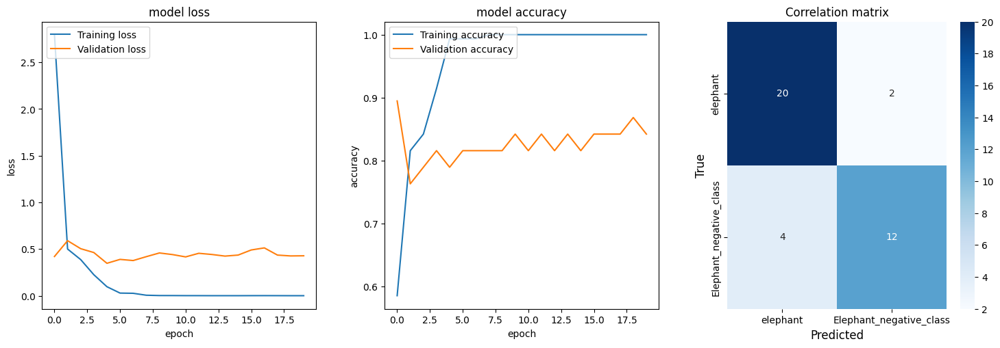

accuracy 84.211
Epoch 1/20


2023-11-24 10:40:29.738693: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_47/dropout_141/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 26ms/step - loss: 4.7415 - accuracy: 0.5461 - val_loss: 0.5811 - val_accuracy: 0.7895
Epoch 2/20
16/16 [==============================] - 0s 15ms/step - loss: 0.6784 - accuracy: 0.6382 - val_loss: 0.7628 - val_accuracy: 0.3158
Epoch 3/20
16/16 [==============================] - 0s 14ms/step - loss: 0.5538 - accuracy: 0.6908 - val_loss: 0.5729 - val_accuracy: 0.6842
Epoch 4/20
16/16 [==============================] - 0s 14ms/step - loss: 0.4445 - accuracy: 0.8224 - val_loss: 0.5570 - val_accuracy: 0.7368
Epoch 5/20
16/16 [==============================] - 0s 14ms/step - loss: 0.3114 - accuracy: 0.8816 - val_loss: 0.5058 - val_accuracy: 0.7368
Epoch 6/20
16/16 [==============================] - 0s 14ms/step - loss: 0.2173 - accuracy: 0.9342 - val_loss: 0.3996 - val_accuracy: 0.8947
Epoch 7/20
16/16 [==============================] - 0s 14ms/step - loss: 0.1094 - accuracy: 0.9934 - val_loss: 0.3992 - val_accuracy: 0.7895
Epoch 8/20
16/16 [======

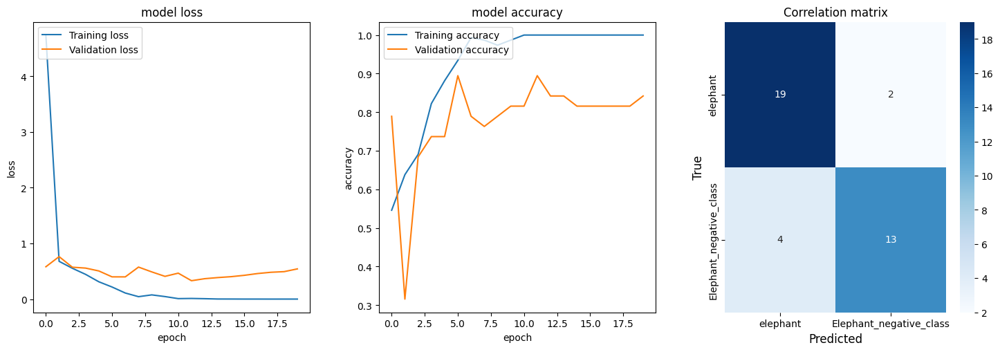

accuracy 84.211
Accuracy: mean=82.632 std=7.368, n=5
Testing: Filters=10, Kernel=(5, 5), Batch size=16
Model: "sequential_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 120, 120, 10)      760       
                                                                 
 dropout_144 (Dropout)       (None, 120, 120, 10)      0         
                                                                 
 flatten_48 (Flatten)        (None, 144000)            0         
                                                                 
 dropout_145 (Dropout)       (None, 144000)            0         
                                                                 
 dense_96 (Dense)            (None, 128)               18432128  
                                                                 
 dropout_146 (Dropout)       (None, 128)               0         
                

2023-11-24 10:40:42.809248: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_49/dropout_147/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 42ms/step - loss: 11.2881 - accuracy: 0.4605 - val_loss: 1.4605 - val_accuracy: 0.5526
Epoch 2/20
10/10 [==============================] - 0s 18ms/step - loss: 1.3266 - accuracy: 0.6118 - val_loss: 0.6206 - val_accuracy: 0.6579
Epoch 3/20
10/10 [==============================] - 0s 18ms/step - loss: 0.7043 - accuracy: 0.6711 - val_loss: 0.5951 - val_accuracy: 0.7105
Epoch 4/20
10/10 [==============================] - 0s 19ms/step - loss: 0.5024 - accuracy: 0.7895 - val_loss: 0.5553 - val_accuracy: 0.7368
Epoch 5/20
10/10 [==============================] - 0s 17ms/step - loss: 0.4274 - accuracy: 0.8224 - val_loss: 0.4362 - val_accuracy: 0.8158
Epoch 6/20
10/10 [==============================] - 0s 18ms/step - loss: 0.3869 - accuracy: 0.8289 - val_loss: 0.3842 - val_accuracy: 0.8684
Epoch 7/20
10/10 [==============================] - 0s 17ms/step - loss: 0.2724 - accuracy: 0.8882 - val_loss: 0.2617 - val_accuracy: 0.8684
Epoch 8/20
10/10 [=====

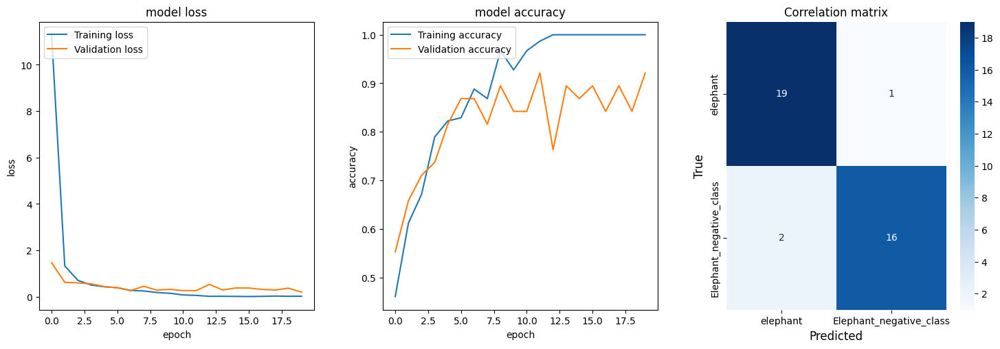

accuracy 92.105
Epoch 1/20


2023-11-24 10:40:49.413473: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_50/dropout_150/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 35ms/step - loss: 2.8313 - accuracy: 0.5132 - val_loss: 0.6343 - val_accuracy: 0.6316
Epoch 2/20
10/10 [==============================] - 0s 18ms/step - loss: 0.6192 - accuracy: 0.6842 - val_loss: 0.5682 - val_accuracy: 0.6579
Epoch 3/20
10/10 [==============================] - 0s 20ms/step - loss: 0.4130 - accuracy: 0.8158 - val_loss: 0.4930 - val_accuracy: 0.7105
Epoch 4/20
10/10 [==============================] - 0s 18ms/step - loss: 0.1848 - accuracy: 0.9605 - val_loss: 0.9392 - val_accuracy: 0.7632
Epoch 5/20
10/10 [==============================] - 0s 18ms/step - loss: 0.1205 - accuracy: 0.9671 - val_loss: 0.7526 - val_accuracy: 0.6842
Epoch 6/20
10/10 [==============================] - 0s 23ms/step - loss: 0.0681 - accuracy: 0.9803 - val_loss: 0.9226 - val_accuracy: 0.6579
Epoch 7/20
10/10 [==============================] - 0s 17ms/step - loss: 0.0274 - accuracy: 0.9934 - val_loss: 0.7306 - val_accuracy: 0.6579
Epoch 8/20
10/10 [======

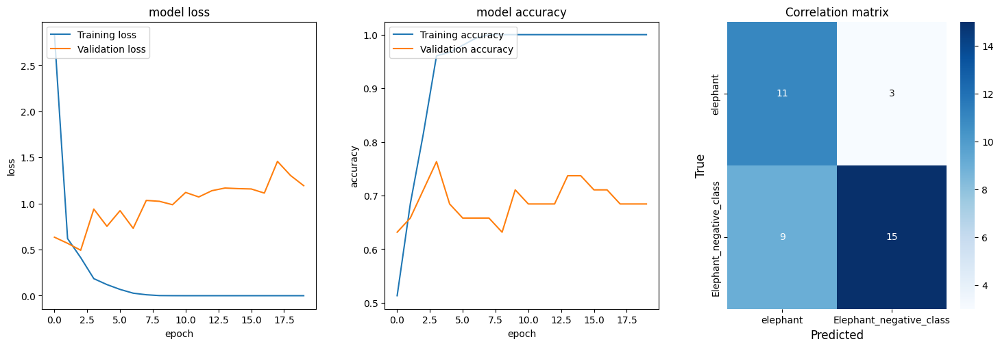

accuracy 68.421
Epoch 1/20


2023-11-24 10:40:57.375442: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_51/dropout_153/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 54ms/step - loss: 12.3727 - accuracy: 0.4868 - val_loss: 3.4965 - val_accuracy: 0.5526
Epoch 2/20
10/10 [==============================] - 0s 25ms/step - loss: 2.1533 - accuracy: 0.6645 - val_loss: 1.1442 - val_accuracy: 0.7368
Epoch 3/20
10/10 [==============================] - 0s 20ms/step - loss: 0.6468 - accuracy: 0.7763 - val_loss: 0.6207 - val_accuracy: 0.7368
Epoch 4/20
10/10 [==============================] - 0s 22ms/step - loss: 0.3633 - accuracy: 0.8355 - val_loss: 0.6282 - val_accuracy: 0.7368
Epoch 5/20
10/10 [==============================] - 0s 29ms/step - loss: 0.3629 - accuracy: 0.8553 - val_loss: 0.6947 - val_accuracy: 0.7632
Epoch 6/20
10/10 [==============================] - 0s 24ms/step - loss: 0.2797 - accuracy: 0.9079 - val_loss: 0.5434 - val_accuracy: 0.7632
Epoch 7/20
10/10 [==============================] - 0s 27ms/step - loss: 0.2095 - accuracy: 0.9605 - val_loss: 0.5349 - val_accuracy: 0.7895
Epoch 8/20
10/10 [=====

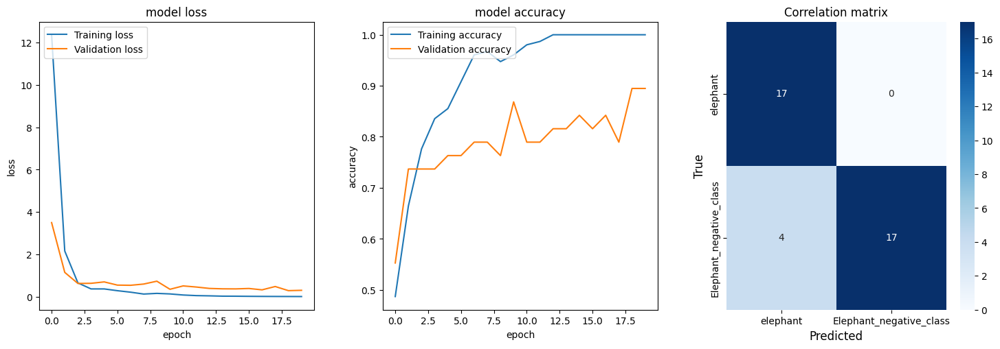

accuracy 89.474
Epoch 1/20


2023-11-24 10:41:09.463906: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_52/dropout_156/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 37ms/step - loss: 3.4593 - accuracy: 0.6250 - val_loss: 0.3382 - val_accuracy: 0.8158
Epoch 2/20
10/10 [==============================] - 0s 21ms/step - loss: 0.5079 - accuracy: 0.7434 - val_loss: 0.3136 - val_accuracy: 0.8684
Epoch 3/20
10/10 [==============================] - 0s 20ms/step - loss: 0.4075 - accuracy: 0.7961 - val_loss: 0.3462 - val_accuracy: 0.8421
Epoch 4/20
10/10 [==============================] - 0s 18ms/step - loss: 0.3271 - accuracy: 0.8816 - val_loss: 0.2665 - val_accuracy: 0.8947
Epoch 5/20
10/10 [==============================] - 0s 19ms/step - loss: 0.2215 - accuracy: 0.8947 - val_loss: 0.2766 - val_accuracy: 0.8947
Epoch 6/20
10/10 [==============================] - 0s 18ms/step - loss: 0.2143 - accuracy: 0.9276 - val_loss: 0.2190 - val_accuracy: 0.9474
Epoch 7/20
10/10 [==============================] - 0s 16ms/step - loss: 0.1154 - accuracy: 0.9671 - val_loss: 0.2851 - val_accuracy: 0.8947
Epoch 8/20
10/10 [======

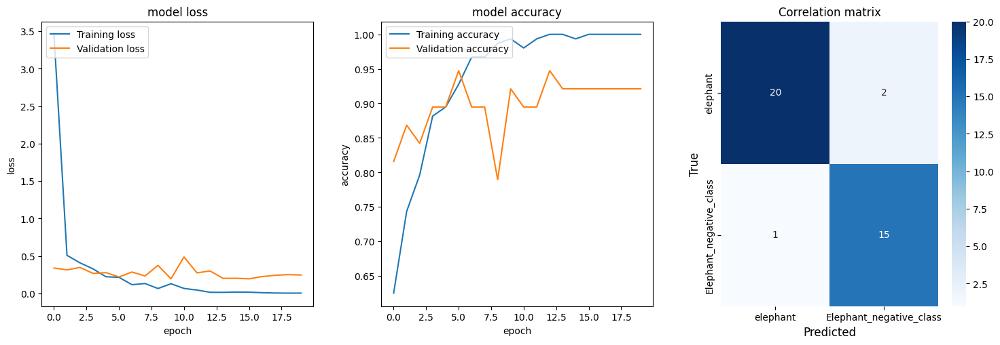

accuracy 92.105
Epoch 1/20


2023-11-24 10:41:16.266674: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_53/dropout_159/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 55ms/step - loss: 10.1623 - accuracy: 0.5132 - val_loss: 1.3733 - val_accuracy: 0.6316
Epoch 2/20
10/10 [==============================] - 0s 25ms/step - loss: 0.9312 - accuracy: 0.7171 - val_loss: 0.7587 - val_accuracy: 0.6579
Epoch 3/20
10/10 [==============================] - 0s 24ms/step - loss: 0.4057 - accuracy: 0.8355 - val_loss: 0.4799 - val_accuracy: 0.7632
Epoch 4/20
10/10 [==============================] - 0s 21ms/step - loss: 0.2794 - accuracy: 0.9145 - val_loss: 0.3788 - val_accuracy: 0.8421
Epoch 5/20
10/10 [==============================] - 0s 18ms/step - loss: 0.2002 - accuracy: 0.9145 - val_loss: 0.5309 - val_accuracy: 0.7895
Epoch 6/20
10/10 [==============================] - 0s 19ms/step - loss: 0.2033 - accuracy: 0.9276 - val_loss: 0.6349 - val_accuracy: 0.7632
Epoch 7/20
10/10 [==============================] - 0s 20ms/step - loss: 0.1458 - accuracy: 0.9539 - val_loss: 0.3759 - val_accuracy: 0.7895
Epoch 8/20
10/10 [=====

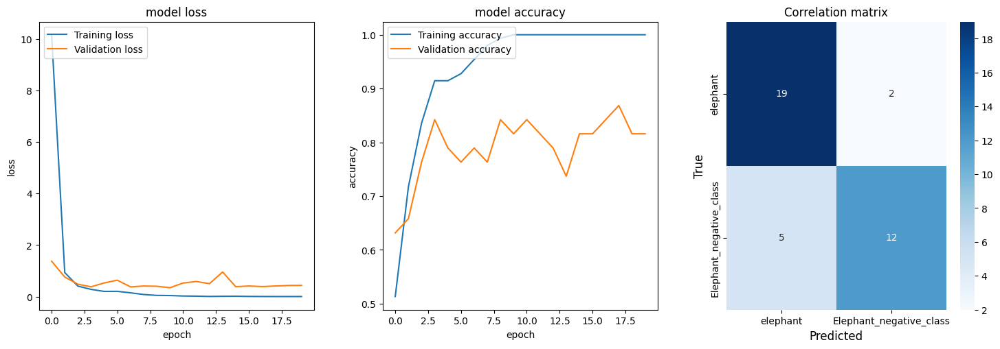

accuracy 81.579
Accuracy: mean=84.737 std=9.024, n=5
Testing: Filters=16, Kernel=(1, 1), Batch size=5
Model: "sequential_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_54 (Conv2D)          (None, 124, 124, 16)      64        
                                                                 
 dropout_162 (Dropout)       (None, 124, 124, 16)      0         
                                                                 
 flatten_54 (Flatten)        (None, 246016)            0         
                                                                 
 dropout_163 (Dropout)       (None, 246016)            0         
                                                                 
 dense_108 (Dense)           (None, 128)               31490176  
                                                                 
 dropout_164 (Dropout)       (None, 128)               0         
                 

2023-11-24 10:41:25.602111: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_55/dropout_165/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 4s 32ms/step - loss: 12.9986 - accuracy: 0.5855 - val_loss: 0.9858 - val_accuracy: 0.7632
Epoch 2/20
31/31 [==============================] - 1s 19ms/step - loss: 1.0560 - accuracy: 0.6974 - val_loss: 0.4348 - val_accuracy: 0.8421
Epoch 3/20
31/31 [==============================] - 0s 16ms/step - loss: 0.3858 - accuracy: 0.8355 - val_loss: 0.4615 - val_accuracy: 0.8158
Epoch 4/20
31/31 [==============================] - 0s 14ms/step - loss: 0.4985 - accuracy: 0.7303 - val_loss: 0.6909 - val_accuracy: 0.7632
Epoch 5/20
31/31 [==============================] - 0s 14ms/step - loss: 0.5007 - accuracy: 0.7763 - val_loss: 0.5181 - val_accuracy: 0.8158
Epoch 6/20
31/31 [==============================] - 0s 13ms/step - loss: 0.4012 - accuracy: 0.8092 - val_loss: 0.5502 - val_accuracy: 0.7632
Epoch 7/20
31/31 [==============================] - 0s 15ms/step - loss: 0.3624 - accuracy: 0.7500 - val_loss: 0.4047 - val_accuracy: 0.8421
Epoch 8/20
31/31 [=====

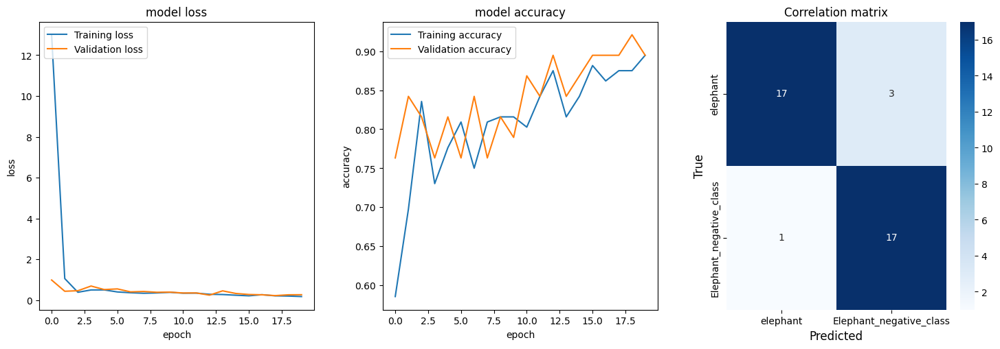

accuracy 89.474
Epoch 1/20


2023-11-24 10:41:48.175289: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_56/dropout_168/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 2s 19ms/step - loss: 5.1330 - accuracy: 0.6842 - val_loss: 6.8823 - val_accuracy: 0.5789
Epoch 2/20
31/31 [==============================] - 0s 13ms/step - loss: 2.9376 - accuracy: 0.7566 - val_loss: 1.1176 - val_accuracy: 0.8158
Epoch 3/20
31/31 [==============================] - 0s 13ms/step - loss: 1.1171 - accuracy: 0.8289 - val_loss: 1.5627 - val_accuracy: 0.7632
Epoch 4/20
31/31 [==============================] - 0s 14ms/step - loss: 0.5230 - accuracy: 0.8684 - val_loss: 0.3798 - val_accuracy: 0.8947
Epoch 5/20
31/31 [==============================] - 0s 14ms/step - loss: 0.3017 - accuracy: 0.8816 - val_loss: 0.9694 - val_accuracy: 0.7895
Epoch 6/20
31/31 [==============================] - 0s 15ms/step - loss: 0.3953 - accuracy: 0.8882 - val_loss: 0.3818 - val_accuracy: 0.8684
Epoch 7/20
31/31 [==============================] - 0s 15ms/step - loss: 0.1062 - accuracy: 0.9605 - val_loss: 0.3550 - val_accuracy: 0.8158
Epoch 8/20
31/31 [======

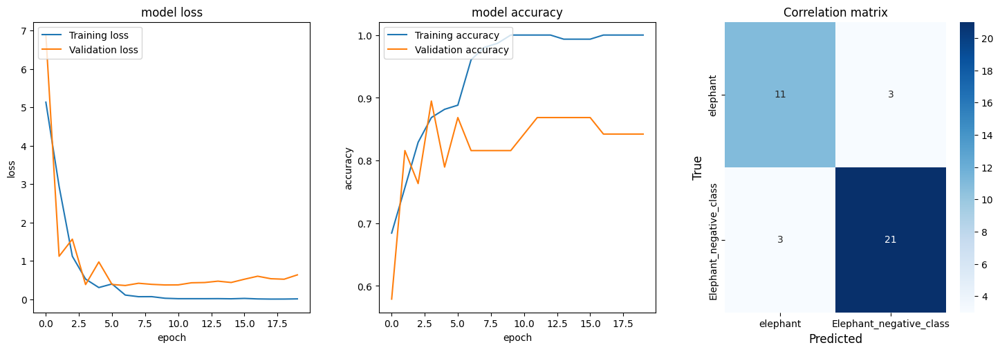

accuracy 84.211
Epoch 1/20


2023-11-24 10:42:01.403104: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_57/dropout_171/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 27ms/step - loss: 11.6605 - accuracy: 0.5724 - val_loss: 1.5354 - val_accuracy: 0.8158
Epoch 2/20
31/31 [==============================] - 1s 17ms/step - loss: 1.9791 - accuracy: 0.7763 - val_loss: 3.4690 - val_accuracy: 0.5789
Epoch 3/20
31/31 [==============================] - 1s 18ms/step - loss: 1.0890 - accuracy: 0.8158 - val_loss: 0.2236 - val_accuracy: 0.9474
Epoch 4/20
31/31 [==============================] - 1s 19ms/step - loss: 0.3356 - accuracy: 0.8224 - val_loss: 0.5211 - val_accuracy: 0.8421
Epoch 5/20
31/31 [==============================] - 1s 19ms/step - loss: 0.2702 - accuracy: 0.8947 - val_loss: 0.2394 - val_accuracy: 0.9211
Epoch 6/20
31/31 [==============================] - 1s 17ms/step - loss: 0.3251 - accuracy: 0.8947 - val_loss: 0.5113 - val_accuracy: 0.8684
Epoch 7/20
31/31 [==============================] - 1s 17ms/step - loss: 0.3367 - accuracy: 0.8750 - val_loss: 0.3245 - val_accuracy: 0.8684
Epoch 8/20
31/31 [=====

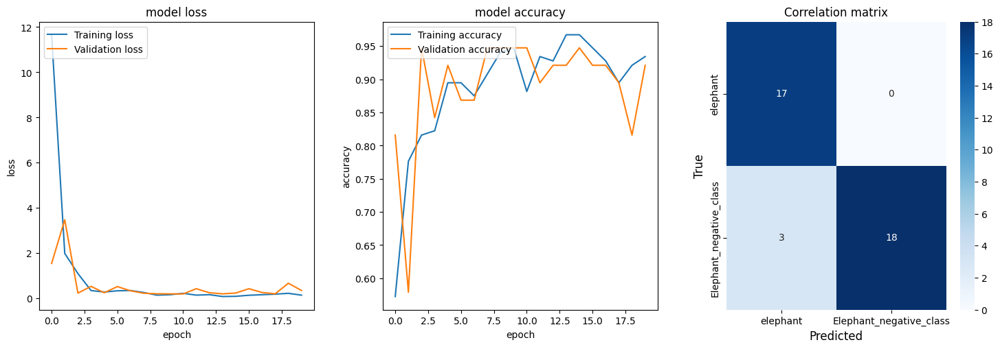

accuracy 92.105
Epoch 1/20


2023-11-24 10:42:25.824974: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_58/dropout_174/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 21ms/step - loss: 9.1904 - accuracy: 0.5724 - val_loss: 2.1990 - val_accuracy: 0.7105
Epoch 2/20
31/31 [==============================] - 0s 13ms/step - loss: 3.0910 - accuracy: 0.7039 - val_loss: 1.1142 - val_accuracy: 0.8158
Epoch 3/20
31/31 [==============================] - 0s 14ms/step - loss: 0.7945 - accuracy: 0.7961 - val_loss: 0.4280 - val_accuracy: 0.8421
Epoch 4/20
31/31 [==============================] - 0s 14ms/step - loss: 0.4922 - accuracy: 0.8553 - val_loss: 0.3629 - val_accuracy: 0.8684
Epoch 5/20
31/31 [==============================] - 0s 13ms/step - loss: 0.2003 - accuracy: 0.9013 - val_loss: 0.2465 - val_accuracy: 0.8947
Epoch 6/20
31/31 [==============================] - 0s 14ms/step - loss: 0.2108 - accuracy: 0.9079 - val_loss: 0.3042 - val_accuracy: 0.8421
Epoch 7/20
31/31 [==============================] - 0s 13ms/step - loss: 0.1493 - accuracy: 0.9342 - val_loss: 0.2934 - val_accuracy: 0.8684
Epoch 8/20
31/31 [======

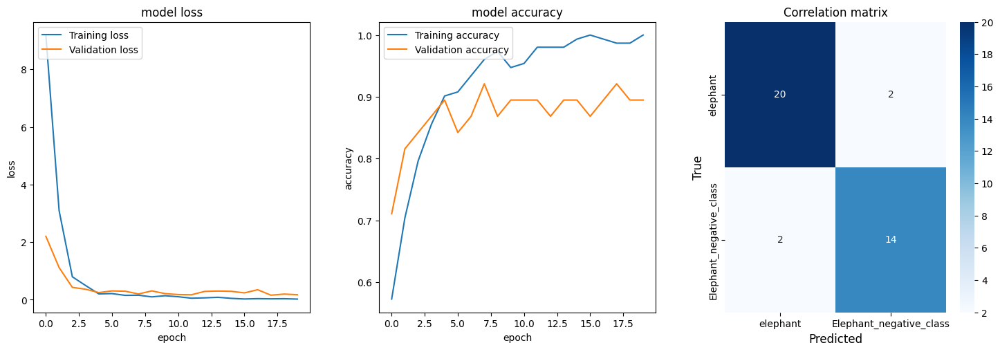

accuracy 89.474
Epoch 1/20


2023-11-24 10:42:38.093630: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_59/dropout_177/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 29ms/step - loss: 12.8810 - accuracy: 0.5724 - val_loss: 3.4408 - val_accuracy: 0.6316
Epoch 2/20
31/31 [==============================] - 1s 16ms/step - loss: 2.0394 - accuracy: 0.7829 - val_loss: 2.9302 - val_accuracy: 0.6842
Epoch 3/20
31/31 [==============================] - 1s 18ms/step - loss: 1.2367 - accuracy: 0.7829 - val_loss: 0.7428 - val_accuracy: 0.7895
Epoch 4/20
31/31 [==============================] - 1s 19ms/step - loss: 0.4337 - accuracy: 0.8684 - val_loss: 0.7822 - val_accuracy: 0.8158
Epoch 5/20
31/31 [==============================] - 1s 18ms/step - loss: 0.1890 - accuracy: 0.9408 - val_loss: 0.6662 - val_accuracy: 0.7632
Epoch 6/20
31/31 [==============================] - 1s 18ms/step - loss: 0.3491 - accuracy: 0.8816 - val_loss: 0.3939 - val_accuracy: 0.8158
Epoch 7/20
31/31 [==============================] - 1s 18ms/step - loss: 0.2454 - accuracy: 0.8947 - val_loss: 0.4722 - val_accuracy: 0.7895
Epoch 8/20
31/31 [=====

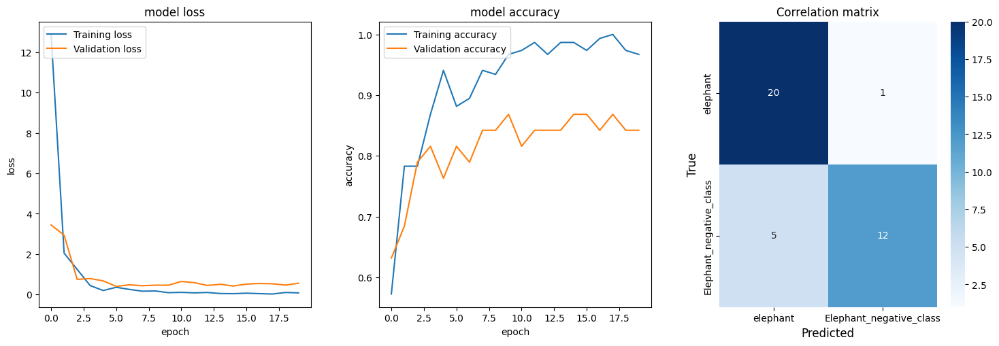

accuracy 84.211
Accuracy: mean=87.895 std=3.158, n=5
Testing: Filters=16, Kernel=(1, 1), Batch size=10
Model: "sequential_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_60 (Conv2D)          (None, 124, 124, 16)      64        
                                                                 
 dropout_180 (Dropout)       (None, 124, 124, 16)      0         
                                                                 
 flatten_60 (Flatten)        (None, 246016)            0         
                                                                 
 dropout_181 (Dropout)       (None, 246016)            0         
                                                                 
 dense_120 (Dense)           (None, 128)               31490176  
                                                                 
 dropout_182 (Dropout)       (None, 128)               0         
                

2023-11-24 10:43:00.883524: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_61/dropout_183/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 48ms/step - loss: 8.2434 - accuracy: 0.5789 - val_loss: 16.1956 - val_accuracy: 0.4737
Epoch 2/20
16/16 [==============================] - 0s 20ms/step - loss: 5.4002 - accuracy: 0.6908 - val_loss: 1.4623 - val_accuracy: 0.7895
Epoch 3/20
16/16 [==============================] - 0s 19ms/step - loss: 2.2167 - accuracy: 0.8355 - val_loss: 1.7906 - val_accuracy: 0.7632
Epoch 4/20
16/16 [==============================] - 0s 18ms/step - loss: 0.9133 - accuracy: 0.8421 - val_loss: 1.2194 - val_accuracy: 0.8421
Epoch 5/20
16/16 [==============================] - 0s 16ms/step - loss: 0.8661 - accuracy: 0.8882 - val_loss: 0.4429 - val_accuracy: 0.8421
Epoch 6/20
16/16 [==============================] - 0s 21ms/step - loss: 0.6976 - accuracy: 0.8618 - val_loss: 0.5205 - val_accuracy: 0.8421
Epoch 7/20
16/16 [==============================] - 0s 21ms/step - loss: 0.2563 - accuracy: 0.9276 - val_loss: 0.1860 - val_accuracy: 0.8947
Epoch 8/20
16/16 [=====

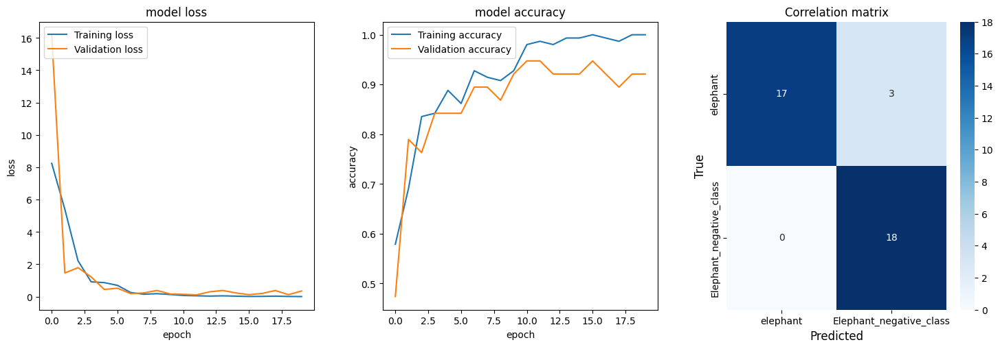

accuracy 92.105
Epoch 1/20


2023-11-24 10:43:14.494243: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_62/dropout_186/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 31ms/step - loss: 11.0340 - accuracy: 0.5197 - val_loss: 2.0000 - val_accuracy: 0.7368
Epoch 2/20
16/16 [==============================] - 0s 17ms/step - loss: 4.1556 - accuracy: 0.7105 - val_loss: 4.3857 - val_accuracy: 0.6316
Epoch 3/20
16/16 [==============================] - 0s 16ms/step - loss: 2.2004 - accuracy: 0.8224 - val_loss: 1.2421 - val_accuracy: 0.8421
Epoch 4/20
16/16 [==============================] - 0s 15ms/step - loss: 0.7738 - accuracy: 0.8750 - val_loss: 0.8077 - val_accuracy: 0.8684
Epoch 5/20
16/16 [==============================] - 0s 16ms/step - loss: 1.3067 - accuracy: 0.8224 - val_loss: 0.6628 - val_accuracy: 0.8684
Epoch 6/20
16/16 [==============================] - 0s 19ms/step - loss: 1.1087 - accuracy: 0.8289 - val_loss: 1.9112 - val_accuracy: 0.7368
Epoch 7/20
16/16 [==============================] - 0s 16ms/step - loss: 0.6706 - accuracy: 0.8487 - val_loss: 0.7220 - val_accuracy: 0.8421
Epoch 8/20
16/16 [=====

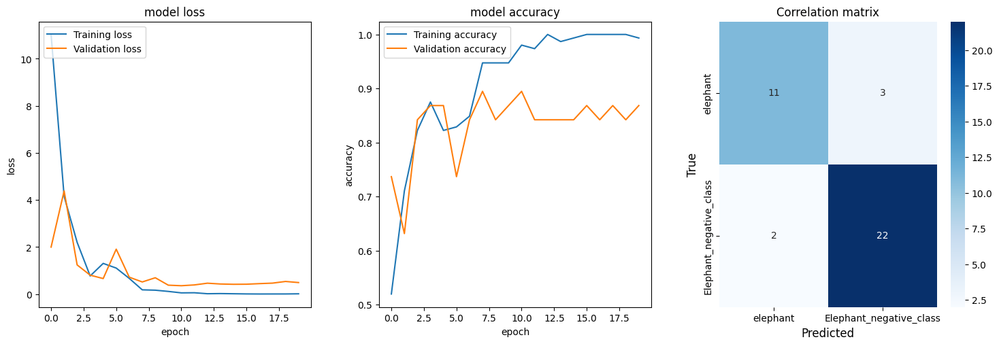

accuracy 86.842
Epoch 1/20


2023-11-24 10:43:27.327561: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_63/dropout_189/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 43ms/step - loss: 8.5736 - accuracy: 0.6316 - val_loss: 6.8870 - val_accuracy: 0.5526
Epoch 2/20
16/16 [==============================] - 0s 25ms/step - loss: 5.6411 - accuracy: 0.7039 - val_loss: 11.1347 - val_accuracy: 0.5263
Epoch 3/20
16/16 [==============================] - 0s 21ms/step - loss: 5.2917 - accuracy: 0.7039 - val_loss: 2.1998 - val_accuracy: 0.8421
Epoch 4/20
16/16 [==============================] - 0s 21ms/step - loss: 1.8239 - accuracy: 0.8026 - val_loss: 0.5787 - val_accuracy: 0.9211
Epoch 5/20
16/16 [==============================] - 0s 24ms/step - loss: 0.7966 - accuracy: 0.8882 - val_loss: 0.6062 - val_accuracy: 0.8947
Epoch 6/20
16/16 [==============================] - 0s 22ms/step - loss: 0.4628 - accuracy: 0.8618 - val_loss: 0.5892 - val_accuracy: 0.8947
Epoch 7/20
16/16 [==============================] - 0s 22ms/step - loss: 0.2223 - accuracy: 0.9145 - val_loss: 0.8623 - val_accuracy: 0.8421
Epoch 8/20
16/16 [=====

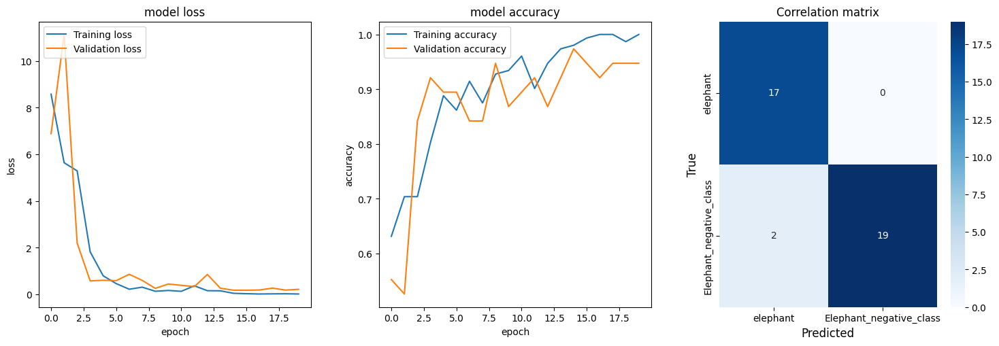

accuracy 94.737
Epoch 1/20


2023-11-24 10:43:40.028173: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_64/dropout_192/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 2s 28ms/step - loss: 4.9883 - accuracy: 0.6382 - val_loss: 1.4375 - val_accuracy: 0.7632
Epoch 2/20
16/16 [==============================] - 0s 19ms/step - loss: 2.1321 - accuracy: 0.7829 - val_loss: 2.0861 - val_accuracy: 0.7368
Epoch 3/20
16/16 [==============================] - 0s 17ms/step - loss: 1.0242 - accuracy: 0.8158 - val_loss: 0.4663 - val_accuracy: 0.8684
Epoch 4/20
16/16 [==============================] - 0s 16ms/step - loss: 0.7867 - accuracy: 0.8553 - val_loss: 0.6262 - val_accuracy: 0.8158
Epoch 5/20
16/16 [==============================] - 0s 16ms/step - loss: 0.5400 - accuracy: 0.8618 - val_loss: 0.2510 - val_accuracy: 0.9211
Epoch 6/20
16/16 [==============================] - 0s 16ms/step - loss: 0.2407 - accuracy: 0.9276 - val_loss: 0.1783 - val_accuracy: 0.9737
Epoch 7/20
16/16 [==============================] - 0s 15ms/step - loss: 0.1312 - accuracy: 0.9605 - val_loss: 0.1827 - val_accuracy: 0.9737
Epoch 8/20
16/16 [======

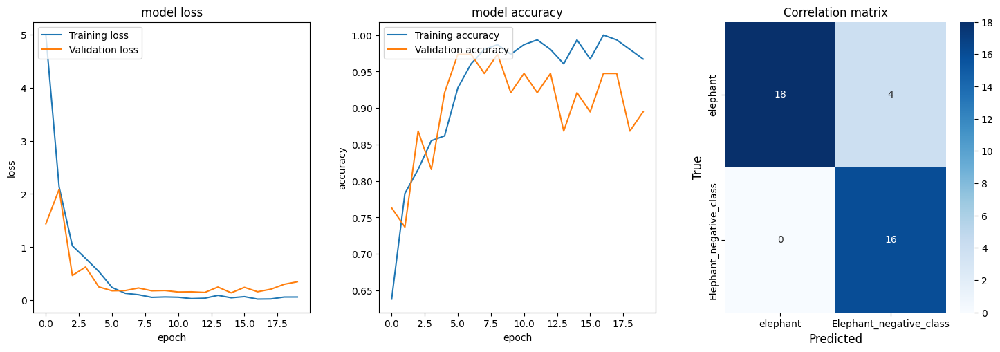

accuracy 89.474
Epoch 1/20


2023-11-24 10:43:52.928744: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_65/dropout_195/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 44ms/step - loss: 22.1732 - accuracy: 0.5658 - val_loss: 20.9908 - val_accuracy: 0.4737
Epoch 2/20
16/16 [==============================] - 0s 22ms/step - loss: 7.0743 - accuracy: 0.7368 - val_loss: 5.1618 - val_accuracy: 0.7105
Epoch 3/20
16/16 [==============================] - 0s 20ms/step - loss: 2.9432 - accuracy: 0.8158 - val_loss: 6.9267 - val_accuracy: 0.6316
Epoch 4/20
16/16 [==============================] - 0s 18ms/step - loss: 6.6910 - accuracy: 0.6974 - val_loss: 3.4787 - val_accuracy: 0.7368
Epoch 5/20
16/16 [==============================] - 0s 16ms/step - loss: 2.4541 - accuracy: 0.8289 - val_loss: 2.5183 - val_accuracy: 0.7368
Epoch 6/20
16/16 [==============================] - 0s 16ms/step - loss: 0.7726 - accuracy: 0.9276 - val_loss: 2.0263 - val_accuracy: 0.7632
Epoch 7/20
16/16 [==============================] - 0s 19ms/step - loss: 0.7051 - accuracy: 0.9013 - val_loss: 1.6782 - val_accuracy: 0.7895
Epoch 8/20
16/16 [====

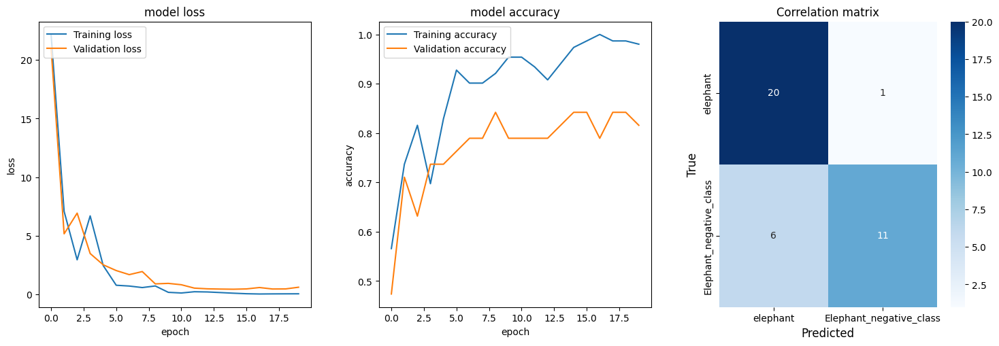

accuracy 81.579
Accuracy: mean=88.947 std=4.528, n=5
Testing: Filters=16, Kernel=(1, 1), Batch size=16
Model: "sequential_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_66 (Conv2D)          (None, 124, 124, 16)      64        
                                                                 
 dropout_198 (Dropout)       (None, 124, 124, 16)      0         
                                                                 
 flatten_66 (Flatten)        (None, 246016)            0         
                                                                 
 dropout_199 (Dropout)       (None, 246016)            0         
                                                                 
 dense_132 (Dense)           (None, 128)               31490176  
                                                                 
 dropout_200 (Dropout)       (None, 128)               0         
                

2023-11-24 10:44:02.400042: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_67/dropout_201/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 59ms/step - loss: 12.5143 - accuracy: 0.5263 - val_loss: 0.6169 - val_accuracy: 0.8684
Epoch 2/20
10/10 [==============================] - 0s 21ms/step - loss: 5.9385 - accuracy: 0.6513 - val_loss: 3.5821 - val_accuracy: 0.6842
Epoch 3/20
10/10 [==============================] - 0s 20ms/step - loss: 5.1062 - accuracy: 0.6579 - val_loss: 1.1510 - val_accuracy: 0.8158
Epoch 4/20
10/10 [==============================] - 0s 19ms/step - loss: 2.3752 - accuracy: 0.7829 - val_loss: 7.2518 - val_accuracy: 0.6316
Epoch 5/20
10/10 [==============================] - 0s 19ms/step - loss: 1.8361 - accuracy: 0.8224 - val_loss: 0.9185 - val_accuracy: 0.8684
Epoch 6/20
10/10 [==============================] - 0s 20ms/step - loss: 1.0036 - accuracy: 0.8882 - val_loss: 0.5713 - val_accuracy: 0.8947
Epoch 7/20
10/10 [==============================] - 0s 19ms/step - loss: 0.7270 - accuracy: 0.8882 - val_loss: 0.8432 - val_accuracy: 0.8421
Epoch 8/20
10/10 [=====

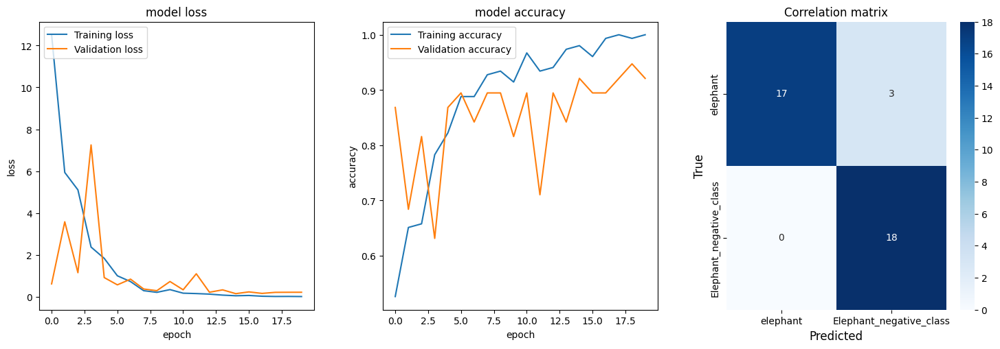

accuracy 92.105
Epoch 1/20


2023-11-24 10:44:15.759168: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_68/dropout_204/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 49ms/step - loss: 4.3277 - accuracy: 0.6316 - val_loss: 0.8629 - val_accuracy: 0.7632
Epoch 2/20
10/10 [==============================] - 0s 25ms/step - loss: 1.2420 - accuracy: 0.8026 - val_loss: 1.4649 - val_accuracy: 0.7632
Epoch 3/20
10/10 [==============================] - 0s 21ms/step - loss: 0.8738 - accuracy: 0.8092 - val_loss: 0.7729 - val_accuracy: 0.8158
Epoch 4/20
10/10 [==============================] - 0s 20ms/step - loss: 0.4862 - accuracy: 0.8618 - val_loss: 0.4350 - val_accuracy: 0.8421
Epoch 5/20
10/10 [==============================] - 0s 19ms/step - loss: 0.5440 - accuracy: 0.8618 - val_loss: 0.6020 - val_accuracy: 0.8421
Epoch 6/20
10/10 [==============================] - 0s 20ms/step - loss: 0.4014 - accuracy: 0.8947 - val_loss: 1.1834 - val_accuracy: 0.7105
Epoch 7/20
10/10 [==============================] - 0s 22ms/step - loss: 0.3529 - accuracy: 0.8947 - val_loss: 0.4338 - val_accuracy: 0.9211
Epoch 8/20
10/10 [======

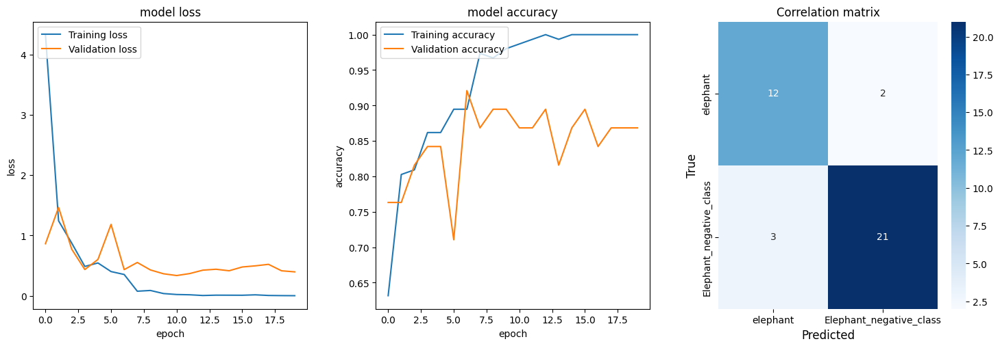

accuracy 86.842
Epoch 1/20


2023-11-24 10:44:23.598168: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_69/dropout_207/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 145ms/step - loss: 22.7147 - accuracy: 0.4342 - val_loss: 14.1933 - val_accuracy: 0.4474
Epoch 2/20
10/10 [==============================] - 0s 21ms/step - loss: 8.8886 - accuracy: 0.5461 - val_loss: 3.5686 - val_accuracy: 0.5526
Epoch 3/20
10/10 [==============================] - 0s 21ms/step - loss: 2.8392 - accuracy: 0.6974 - val_loss: 4.4449 - val_accuracy: 0.5263
Epoch 4/20
10/10 [==============================] - 0s 20ms/step - loss: 1.7101 - accuracy: 0.7039 - val_loss: 0.4731 - val_accuracy: 0.8421
Epoch 5/20
10/10 [==============================] - 0s 20ms/step - loss: 0.4161 - accuracy: 0.8487 - val_loss: 0.3319 - val_accuracy: 0.8421
Epoch 6/20
10/10 [==============================] - 0s 20ms/step - loss: 0.3255 - accuracy: 0.8553 - val_loss: 0.3132 - val_accuracy: 0.8684
Epoch 7/20
10/10 [==============================] - 0s 22ms/step - loss: 0.3389 - accuracy: 0.8289 - val_loss: 0.2327 - val_accuracy: 0.8947
Epoch 8/20
10/10 [===

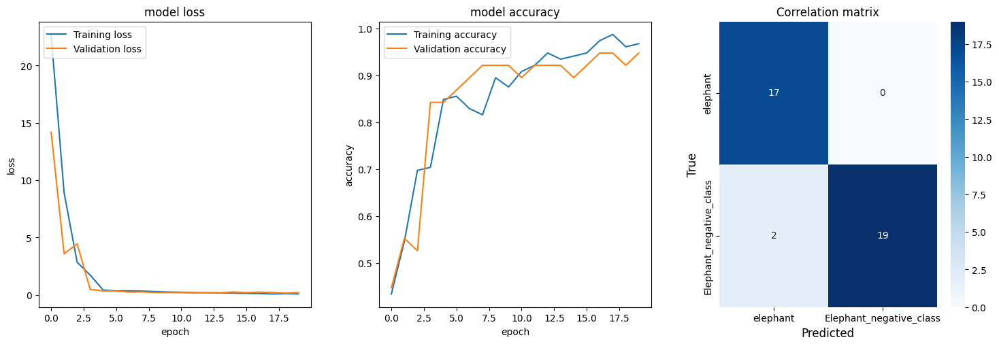

accuracy 94.737
Epoch 1/20


2023-11-24 10:44:33.490815: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_70/dropout_210/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 49ms/step - loss: 14.9306 - accuracy: 0.5329 - val_loss: 8.0707 - val_accuracy: 0.4211
Epoch 2/20
10/10 [==============================] - 0s 29ms/step - loss: 3.0807 - accuracy: 0.6184 - val_loss: 0.2564 - val_accuracy: 0.8947
Epoch 3/20
10/10 [==============================] - 0s 25ms/step - loss: 1.0341 - accuracy: 0.7632 - val_loss: 0.2207 - val_accuracy: 0.8947
Epoch 4/20
10/10 [==============================] - 0s 35ms/step - loss: 0.4770 - accuracy: 0.7895 - val_loss: 0.3123 - val_accuracy: 0.8947
Epoch 5/20
10/10 [==============================] - 0s 30ms/step - loss: 0.3950 - accuracy: 0.8487 - val_loss: 0.2598 - val_accuracy: 0.8947
Epoch 6/20
10/10 [==============================] - 0s 25ms/step - loss: 0.3831 - accuracy: 0.8224 - val_loss: 0.2258 - val_accuracy: 0.9737
Epoch 7/20
10/10 [==============================] - 0s 27ms/step - loss: 0.3121 - accuracy: 0.8289 - val_loss: 0.2314 - val_accuracy: 0.8684
Epoch 8/20
10/10 [=====

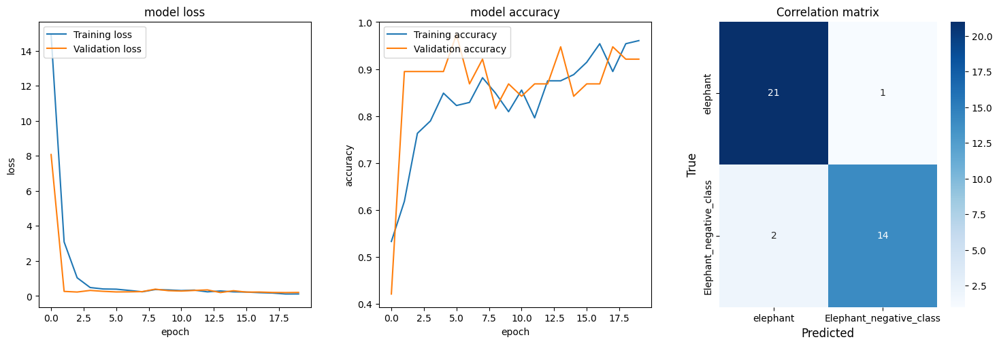

accuracy 92.105
Epoch 1/20


2023-11-24 10:44:46.270263: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_71/dropout_213/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 40ms/step - loss: 4.5107 - accuracy: 0.6711 - val_loss: 1.6721 - val_accuracy: 0.7895
Epoch 2/20
10/10 [==============================] - 0s 26ms/step - loss: 1.3512 - accuracy: 0.7697 - val_loss: 2.2068 - val_accuracy: 0.7105
Epoch 3/20
10/10 [==============================] - 0s 20ms/step - loss: 1.2355 - accuracy: 0.8092 - val_loss: 2.9690 - val_accuracy: 0.6842
Epoch 4/20
10/10 [==============================] - 0s 21ms/step - loss: 0.8530 - accuracy: 0.8355 - val_loss: 0.7522 - val_accuracy: 0.8421
Epoch 5/20
10/10 [==============================] - 0s 19ms/step - loss: 0.1490 - accuracy: 0.9539 - val_loss: 0.6018 - val_accuracy: 0.8158
Epoch 6/20
10/10 [==============================] - 0s 19ms/step - loss: 0.1532 - accuracy: 0.9276 - val_loss: 0.6101 - val_accuracy: 0.7895
Epoch 7/20
10/10 [==============================] - 0s 20ms/step - loss: 0.1190 - accuracy: 0.9342 - val_loss: 0.4495 - val_accuracy: 0.8421
Epoch 8/20
10/10 [======

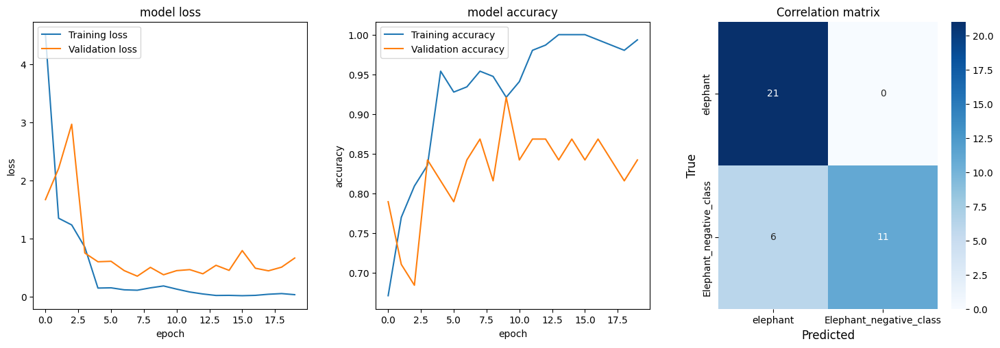

accuracy 84.211
Accuracy: mean=90.000 std=3.868, n=5
Testing: Filters=16, Kernel=(2, 2), Batch size=5
Model: "sequential_72"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_72 (Conv2D)          (None, 123, 123, 16)      208       
                                                                 
 dropout_216 (Dropout)       (None, 123, 123, 16)      0         
                                                                 
 flatten_72 (Flatten)        (None, 242064)            0         
                                                                 
 dropout_217 (Dropout)       (None, 242064)            0         
                                                                 
 dense_144 (Dense)           (None, 128)               30984320  
                                                                 
 dropout_218 (Dropout)       (None, 128)               0         
                 

2023-11-24 10:44:54.081123: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_73/dropout_219/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 30ms/step - loss: 4.2396 - accuracy: 0.6316 - val_loss: 2.0732 - val_accuracy: 0.6842
Epoch 2/20
31/31 [==============================] - 1s 18ms/step - loss: 0.4274 - accuracy: 0.8882 - val_loss: 0.3314 - val_accuracy: 0.8684
Epoch 3/20
31/31 [==============================] - 1s 17ms/step - loss: 0.2084 - accuracy: 0.9474 - val_loss: 0.3588 - val_accuracy: 0.8947
Epoch 4/20
31/31 [==============================] - 1s 18ms/step - loss: 0.0794 - accuracy: 0.9737 - val_loss: 0.5094 - val_accuracy: 0.8947
Epoch 5/20
31/31 [==============================] - 1s 18ms/step - loss: 0.0471 - accuracy: 0.9803 - val_loss: 0.4867 - val_accuracy: 0.8947
Epoch 6/20
31/31 [==============================] - 1s 20ms/step - loss: 0.0166 - accuracy: 1.0000 - val_loss: 0.5286 - val_accuracy: 0.8947
Epoch 7/20
31/31 [==============================] - 1s 18ms/step - loss: 0.0080 - accuracy: 1.0000 - val_loss: 0.5847 - val_accuracy: 0.8947
Epoch 8/20
31/31 [======

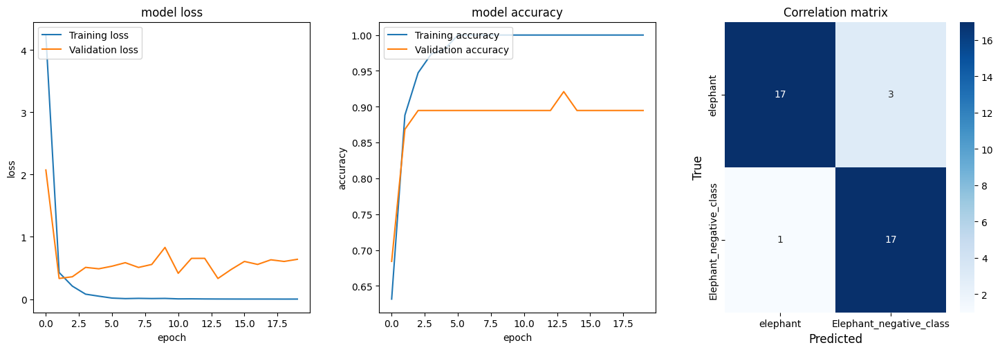

accuracy 89.474
Epoch 1/20


2023-11-24 10:45:09.072578: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_74/dropout_222/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 22ms/step - loss: 4.0700 - accuracy: 0.6184 - val_loss: 2.0589 - val_accuracy: 0.5263
Epoch 2/20
31/31 [==============================] - 0s 13ms/step - loss: 0.7111 - accuracy: 0.7303 - val_loss: 0.6519 - val_accuracy: 0.7368
Epoch 3/20
31/31 [==============================] - 0s 14ms/step - loss: 0.6248 - accuracy: 0.7961 - val_loss: 0.5569 - val_accuracy: 0.7368
Epoch 4/20
31/31 [==============================] - 0s 14ms/step - loss: 0.2671 - accuracy: 0.8947 - val_loss: 0.3017 - val_accuracy: 0.8421
Epoch 5/20
31/31 [==============================] - 0s 15ms/step - loss: 0.1602 - accuracy: 0.9276 - val_loss: 0.2968 - val_accuracy: 0.8684
Epoch 6/20
31/31 [==============================] - 0s 14ms/step - loss: 0.0867 - accuracy: 0.9671 - val_loss: 0.2622 - val_accuracy: 0.8684
Epoch 7/20
31/31 [==============================] - 0s 13ms/step - loss: 0.0787 - accuracy: 0.9539 - val_loss: 0.4547 - val_accuracy: 0.8421
Epoch 8/20
31/31 [======

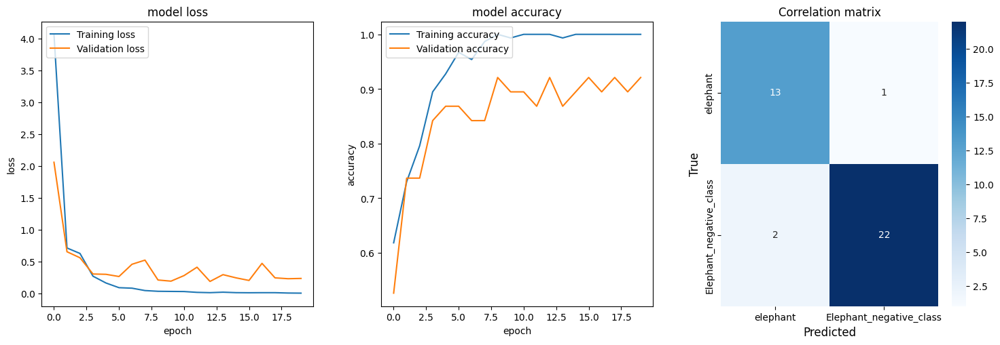

accuracy 92.105
Epoch 1/20


2023-11-24 10:45:22.564405: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_75/dropout_225/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 29ms/step - loss: 6.1908 - accuracy: 0.5921 - val_loss: 1.7538 - val_accuracy: 0.7368
Epoch 2/20
31/31 [==============================] - 1s 16ms/step - loss: 1.2024 - accuracy: 0.7829 - val_loss: 0.6903 - val_accuracy: 0.8158
Epoch 3/20
31/31 [==============================] - 1s 17ms/step - loss: 0.3244 - accuracy: 0.8882 - val_loss: 1.2514 - val_accuracy: 0.7632
Epoch 4/20
31/31 [==============================] - 0s 16ms/step - loss: 0.4659 - accuracy: 0.8750 - val_loss: 0.2007 - val_accuracy: 0.9474
Epoch 5/20
31/31 [==============================] - 1s 18ms/step - loss: 0.0693 - accuracy: 0.9737 - val_loss: 0.1898 - val_accuracy: 0.9211
Epoch 6/20
31/31 [==============================] - 1s 18ms/step - loss: 0.1153 - accuracy: 0.9539 - val_loss: 0.2820 - val_accuracy: 0.8947
Epoch 7/20
31/31 [==============================] - 1s 17ms/step - loss: 0.0575 - accuracy: 0.9803 - val_loss: 0.3326 - val_accuracy: 0.8947
Epoch 8/20
31/31 [======

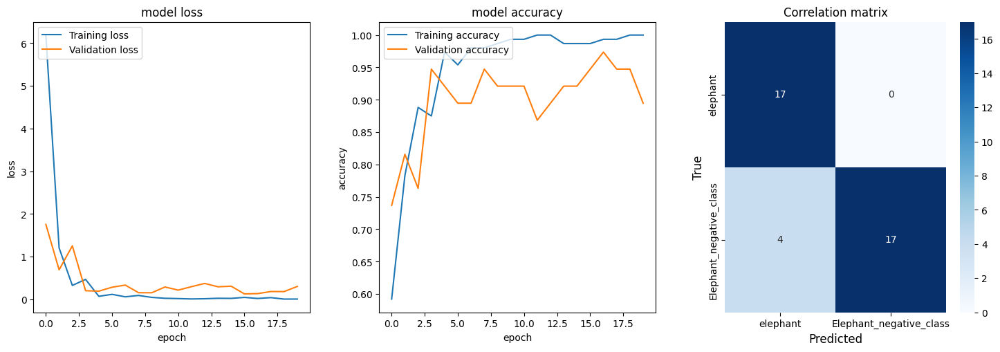

accuracy 89.474
Epoch 1/20


2023-11-24 10:45:45.870232: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_76/dropout_228/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 27ms/step - loss: 2.5182 - accuracy: 0.6184 - val_loss: 0.3072 - val_accuracy: 0.8947
Epoch 2/20
31/31 [==============================] - 1s 16ms/step - loss: 0.5879 - accuracy: 0.7961 - val_loss: 0.5493 - val_accuracy: 0.8421
Epoch 3/20
31/31 [==============================] - 1s 17ms/step - loss: 0.3545 - accuracy: 0.8816 - val_loss: 0.1463 - val_accuracy: 0.9474
Epoch 4/20
31/31 [==============================] - 1s 17ms/step - loss: 0.1132 - accuracy: 0.9408 - val_loss: 0.2181 - val_accuracy: 0.8947
Epoch 5/20
31/31 [==============================] - 0s 15ms/step - loss: 0.1066 - accuracy: 0.9605 - val_loss: 0.1795 - val_accuracy: 0.9474
Epoch 6/20
31/31 [==============================] - 0s 15ms/step - loss: 0.0871 - accuracy: 0.9671 - val_loss: 0.1494 - val_accuracy: 0.9737
Epoch 7/20
31/31 [==============================] - 0s 15ms/step - loss: 0.0353 - accuracy: 0.9934 - val_loss: 0.2667 - val_accuracy: 0.9474
Epoch 8/20
31/31 [======

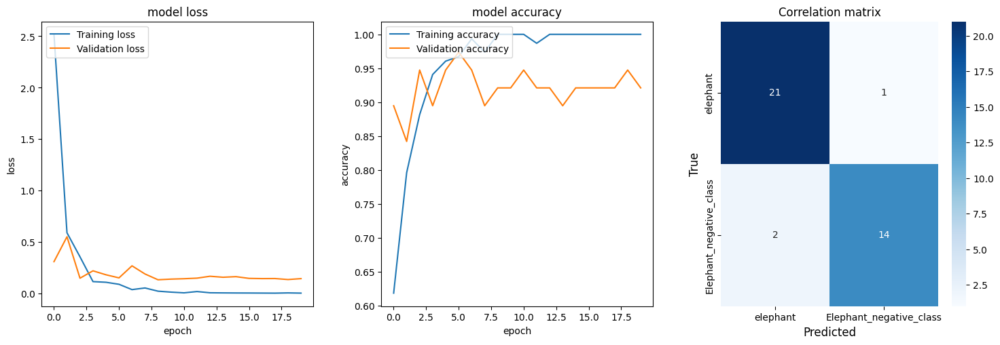

accuracy 92.105
Epoch 1/20


2023-11-24 10:45:59.413782: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_77/dropout_231/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 22ms/step - loss: 9.2123 - accuracy: 0.6118 - val_loss: 2.1032 - val_accuracy: 0.8158
Epoch 2/20
31/31 [==============================] - 0s 14ms/step - loss: 2.6636 - accuracy: 0.8026 - val_loss: 1.0571 - val_accuracy: 0.8158
Epoch 3/20
31/31 [==============================] - 0s 14ms/step - loss: 0.9786 - accuracy: 0.8421 - val_loss: 0.9343 - val_accuracy: 0.8158
Epoch 4/20
31/31 [==============================] - 0s 15ms/step - loss: 0.5537 - accuracy: 0.9013 - val_loss: 0.7108 - val_accuracy: 0.8158
Epoch 5/20
31/31 [==============================] - 0s 13ms/step - loss: 0.1097 - accuracy: 0.9408 - val_loss: 0.7320 - val_accuracy: 0.7895
Epoch 6/20
31/31 [==============================] - 0s 13ms/step - loss: 0.0673 - accuracy: 0.9737 - val_loss: 0.2670 - val_accuracy: 0.8684
Epoch 7/20
31/31 [==============================] - 0s 13ms/step - loss: 0.0512 - accuracy: 0.9803 - val_loss: 0.3965 - val_accuracy: 0.8421
Epoch 8/20
31/31 [======

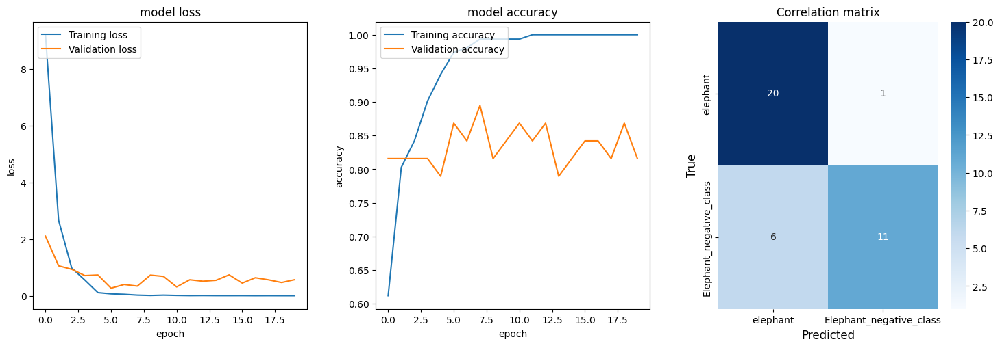

accuracy 81.579
Accuracy: mean=88.947 std=3.868, n=5
Testing: Filters=16, Kernel=(2, 2), Batch size=10
Model: "sequential_78"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_78 (Conv2D)          (None, 123, 123, 16)      208       
                                                                 
 dropout_234 (Dropout)       (None, 123, 123, 16)      0         
                                                                 
 flatten_78 (Flatten)        (None, 242064)            0         
                                                                 
 dropout_235 (Dropout)       (None, 242064)            0         
                                                                 
 dense_156 (Dense)           (None, 128)               30984320  
                                                                 
 dropout_236 (Dropout)       (None, 128)               0         
                

2023-11-24 10:46:22.379001: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_79/dropout_237/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 32ms/step - loss: 9.0490 - accuracy: 0.4605 - val_loss: 1.0635 - val_accuracy: 0.7895
Epoch 2/20
16/16 [==============================] - 0s 16ms/step - loss: 2.3038 - accuracy: 0.7237 - val_loss: 0.6718 - val_accuracy: 0.8684
Epoch 3/20
16/16 [==============================] - 0s 16ms/step - loss: 0.8034 - accuracy: 0.8289 - val_loss: 0.7525 - val_accuracy: 0.8158
Epoch 4/20
16/16 [==============================] - 0s 18ms/step - loss: 0.2341 - accuracy: 0.9211 - val_loss: 0.6167 - val_accuracy: 0.8684
Epoch 5/20
16/16 [==============================] - 0s 16ms/step - loss: 0.3672 - accuracy: 0.8684 - val_loss: 0.5126 - val_accuracy: 0.8684
Epoch 6/20
16/16 [==============================] - 0s 15ms/step - loss: 0.2047 - accuracy: 0.9342 - val_loss: 0.6675 - val_accuracy: 0.7895
Epoch 7/20
16/16 [==============================] - 0s 16ms/step - loss: 0.1261 - accuracy: 0.9474 - val_loss: 0.6766 - val_accuracy: 0.8421
Epoch 8/20
16/16 [======

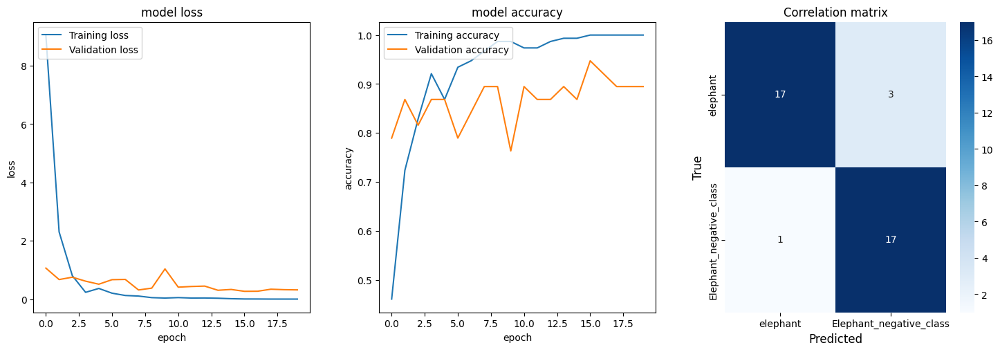

accuracy 89.474
Epoch 1/20


2023-11-24 10:46:35.585612: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_80/dropout_240/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 46ms/step - loss: 3.5302 - accuracy: 0.6184 - val_loss: 1.2248 - val_accuracy: 0.7632
Epoch 2/20
16/16 [==============================] - 0s 24ms/step - loss: 1.4419 - accuracy: 0.7632 - val_loss: 1.8153 - val_accuracy: 0.6316
Epoch 3/20
16/16 [==============================] - 0s 24ms/step - loss: 0.6331 - accuracy: 0.8882 - val_loss: 0.4048 - val_accuracy: 0.8421
Epoch 4/20
16/16 [==============================] - 0s 24ms/step - loss: 0.1421 - accuracy: 0.9342 - val_loss: 0.3398 - val_accuracy: 0.8684
Epoch 5/20
16/16 [==============================] - 0s 21ms/step - loss: 0.1010 - accuracy: 0.9737 - val_loss: 0.4109 - val_accuracy: 0.8158
Epoch 6/20
16/16 [==============================] - 0s 20ms/step - loss: 0.0535 - accuracy: 0.9737 - val_loss: 0.2929 - val_accuracy: 0.8421
Epoch 7/20
16/16 [==============================] - 0s 19ms/step - loss: 0.0140 - accuracy: 1.0000 - val_loss: 0.3151 - val_accuracy: 0.8684
Epoch 8/20
16/16 [======

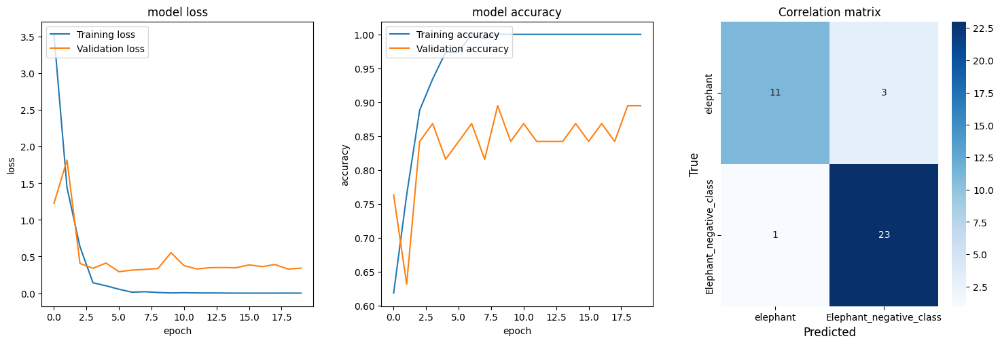

accuracy 89.474
Epoch 1/20


2023-11-24 10:46:46.824919: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_81/dropout_243/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 33ms/step - loss: 8.3271 - accuracy: 0.5987 - val_loss: 0.3254 - val_accuracy: 0.8421
Epoch 2/20
16/16 [==============================] - 0s 16ms/step - loss: 1.6206 - accuracy: 0.7303 - val_loss: 0.6133 - val_accuracy: 0.8421
Epoch 3/20
16/16 [==============================] - 0s 18ms/step - loss: 0.5389 - accuracy: 0.8355 - val_loss: 0.1890 - val_accuracy: 0.9211
Epoch 4/20
16/16 [==============================] - 0s 16ms/step - loss: 0.4485 - accuracy: 0.8684 - val_loss: 0.1889 - val_accuracy: 0.9211
Epoch 5/20
16/16 [==============================] - 0s 16ms/step - loss: 0.3750 - accuracy: 0.8421 - val_loss: 0.2452 - val_accuracy: 0.9211
Epoch 6/20
16/16 [==============================] - 0s 21ms/step - loss: 0.2678 - accuracy: 0.8816 - val_loss: 0.4004 - val_accuracy: 0.8158
Epoch 7/20
16/16 [==============================] - 0s 21ms/step - loss: 0.2128 - accuracy: 0.8947 - val_loss: 0.2549 - val_accuracy: 0.8947
Epoch 8/20
16/16 [======

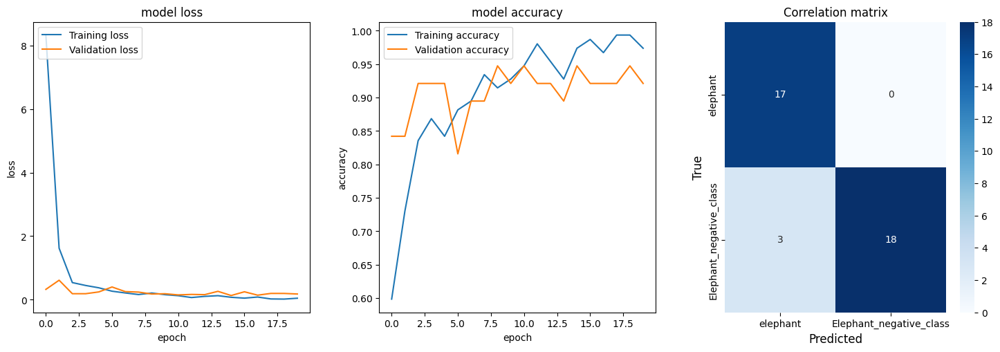

accuracy 92.105
Epoch 1/20


2023-11-24 10:46:57.842413: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_82/dropout_246/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 49ms/step - loss: 13.3523 - accuracy: 0.5197 - val_loss: 0.6483 - val_accuracy: 0.8684
Epoch 2/20
16/16 [==============================] - 0s 24ms/step - loss: 2.8137 - accuracy: 0.7237 - val_loss: 2.1583 - val_accuracy: 0.8158
Epoch 3/20
16/16 [==============================] - 0s 23ms/step - loss: 1.5252 - accuracy: 0.8026 - val_loss: 2.3628 - val_accuracy: 0.7632
Epoch 4/20
16/16 [==============================] - 0s 25ms/step - loss: 1.3401 - accuracy: 0.7895 - val_loss: 0.5981 - val_accuracy: 0.8421
Epoch 5/20
16/16 [==============================] - 0s 23ms/step - loss: 0.3845 - accuracy: 0.8816 - val_loss: 0.2943 - val_accuracy: 0.8947
Epoch 6/20
16/16 [==============================] - 0s 25ms/step - loss: 0.1469 - accuracy: 0.9539 - val_loss: 0.3295 - val_accuracy: 0.8947
Epoch 7/20
16/16 [==============================] - 0s 22ms/step - loss: 0.1191 - accuracy: 0.9671 - val_loss: 0.2305 - val_accuracy: 0.9211
Epoch 8/20
16/16 [=====

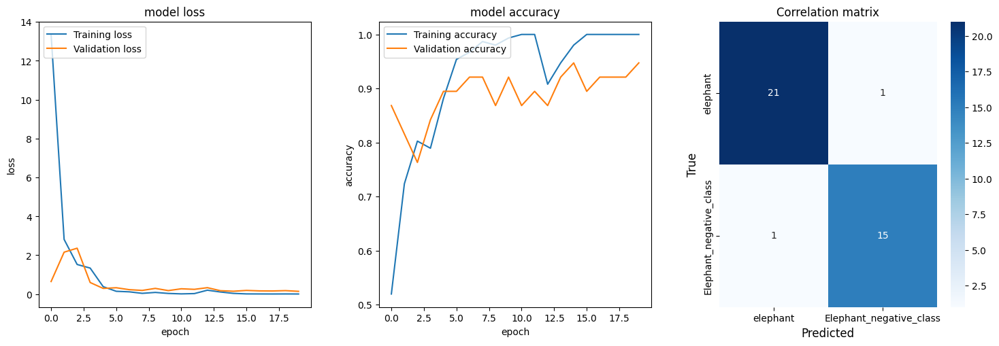

accuracy 94.737
Epoch 1/20


2023-11-24 10:47:08.361009: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_83/dropout_249/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 36ms/step - loss: 10.1278 - accuracy: 0.5855 - val_loss: 5.5878 - val_accuracy: 0.6842
Epoch 2/20
16/16 [==============================] - 0s 16ms/step - loss: 2.1228 - accuracy: 0.8289 - val_loss: 3.0057 - val_accuracy: 0.7632
Epoch 3/20
16/16 [==============================] - 0s 16ms/step - loss: 1.4399 - accuracy: 0.7895 - val_loss: 6.6542 - val_accuracy: 0.4737
Epoch 4/20
16/16 [==============================] - 0s 19ms/step - loss: 1.7399 - accuracy: 0.7303 - val_loss: 0.5863 - val_accuracy: 0.7895
Epoch 5/20
16/16 [==============================] - 0s 16ms/step - loss: 0.2703 - accuracy: 0.9013 - val_loss: 0.9203 - val_accuracy: 0.8158
Epoch 6/20
16/16 [==============================] - 0s 16ms/step - loss: 0.1271 - accuracy: 0.9539 - val_loss: 0.6900 - val_accuracy: 0.7895
Epoch 7/20
16/16 [==============================] - 0s 15ms/step - loss: 0.1285 - accuracy: 0.9474 - val_loss: 0.4718 - val_accuracy: 0.8684
Epoch 8/20
16/16 [=====

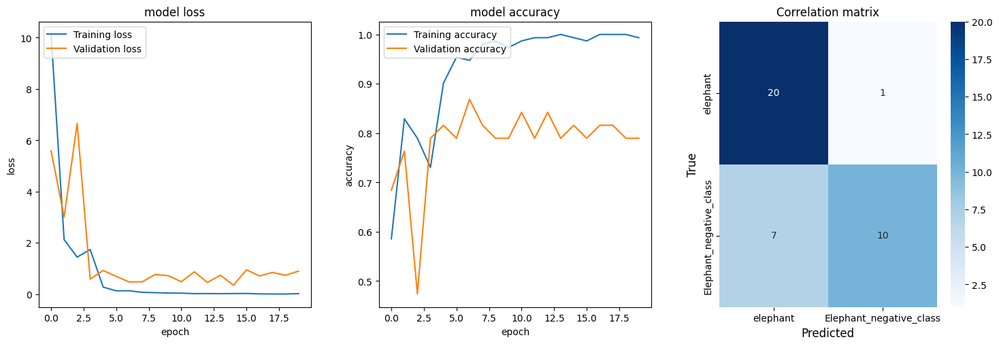

accuracy 78.947
Accuracy: mean=88.947 std=5.367, n=5
Testing: Filters=16, Kernel=(2, 2), Batch size=16
Model: "sequential_84"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_84 (Conv2D)          (None, 123, 123, 16)      208       
                                                                 
 dropout_252 (Dropout)       (None, 123, 123, 16)      0         
                                                                 
 flatten_84 (Flatten)        (None, 242064)            0         
                                                                 
 dropout_253 (Dropout)       (None, 242064)            0         
                                                                 
 dense_168 (Dense)           (None, 128)               30984320  
                                                                 
 dropout_254 (Dropout)       (None, 128)               0         
                

2023-11-24 10:47:21.667128: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_85/dropout_255/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 68ms/step - loss: 13.1184 - accuracy: 0.4211 - val_loss: 4.8889 - val_accuracy: 0.5789
Epoch 2/20
10/10 [==============================] - 0s 30ms/step - loss: 3.7859 - accuracy: 0.7039 - val_loss: 2.1715 - val_accuracy: 0.7105
Epoch 3/20
10/10 [==============================] - 0s 26ms/step - loss: 1.5130 - accuracy: 0.8355 - val_loss: 2.7111 - val_accuracy: 0.6842
Epoch 4/20
10/10 [==============================] - 0s 29ms/step - loss: 0.5109 - accuracy: 0.8684 - val_loss: 1.0043 - val_accuracy: 0.8158
Epoch 5/20
10/10 [==============================] - 0s 26ms/step - loss: 0.4438 - accuracy: 0.9079 - val_loss: 1.8037 - val_accuracy: 0.7895
Epoch 6/20
10/10 [==============================] - 0s 24ms/step - loss: 0.7984 - accuracy: 0.8618 - val_loss: 0.8315 - val_accuracy: 0.8421
Epoch 7/20
10/10 [==============================] - 0s 27ms/step - loss: 0.3711 - accuracy: 0.9211 - val_loss: 1.4297 - val_accuracy: 0.8158
Epoch 8/20
10/10 [=====

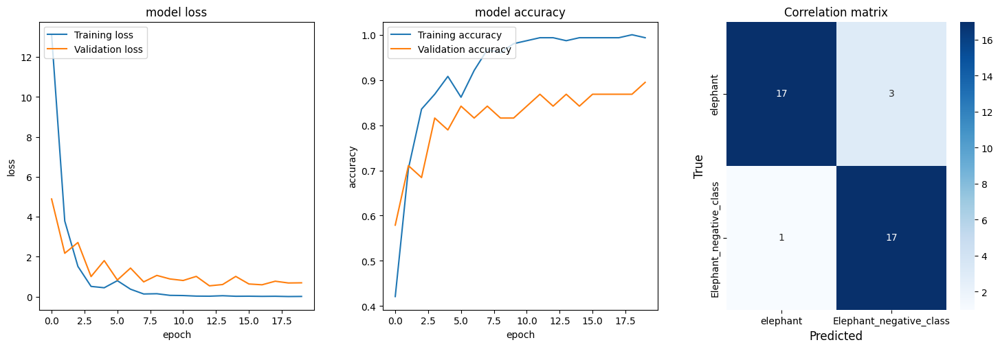

accuracy 89.474
Epoch 1/20


2023-11-24 10:47:30.650613: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_86/dropout_258/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 2s 46ms/step - loss: 14.9939 - accuracy: 0.4408 - val_loss: 13.3577 - val_accuracy: 0.3684
Epoch 2/20
10/10 [==============================] - 0s 21ms/step - loss: 4.8781 - accuracy: 0.6053 - val_loss: 1.0385 - val_accuracy: 0.7368
Epoch 3/20
10/10 [==============================] - 0s 21ms/step - loss: 2.3200 - accuracy: 0.7039 - val_loss: 0.7900 - val_accuracy: 0.8421
Epoch 4/20
10/10 [==============================] - 0s 20ms/step - loss: 1.2309 - accuracy: 0.7434 - val_loss: 1.0769 - val_accuracy: 0.7105
Epoch 5/20
10/10 [==============================] - 0s 20ms/step - loss: 0.9571 - accuracy: 0.8026 - val_loss: 0.4032 - val_accuracy: 0.8684
Epoch 6/20
10/10 [==============================] - 0s 20ms/step - loss: 0.4188 - accuracy: 0.8355 - val_loss: 0.4031 - val_accuracy: 0.8684
Epoch 7/20
10/10 [==============================] - 0s 20ms/step - loss: 0.3623 - accuracy: 0.8553 - val_loss: 0.3095 - val_accuracy: 0.8684
Epoch 8/20
10/10 [====

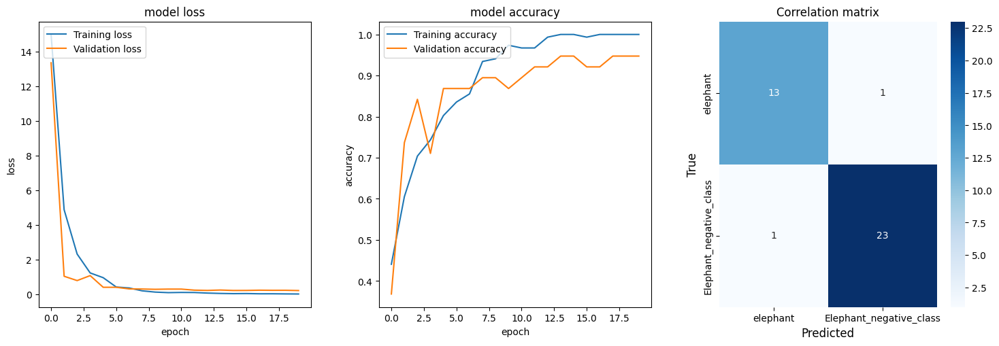

accuracy 94.737
Epoch 1/20


2023-11-24 10:47:38.552648: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_87/dropout_261/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 60ms/step - loss: 11.6368 - accuracy: 0.4539 - val_loss: 10.1550 - val_accuracy: 0.4737
Epoch 2/20
10/10 [==============================] - 0s 29ms/step - loss: 3.7680 - accuracy: 0.7237 - val_loss: 3.1635 - val_accuracy: 0.6842
Epoch 3/20
10/10 [==============================] - 0s 28ms/step - loss: 2.1466 - accuracy: 0.7500 - val_loss: 0.5446 - val_accuracy: 0.8421
Epoch 4/20
10/10 [==============================] - 0s 28ms/step - loss: 0.6425 - accuracy: 0.8355 - val_loss: 1.0088 - val_accuracy: 0.7895
Epoch 5/20
10/10 [==============================] - 0s 29ms/step - loss: 0.5836 - accuracy: 0.8224 - val_loss: 0.5373 - val_accuracy: 0.8421
Epoch 6/20
10/10 [==============================] - 0s 30ms/step - loss: 0.4072 - accuracy: 0.8487 - val_loss: 0.2221 - val_accuracy: 0.9211
Epoch 7/20
10/10 [==============================] - 0s 26ms/step - loss: 0.1909 - accuracy: 0.9211 - val_loss: 0.4400 - val_accuracy: 0.8421
Epoch 8/20
10/10 [====

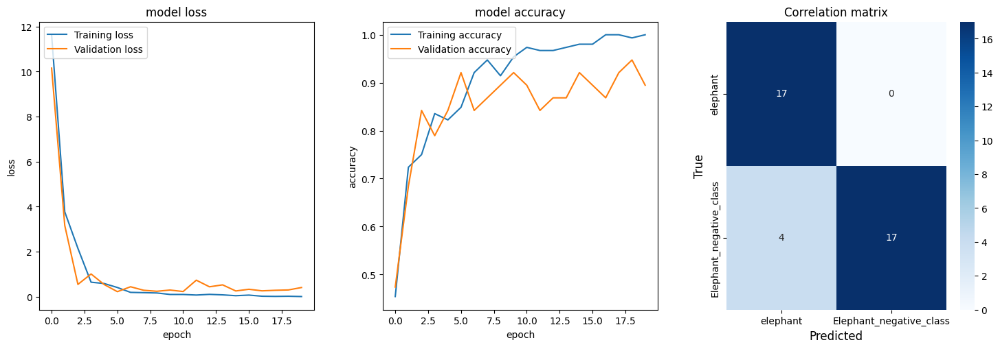

accuracy 89.474
Epoch 1/20


2023-11-24 10:47:51.410817: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_88/dropout_264/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 51ms/step - loss: 12.0068 - accuracy: 0.4934 - val_loss: 3.1528 - val_accuracy: 0.4211
Epoch 2/20
10/10 [==============================] - 0s 21ms/step - loss: 1.3606 - accuracy: 0.7105 - val_loss: 0.2110 - val_accuracy: 0.8947
Epoch 3/20
10/10 [==============================] - 0s 21ms/step - loss: 0.9141 - accuracy: 0.7303 - val_loss: 0.5700 - val_accuracy: 0.7632
Epoch 4/20
10/10 [==============================] - 0s 19ms/step - loss: 0.7938 - accuracy: 0.7829 - val_loss: 0.3546 - val_accuracy: 0.8421
Epoch 5/20
10/10 [==============================] - 0s 25ms/step - loss: 0.4770 - accuracy: 0.8158 - val_loss: 0.2307 - val_accuracy: 0.8947
Epoch 6/20
10/10 [==============================] - 0s 20ms/step - loss: 0.4023 - accuracy: 0.8026 - val_loss: 0.2650 - val_accuracy: 0.9211
Epoch 7/20
10/10 [==============================] - 0s 20ms/step - loss: 0.2770 - accuracy: 0.8816 - val_loss: 0.1769 - val_accuracy: 0.9211
Epoch 8/20
10/10 [=====

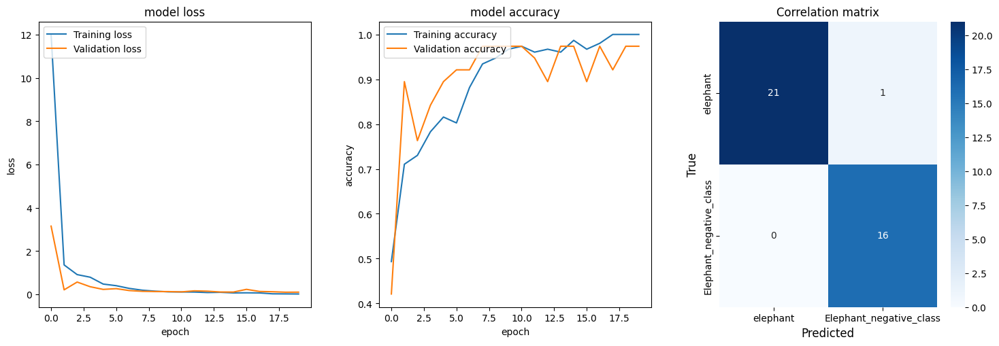

accuracy 97.368
Epoch 1/20


2023-11-24 10:47:59.300806: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_89/dropout_267/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 64ms/step - loss: 6.7250 - accuracy: 0.5263 - val_loss: 8.9811 - val_accuracy: 0.5526
Epoch 2/20
10/10 [==============================] - 0s 34ms/step - loss: 4.8707 - accuracy: 0.5724 - val_loss: 1.7015 - val_accuracy: 0.7105
Epoch 3/20
10/10 [==============================] - 0s 29ms/step - loss: 1.4688 - accuracy: 0.8224 - val_loss: 1.4353 - val_accuracy: 0.7105
Epoch 4/20
10/10 [==============================] - 0s 27ms/step - loss: 0.6246 - accuracy: 0.8882 - val_loss: 1.1432 - val_accuracy: 0.7105
Epoch 5/20
10/10 [==============================] - 0s 26ms/step - loss: 0.4088 - accuracy: 0.8816 - val_loss: 0.6944 - val_accuracy: 0.7368
Epoch 6/20
10/10 [==============================] - 0s 30ms/step - loss: 0.2649 - accuracy: 0.9145 - val_loss: 0.9858 - val_accuracy: 0.7105
Epoch 7/20
10/10 [==============================] - 0s 32ms/step - loss: 0.1931 - accuracy: 0.9474 - val_loss: 1.0095 - val_accuracy: 0.7895
Epoch 8/20
10/10 [======

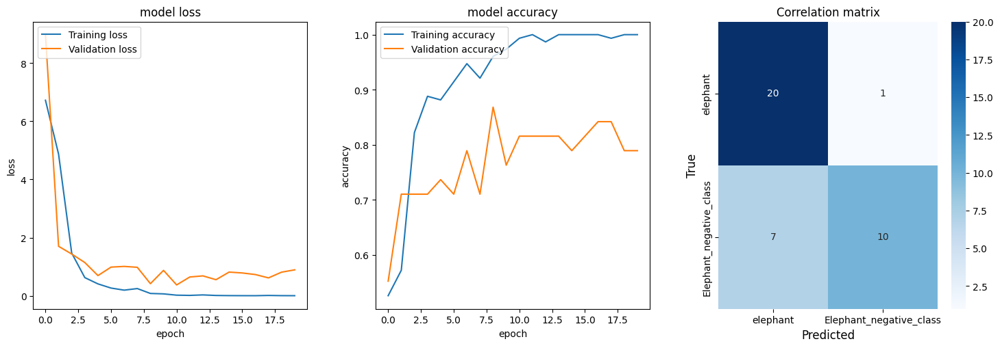

accuracy 78.947
Accuracy: mean=90.000 std=6.316, n=5
Testing: Filters=16, Kernel=(5, 5), Batch size=5
Model: "sequential_90"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_90 (Conv2D)          (None, 120, 120, 16)      1216      
                                                                 
 dropout_270 (Dropout)       (None, 120, 120, 16)      0         
                                                                 
 flatten_90 (Flatten)        (None, 230400)            0         
                                                                 
 dropout_271 (Dropout)       (None, 230400)            0         
                                                                 
 dense_180 (Dense)           (None, 128)               29491328  
                                                                 
 dropout_272 (Dropout)       (None, 128)               0         
                 

2023-11-24 10:48:12.838862: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_91/dropout_273/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 4s 24ms/step - loss: 4.3503 - accuracy: 0.5329 - val_loss: 0.7094 - val_accuracy: 0.4737
Epoch 2/20
31/31 [==============================] - 0s 15ms/step - loss: 0.5699 - accuracy: 0.5658 - val_loss: 0.6705 - val_accuracy: 0.8421
Epoch 3/20
31/31 [==============================] - 0s 14ms/step - loss: 0.4782 - accuracy: 0.7829 - val_loss: 0.5351 - val_accuracy: 0.7368
Epoch 4/20
31/31 [==============================] - 0s 14ms/step - loss: 0.3122 - accuracy: 0.8882 - val_loss: 0.5455 - val_accuracy: 0.7632
Epoch 5/20
31/31 [==============================] - 0s 14ms/step - loss: 0.1837 - accuracy: 0.9342 - val_loss: 0.5796 - val_accuracy: 0.7368
Epoch 6/20
31/31 [==============================] - 0s 14ms/step - loss: 0.1860 - accuracy: 0.9474 - val_loss: 0.5132 - val_accuracy: 0.7632
Epoch 7/20
31/31 [==============================] - 0s 14ms/step - loss: 0.1268 - accuracy: 0.9671 - val_loss: 1.2604 - val_accuracy: 0.5789
Epoch 8/20
31/31 [======

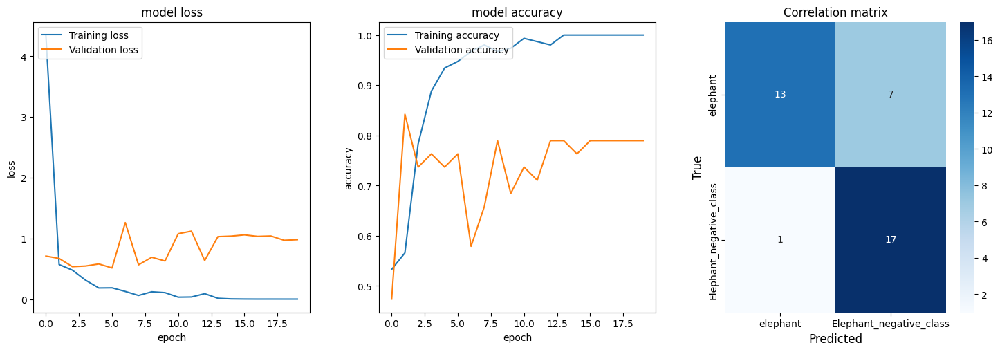

accuracy 78.947
Epoch 1/20


2023-11-24 10:48:35.906420: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_92/dropout_276/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 21ms/step - loss: 2.9715 - accuracy: 0.4803 - val_loss: 0.6797 - val_accuracy: 0.7368
Epoch 2/20
31/31 [==============================] - 0s 14ms/step - loss: 0.6313 - accuracy: 0.6842 - val_loss: 0.7366 - val_accuracy: 0.6053
Epoch 3/20
31/31 [==============================] - 0s 14ms/step - loss: 0.5657 - accuracy: 0.7697 - val_loss: 1.5211 - val_accuracy: 0.6316
Epoch 4/20
31/31 [==============================] - 0s 13ms/step - loss: 0.3582 - accuracy: 0.8487 - val_loss: 0.8051 - val_accuracy: 0.6579
Epoch 5/20
31/31 [==============================] - 0s 14ms/step - loss: 0.2896 - accuracy: 0.9079 - val_loss: 0.7590 - val_accuracy: 0.5789
Epoch 6/20
31/31 [==============================] - 0s 14ms/step - loss: 0.0814 - accuracy: 0.9868 - val_loss: 4.7690 - val_accuracy: 0.5526
Epoch 7/20
31/31 [==============================] - 0s 13ms/step - loss: 0.9077 - accuracy: 0.8816 - val_loss: 0.6287 - val_accuracy: 0.6579
Epoch 8/20
31/31 [======

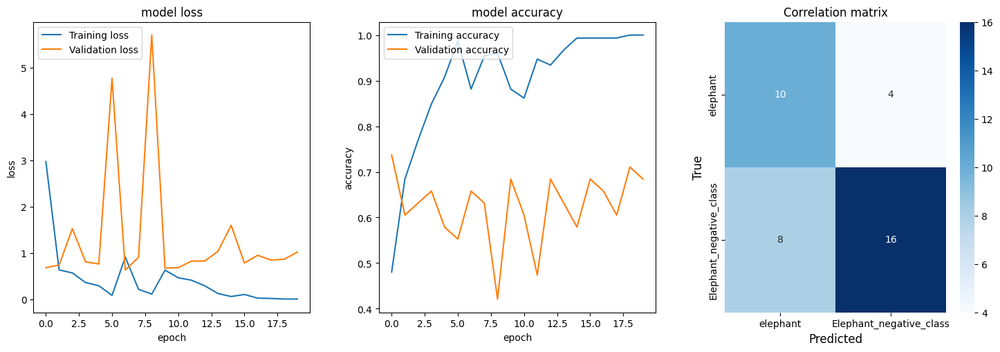

accuracy 68.421
Epoch 1/20


2023-11-24 10:48:50.322100: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_93/dropout_279/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 28ms/step - loss: 4.7208 - accuracy: 0.5921 - val_loss: 0.7134 - val_accuracy: 0.5526
Epoch 2/20
31/31 [==============================] - 1s 17ms/step - loss: 0.5822 - accuracy: 0.6513 - val_loss: 0.5979 - val_accuracy: 0.7368
Epoch 3/20
31/31 [==============================] - 1s 18ms/step - loss: 0.4923 - accuracy: 0.8289 - val_loss: 0.5834 - val_accuracy: 0.7632
Epoch 4/20
31/31 [==============================] - 1s 18ms/step - loss: 0.3333 - accuracy: 0.9079 - val_loss: 0.4772 - val_accuracy: 0.8158
Epoch 5/20
31/31 [==============================] - 1s 17ms/step - loss: 0.1712 - accuracy: 0.9276 - val_loss: 0.5068 - val_accuracy: 0.8421
Epoch 6/20
31/31 [==============================] - 1s 17ms/step - loss: 0.3099 - accuracy: 0.9737 - val_loss: 0.5872 - val_accuracy: 0.7368
Epoch 7/20
31/31 [==============================] - 1s 18ms/step - loss: 0.0549 - accuracy: 0.9803 - val_loss: 0.6429 - val_accuracy: 0.7368
Epoch 8/20
31/31 [======

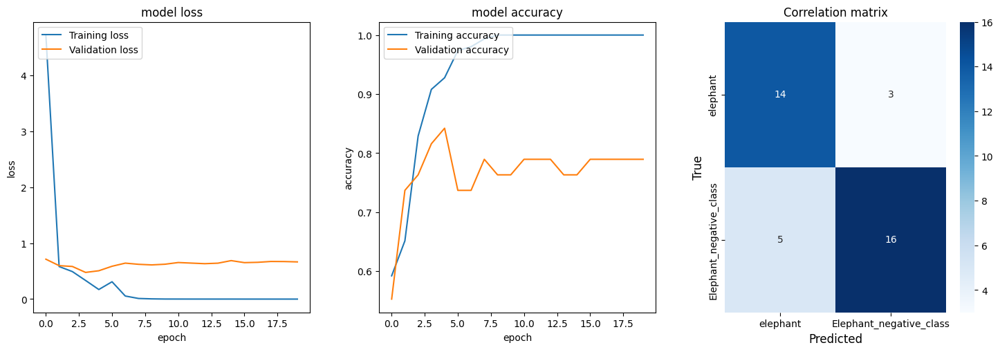

accuracy 78.947
Epoch 1/20


2023-11-24 10:49:04.241266: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_94/dropout_282/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 23ms/step - loss: 4.5229 - accuracy: 0.5592 - val_loss: 0.9572 - val_accuracy: 0.4474
Epoch 2/20
31/31 [==============================] - 0s 15ms/step - loss: 0.6522 - accuracy: 0.5789 - val_loss: 0.6307 - val_accuracy: 0.8158
Epoch 3/20
31/31 [==============================] - 0s 13ms/step - loss: 0.4856 - accuracy: 0.8092 - val_loss: 0.5065 - val_accuracy: 0.7632
Epoch 4/20
31/31 [==============================] - 0s 14ms/step - loss: 0.3008 - accuracy: 0.9013 - val_loss: 0.4583 - val_accuracy: 0.7895
Epoch 5/20
31/31 [==============================] - 0s 12ms/step - loss: 0.2484 - accuracy: 0.9079 - val_loss: 0.4708 - val_accuracy: 0.7105
Epoch 6/20
31/31 [==============================] - 0s 14ms/step - loss: 0.1301 - accuracy: 0.9474 - val_loss: 0.3826 - val_accuracy: 0.7368
Epoch 7/20
31/31 [==============================] - 0s 15ms/step - loss: 0.0924 - accuracy: 0.9605 - val_loss: 0.4830 - val_accuracy: 0.8158
Epoch 8/20
31/31 [======

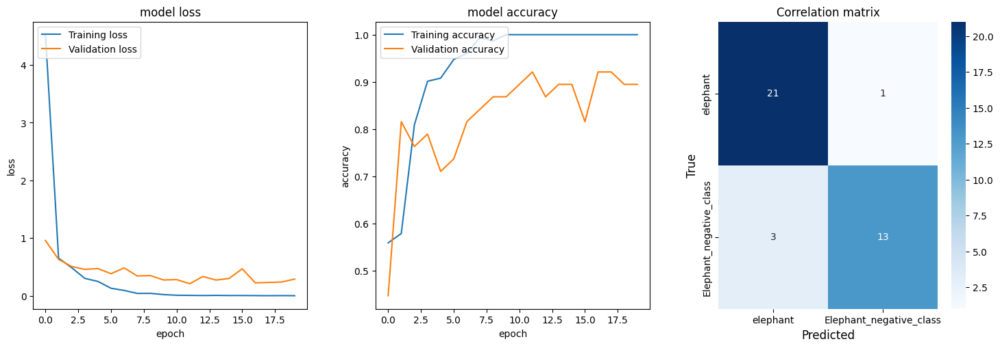

accuracy 89.474
Epoch 1/20


2023-11-24 10:49:27.235873: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_95/dropout_285/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


31/31 [==============================] - 3s 22ms/step - loss: 3.1215 - accuracy: 0.5789 - val_loss: 0.6786 - val_accuracy: 0.3947
Epoch 2/20
31/31 [==============================] - 0s 14ms/step - loss: 0.4525 - accuracy: 0.8158 - val_loss: 0.5367 - val_accuracy: 0.7105
Epoch 3/20
31/31 [==============================] - 0s 14ms/step - loss: 0.2864 - accuracy: 0.8684 - val_loss: 0.5564 - val_accuracy: 0.6842
Epoch 4/20
31/31 [==============================] - 1s 19ms/step - loss: 0.2003 - accuracy: 0.9342 - val_loss: 0.5242 - val_accuracy: 0.7368
Epoch 5/20
31/31 [==============================] - 0s 16ms/step - loss: 0.0835 - accuracy: 0.9934 - val_loss: 0.5641 - val_accuracy: 0.7895
Epoch 6/20
31/31 [==============================] - 0s 14ms/step - loss: 0.0787 - accuracy: 0.9868 - val_loss: 1.1151 - val_accuracy: 0.7105
Epoch 7/20
31/31 [==============================] - 1s 18ms/step - loss: 0.1149 - accuracy: 0.9539 - val_loss: 0.6599 - val_accuracy: 0.7105
Epoch 8/20
31/31 [======

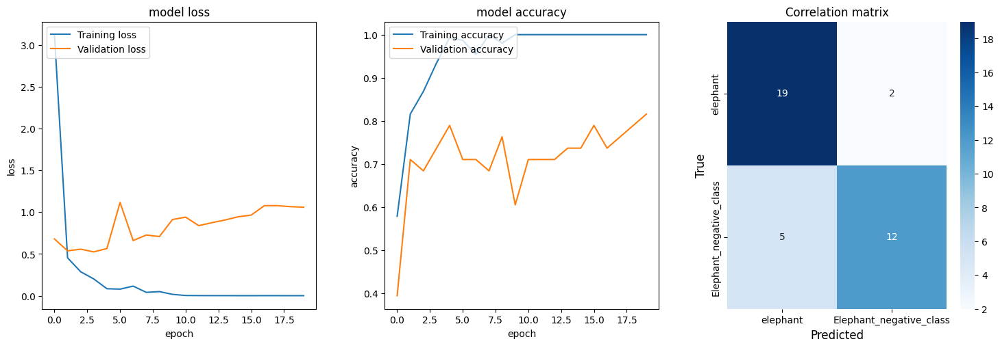

accuracy 81.579
Accuracy: mean=79.474 std=6.740, n=5
Testing: Filters=16, Kernel=(5, 5), Batch size=10
Model: "sequential_96"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_96 (Conv2D)          (None, 120, 120, 16)      1216      
                                                                 
 dropout_288 (Dropout)       (None, 120, 120, 16)      0         
                                                                 
 flatten_96 (Flatten)        (None, 230400)            0         
                                                                 
 dropout_289 (Dropout)       (None, 230400)            0         
                                                                 
 dense_192 (Dense)           (None, 128)               29491328  
                                                                 
 dropout_290 (Dropout)       (None, 128)               0         
                

2023-11-24 10:49:42.505728: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_97/dropout_291/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 4s 48ms/step - loss: 2.3415 - accuracy: 0.6711 - val_loss: 0.6254 - val_accuracy: 0.6053
Epoch 2/20
16/16 [==============================] - 0s 23ms/step - loss: 0.5171 - accuracy: 0.7500 - val_loss: 0.5441 - val_accuracy: 0.7368
Epoch 3/20
16/16 [==============================] - 0s 22ms/step - loss: 0.3769 - accuracy: 0.8487 - val_loss: 0.3985 - val_accuracy: 0.8158
Epoch 4/20
16/16 [==============================] - 0s 16ms/step - loss: 0.2221 - accuracy: 0.9342 - val_loss: 0.6749 - val_accuracy: 0.7105
Epoch 5/20
16/16 [==============================] - 0s 19ms/step - loss: 0.1149 - accuracy: 0.9737 - val_loss: 0.3249 - val_accuracy: 0.8421
Epoch 6/20
16/16 [==============================] - 0s 16ms/step - loss: 0.0576 - accuracy: 0.9868 - val_loss: 0.3254 - val_accuracy: 0.8158
Epoch 7/20
16/16 [==============================] - 0s 16ms/step - loss: 0.0476 - accuracy: 0.9803 - val_loss: 0.4351 - val_accuracy: 0.7895
Epoch 8/20
16/16 [======

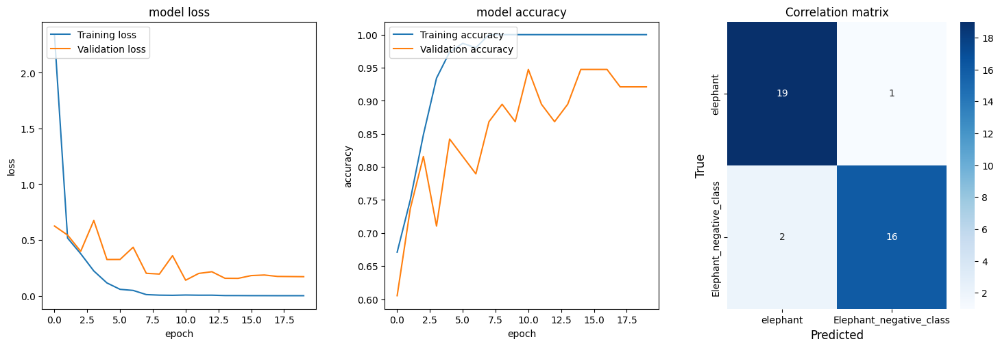

accuracy 92.105
Epoch 1/20


2023-11-24 10:49:55.249885: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_98/dropout_294/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 34ms/step - loss: 7.7690 - accuracy: 0.5592 - val_loss: 1.9192 - val_accuracy: 0.3947
Epoch 2/20
16/16 [==============================] - 0s 18ms/step - loss: 0.8728 - accuracy: 0.6513 - val_loss: 0.5424 - val_accuracy: 0.7105
Epoch 3/20
16/16 [==============================] - 0s 23ms/step - loss: 0.4047 - accuracy: 0.8224 - val_loss: 0.5101 - val_accuracy: 0.7632
Epoch 4/20
16/16 [==============================] - 0s 21ms/step - loss: 0.2100 - accuracy: 0.9211 - val_loss: 0.5035 - val_accuracy: 0.7632
Epoch 5/20
16/16 [==============================] - 0s 17ms/step - loss: 0.0914 - accuracy: 0.9605 - val_loss: 0.6360 - val_accuracy: 0.7105
Epoch 6/20
16/16 [==============================] - 0s 24ms/step - loss: 0.0499 - accuracy: 0.9868 - val_loss: 0.6375 - val_accuracy: 0.7368
Epoch 7/20
16/16 [==============================] - 0s 24ms/step - loss: 0.1273 - accuracy: 0.9737 - val_loss: 0.5436 - val_accuracy: 0.7895
Epoch 8/20
16/16 [======

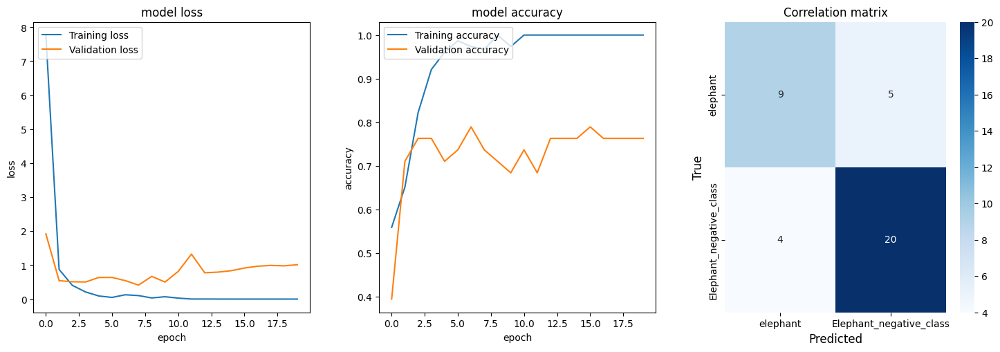

accuracy 76.316
Epoch 1/20


2023-11-24 10:50:06.779852: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_99/dropout_297/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 44ms/step - loss: 7.6562 - accuracy: 0.5592 - val_loss: 0.6829 - val_accuracy: 0.6053
Epoch 2/20
16/16 [==============================] - 0s 23ms/step - loss: 0.4120 - accuracy: 0.8684 - val_loss: 0.4780 - val_accuracy: 0.7895
Epoch 3/20
16/16 [==============================] - 0s 23ms/step - loss: 0.2172 - accuracy: 0.9408 - val_loss: 1.5149 - val_accuracy: 0.6053
Epoch 4/20
16/16 [==============================] - 0s 22ms/step - loss: 0.1846 - accuracy: 0.9342 - val_loss: 0.3864 - val_accuracy: 0.8421
Epoch 5/20
16/16 [==============================] - 0s 22ms/step - loss: 0.0761 - accuracy: 0.9868 - val_loss: 0.4032 - val_accuracy: 0.8158
Epoch 6/20
16/16 [==============================] - 0s 22ms/step - loss: 0.0352 - accuracy: 0.9934 - val_loss: 0.2936 - val_accuracy: 0.8947
Epoch 7/20
16/16 [==============================] - 0s 18ms/step - loss: 0.0125 - accuracy: 1.0000 - val_loss: 0.4332 - val_accuracy: 0.8421
Epoch 8/20
16/16 [======

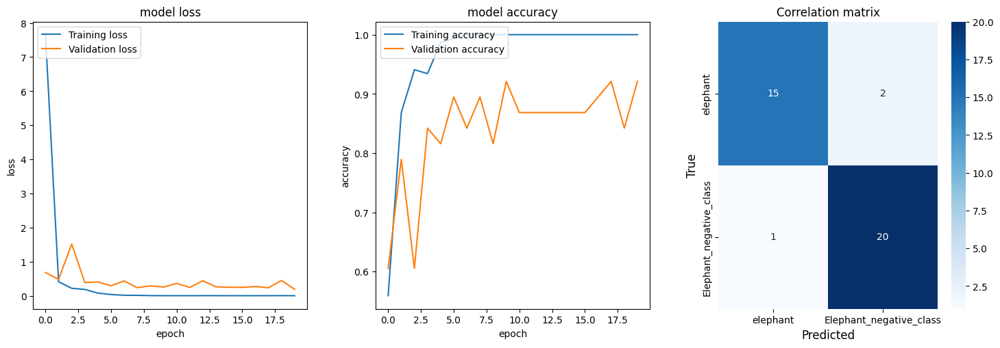

accuracy 92.105
Epoch 1/20


2023-11-24 10:50:16.902349: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_100/dropout_300/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 36ms/step - loss: 6.2924 - accuracy: 0.4934 - val_loss: 0.7834 - val_accuracy: 0.5263
Epoch 2/20
16/16 [==============================] - 0s 17ms/step - loss: 0.6383 - accuracy: 0.7368 - val_loss: 0.6219 - val_accuracy: 0.7632
Epoch 3/20
16/16 [==============================] - 0s 16ms/step - loss: 0.3832 - accuracy: 0.8750 - val_loss: 0.4102 - val_accuracy: 0.7895
Epoch 4/20
16/16 [==============================] - 0s 16ms/step - loss: 0.1630 - accuracy: 0.9408 - val_loss: 2.0572 - val_accuracy: 0.4211
Epoch 5/20
16/16 [==============================] - 0s 15ms/step - loss: 0.1121 - accuracy: 0.9539 - val_loss: 0.2740 - val_accuracy: 0.8947
Epoch 6/20
16/16 [==============================] - 0s 16ms/step - loss: 0.1520 - accuracy: 0.9539 - val_loss: 0.3662 - val_accuracy: 0.8684
Epoch 7/20
16/16 [==============================] - 0s 16ms/step - loss: 0.0755 - accuracy: 0.9868 - val_loss: 0.1294 - val_accuracy: 0.9737
Epoch 8/20
16/16 [======

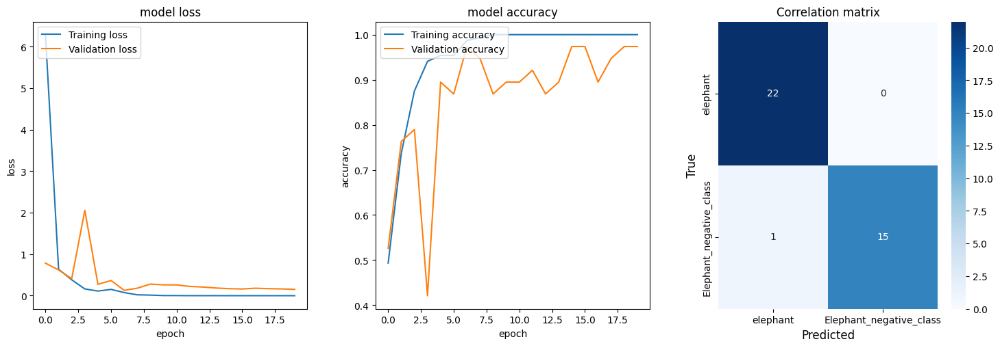

accuracy 97.368
Epoch 1/20


2023-11-24 10:50:30.240790: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_101/dropout_303/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


16/16 [==============================] - 3s 45ms/step - loss: 17.1623 - accuracy: 0.4671 - val_loss: 4.9649 - val_accuracy: 0.5526
Epoch 2/20
16/16 [==============================] - 0s 22ms/step - loss: 1.0430 - accuracy: 0.6974 - val_loss: 0.4829 - val_accuracy: 0.8158
Epoch 3/20
16/16 [==============================] - 0s 23ms/step - loss: 0.4239 - accuracy: 0.8224 - val_loss: 0.5135 - val_accuracy: 0.7368
Epoch 4/20
16/16 [==============================] - 0s 23ms/step - loss: 0.3163 - accuracy: 0.8882 - val_loss: 0.4420 - val_accuracy: 0.7895
Epoch 5/20
16/16 [==============================] - 0s 20ms/step - loss: 0.1517 - accuracy: 0.9474 - val_loss: 0.4025 - val_accuracy: 0.8158
Epoch 6/20
16/16 [==============================] - 0s 23ms/step - loss: 0.1552 - accuracy: 0.9408 - val_loss: 0.3990 - val_accuracy: 0.7895
Epoch 7/20
16/16 [==============================] - 0s 22ms/step - loss: 0.1098 - accuracy: 0.9605 - val_loss: 0.4291 - val_accuracy: 0.8158
Epoch 8/20
16/16 [=====

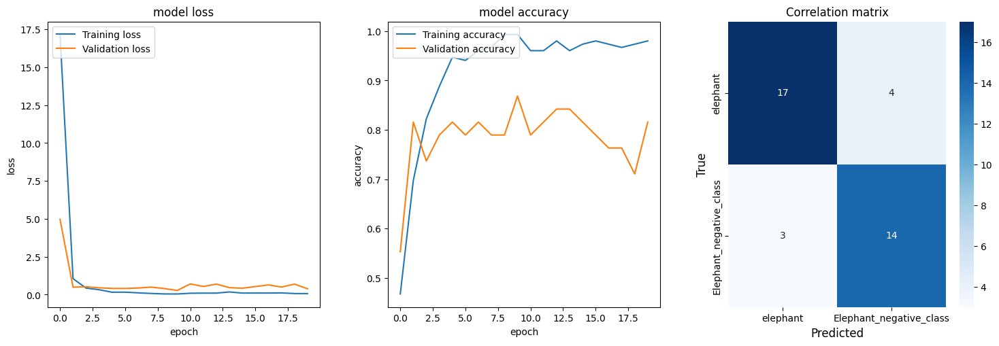

accuracy 81.579
Accuracy: mean=87.895 std=7.735, n=5
Testing: Filters=16, Kernel=(5, 5), Batch size=16
Model: "sequential_102"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_102 (Conv2D)         (None, 120, 120, 16)      1216      
                                                                 
 dropout_306 (Dropout)       (None, 120, 120, 16)      0         
                                                                 
 flatten_102 (Flatten)       (None, 230400)            0         
                                                                 
 dropout_307 (Dropout)       (None, 230400)            0         
                                                                 
 dense_204 (Dense)           (None, 128)               29491328  
                                                                 
 dropout_308 (Dropout)       (None, 128)               0         
               

2023-11-24 10:50:43.021527: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_103/dropout_309/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 60ms/step - loss: 7.4737 - accuracy: 0.5724 - val_loss: 5.4231 - val_accuracy: 0.4737
Epoch 2/20
10/10 [==============================] - 0s 30ms/step - loss: 1.4360 - accuracy: 0.6513 - val_loss: 0.7466 - val_accuracy: 0.7632
Epoch 3/20
10/10 [==============================] - 0s 29ms/step - loss: 0.4079 - accuracy: 0.8224 - val_loss: 0.3811 - val_accuracy: 0.7895
Epoch 4/20
10/10 [==============================] - 0s 27ms/step - loss: 0.1912 - accuracy: 0.9276 - val_loss: 0.3934 - val_accuracy: 0.7632
Epoch 5/20
10/10 [==============================] - 0s 24ms/step - loss: 0.1185 - accuracy: 0.9671 - val_loss: 0.4750 - val_accuracy: 0.8158
Epoch 6/20
10/10 [==============================] - 0s 27ms/step - loss: 0.0587 - accuracy: 0.9868 - val_loss: 0.4411 - val_accuracy: 0.8421
Epoch 7/20
10/10 [==============================] - 0s 34ms/step - loss: 0.0229 - accuracy: 1.0000 - val_loss: 0.7287 - val_accuracy: 0.7368
Epoch 8/20
10/10 [======

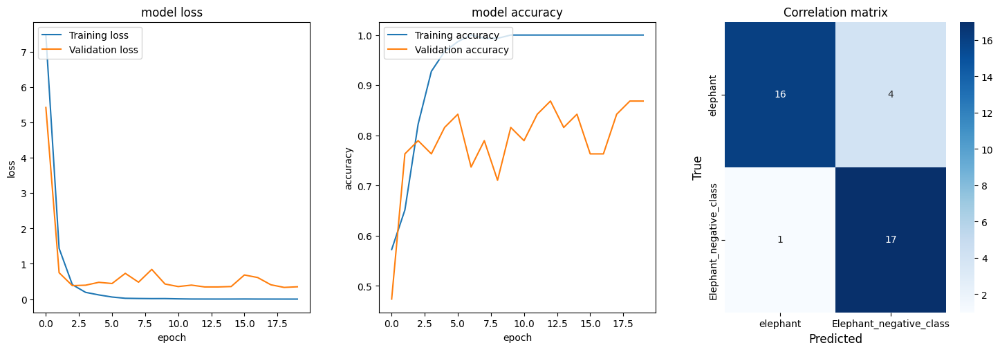

accuracy 86.842
Epoch 1/20


2023-11-24 10:50:53.997130: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_104/dropout_312/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 74ms/step - loss: 9.3442 - accuracy: 0.5789 - val_loss: 0.5946 - val_accuracy: 0.8158
Epoch 2/20
10/10 [==============================] - 0s 30ms/step - loss: 0.7774 - accuracy: 0.6974 - val_loss: 0.4970 - val_accuracy: 0.7368
Epoch 3/20
10/10 [==============================] - 0s 30ms/step - loss: 0.3708 - accuracy: 0.8750 - val_loss: 0.4470 - val_accuracy: 0.8684
Epoch 4/20
10/10 [==============================] - 0s 29ms/step - loss: 0.1989 - accuracy: 0.9276 - val_loss: 0.3784 - val_accuracy: 0.8158
Epoch 5/20
10/10 [==============================] - 0s 27ms/step - loss: 0.1096 - accuracy: 0.9539 - val_loss: 0.3817 - val_accuracy: 0.8421
Epoch 6/20
10/10 [==============================] - 0s 31ms/step - loss: 0.0499 - accuracy: 0.9803 - val_loss: 0.3520 - val_accuracy: 0.8684
Epoch 7/20
10/10 [==============================] - 0s 27ms/step - loss: 0.0219 - accuracy: 1.0000 - val_loss: 0.4266 - val_accuracy: 0.8421
Epoch 8/20
10/10 [======

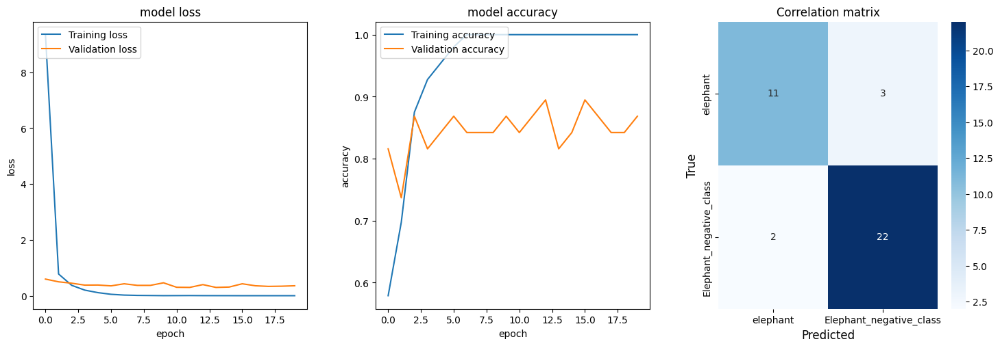

accuracy 86.842
Epoch 1/20


2023-11-24 10:51:03.083087: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_105/dropout_315/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 50ms/step - loss: 7.3755 - accuracy: 0.5526 - val_loss: 0.8108 - val_accuracy: 0.8158
Epoch 2/20
10/10 [==============================] - 0s 27ms/step - loss: 0.7592 - accuracy: 0.7500 - val_loss: 0.5456 - val_accuracy: 0.8421
Epoch 3/20
10/10 [==============================] - 0s 21ms/step - loss: 0.3464 - accuracy: 0.8487 - val_loss: 0.4184 - val_accuracy: 0.8158
Epoch 4/20
10/10 [==============================] - 0s 20ms/step - loss: 0.2039 - accuracy: 0.9211 - val_loss: 0.3837 - val_accuracy: 0.8158
Epoch 5/20
10/10 [==============================] - 0s 20ms/step - loss: 0.1316 - accuracy: 0.9474 - val_loss: 0.7926 - val_accuracy: 0.6842
Epoch 6/20
10/10 [==============================] - 0s 19ms/step - loss: 0.0729 - accuracy: 1.0000 - val_loss: 0.5180 - val_accuracy: 0.8158
Epoch 7/20
10/10 [==============================] - 0s 21ms/step - loss: 0.0392 - accuracy: 1.0000 - val_loss: 0.6231 - val_accuracy: 0.8158
Epoch 8/20
10/10 [======

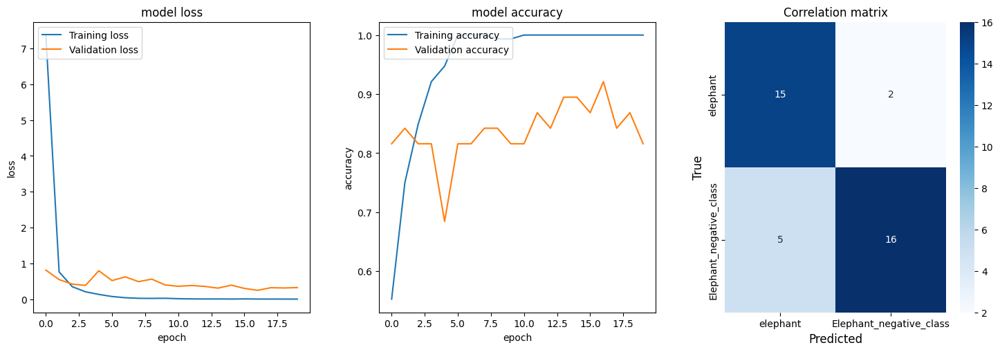

accuracy 81.579
Epoch 1/20


2023-11-24 10:51:16.415901: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_106/dropout_318/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 63ms/step - loss: 11.8113 - accuracy: 0.4474 - val_loss: 3.0685 - val_accuracy: 0.4211
Epoch 2/20
10/10 [==============================] - 0s 30ms/step - loss: 1.6295 - accuracy: 0.5855 - val_loss: 0.4487 - val_accuracy: 0.8947
Epoch 3/20
10/10 [==============================] - 0s 29ms/step - loss: 0.5629 - accuracy: 0.7105 - val_loss: 0.6034 - val_accuracy: 0.6842
Epoch 4/20
10/10 [==============================] - 0s 25ms/step - loss: 0.4953 - accuracy: 0.8289 - val_loss: 0.4922 - val_accuracy: 0.8158
Epoch 5/20
10/10 [==============================] - 0s 25ms/step - loss: 0.3218 - accuracy: 0.8618 - val_loss: 0.4476 - val_accuracy: 0.7368
Epoch 6/20
10/10 [==============================] - 0s 26ms/step - loss: 0.4242 - accuracy: 0.8421 - val_loss: 0.3323 - val_accuracy: 0.8421
Epoch 7/20
10/10 [==============================] - 0s 29ms/step - loss: 0.2742 - accuracy: 0.8947 - val_loss: 0.4007 - val_accuracy: 0.7895
Epoch 8/20
10/10 [=====

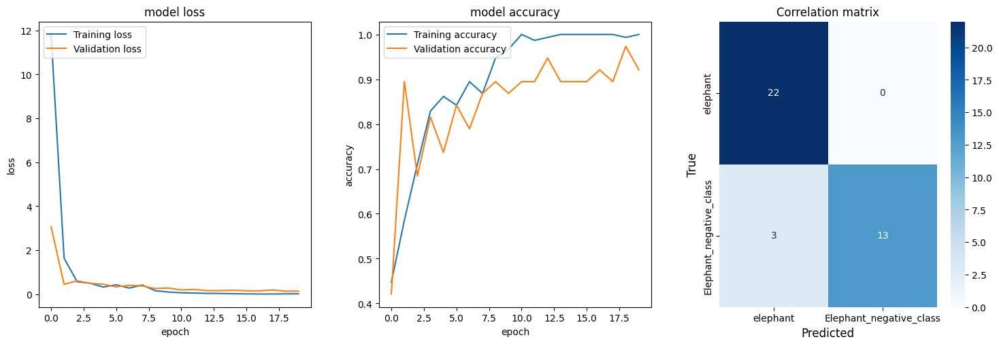

accuracy 92.105
Epoch 1/20


2023-11-24 10:51:29.216041: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_107/dropout_321/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


10/10 [==============================] - 3s 52ms/step - loss: 10.2994 - accuracy: 0.4868 - val_loss: 3.4174 - val_accuracy: 0.4474
Epoch 2/20
10/10 [==============================] - 0s 23ms/step - loss: 1.1397 - accuracy: 0.6382 - val_loss: 0.8461 - val_accuracy: 0.5526
Epoch 3/20
10/10 [==============================] - 0s 21ms/step - loss: 0.7137 - accuracy: 0.5855 - val_loss: 0.6691 - val_accuracy: 0.5000
Epoch 4/20
10/10 [==============================] - 0s 21ms/step - loss: 0.5847 - accuracy: 0.7566 - val_loss: 0.7191 - val_accuracy: 0.6842
Epoch 5/20
10/10 [==============================] - 0s 22ms/step - loss: 0.3229 - accuracy: 0.8750 - val_loss: 0.5451 - val_accuracy: 0.7632
Epoch 6/20
10/10 [==============================] - 0s 27ms/step - loss: 0.2631 - accuracy: 0.8947 - val_loss: 0.5194 - val_accuracy: 0.7368
Epoch 7/20
10/10 [==============================] - 0s 28ms/step - loss: 0.1921 - accuracy: 0.9145 - val_loss: 0.4930 - val_accuracy: 0.7632
Epoch 8/20
10/10 [=====

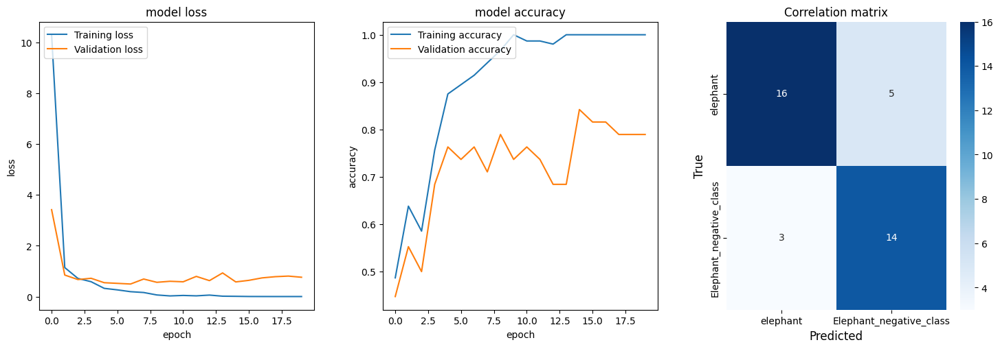

accuracy 78.947
Accuracy: mean=85.263 std=4.588, n=5
Best global score: 90.526
Best Filters: 10, Kernel size: (1, 1), Batch size: 10


In [ ]:
import numpy as np

filters = [10, 16]
kernel_sizes = [(1,1), (2,2), (5, 5)]
batch_sizes = [5,10,16]  # Changed from 'batch_size' to 'batch_sizes' to match the loop variable
best_global_score = 0
best_global_filter = 0
best_global_kernel_size = 0
best_global_batch_size = 0

# Nested For-Loops for Hyperparameter Tuning
for fi in filters:
    for ke in kernel_sizes:
        for bs in batch_sizes:
            print(f"Testing: Filters={fi}, Kernel={ke}, Batch size={bs}")
            model = define_modeleElephant(fi, ke)
            print(model.summary())

            # Evaluate model
            scores, histories = evaluate_model(model, X_train, y_train, fi, ke, bs, 5, 20)
            accuracy = np.mean(scores) * 100  # 'np.mean' should be used for calculating mean
            print('Accuracy: mean=%.3f std=%.3f, n=%d' % (accuracy, np.std(scores) * 100, len(scores)))
            print('=======================================================================')

            if accuracy > best_global_score:
                best_global_score = accuracy
                best_global_filter = fi
                best_global_kernel_size = ke
                best_global_batch_size = bs

print("Best global score: {:.3f}".format(best_global_score))
print("Best Filters: {}, Kernel size: {}, Batch size: {}".format(best_global_filter, best_global_kernel_size, best_global_batch_size))

def run_evaluation(n_folds, epochs, X_train, y_train, printk=True):
    # define model
    model = define_modeleElephant(best_global_filter, best_global_kernel_size)
    print(model.summary())
    # evaluate model
    scores, histories = evaluate_model(model, X_train, y_train, best_global_filter, best_global_kernel_size, best_global_batch_size, n_folds, epochs)
    plot_curves(histories, printk)
    print('Accuracy: mean=%.3f std=%.3f, n=%d' % (np.mean(scores) * 100, np.std(scores) * 100, len(scores)))

Model: "sequential_122"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_122 (Conv2D)         (None, 122, 122, 32)      896       
                                                                 
 flatten_122 (Flatten)       (None, 476288)            0         
                                                                 
 dense_244 (Dense)           (None, 128)               60964992  
                                                                 
 dense_245 (Dense)           (None, 1)                 129       
                                                                 
Total params: 60,966,017
Trainable params: 60,966,017
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/50


2023-11-24 11:06:41.152897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 2s 148ms/step - loss: 9.2536 - accuracy: 0.6140 - val_loss: 8.8843 - val_accuracy: 0.4211
Epoch 2/50
6/6 [==============================] - 1s 108ms/step - loss: 3.1476 - accuracy: 0.6608 - val_loss: 1.4646 - val_accuracy: 0.6316
Epoch 3/50
6/6 [==============================] - 1s 105ms/step - loss: 1.4356 - accuracy: 0.6491 - val_loss: 0.9558 - val_accuracy: 0.7895
Epoch 4/50
6/6 [==============================] - 1s 106ms/step - loss: 0.7945 - accuracy: 0.7661 - val_loss: 0.7382 - val_accuracy: 0.8421
Epoch 5/50
6/6 [==============================] - 1s 107ms/step - loss: 0.4686 - accuracy: 0.8187 - val_loss: 0.5117 - val_accuracy: 0.7368
Epoch 6/50
6/6 [==============================] - 1s 118ms/step - loss: 0.4446 - accuracy: 0.8070 - val_loss: 0.8153 - val_accuracy: 0.7895
Epoch 7/50
6/6 [==============================] - 1s 108ms/step - loss: 0.3875 - accuracy: 0.8129 - val_loss: 0.4789 - val_accuracy: 0.7895
Epoch 8/50
6/6 [===============

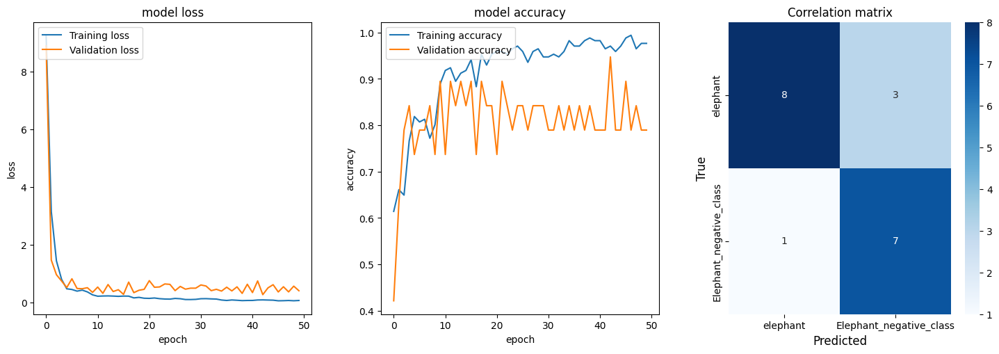

accuracy 78.947
Epoch 1/50


2023-11-24 11:07:36.994733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 2s 116ms/step - loss: 6.7044 - accuracy: 0.6374 - val_loss: 0.7492 - val_accuracy: 0.7368
Epoch 2/50
6/6 [==============================] - 1s 109ms/step - loss: 2.5955 - accuracy: 0.7018 - val_loss: 4.8325 - val_accuracy: 0.5789
Epoch 3/50
6/6 [==============================] - 1s 105ms/step - loss: 1.9849 - accuracy: 0.7778 - val_loss: 1.8838 - val_accuracy: 0.7368
Epoch 4/50
6/6 [==============================] - 1s 115ms/step - loss: 1.1741 - accuracy: 0.7895 - val_loss: 0.7051 - val_accuracy: 0.6316
Epoch 5/50
6/6 [==============================] - 1s 105ms/step - loss: 0.7550 - accuracy: 0.8304 - val_loss: 0.7286 - val_accuracy: 0.8421
Epoch 6/50
6/6 [==============================] - 1s 108ms/step - loss: 0.5422 - accuracy: 0.8772 - val_loss: 1.0767 - val_accuracy: 0.8421
Epoch 7/50
6/6 [==============================] - 1s 111ms/step - loss: 0.6559 - accuracy: 0.8012 - val_loss: 1.0814 - val_accuracy: 0.8421
Epoch 8/50
6/6 [===============

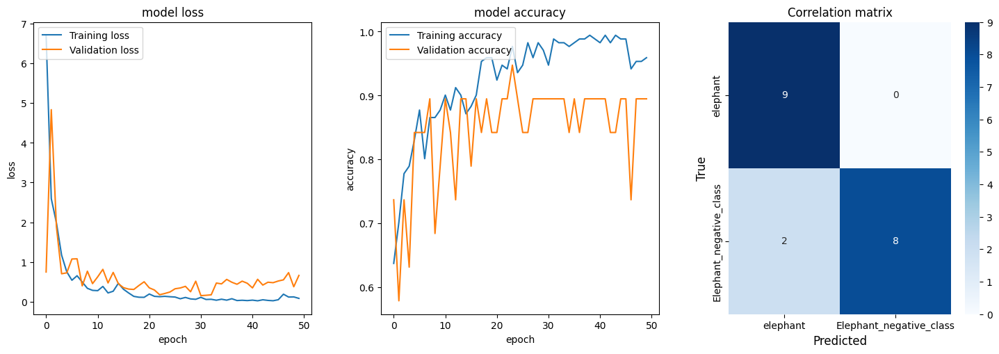

accuracy 89.474
Epoch 1/50


2023-11-24 11:08:28.325075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 3s 193ms/step - loss: 7.9575 - accuracy: 0.6199 - val_loss: 2.8013 - val_accuracy: 0.7368
Epoch 2/50
6/6 [==============================] - 1s 186ms/step - loss: 5.2606 - accuracy: 0.6608 - val_loss: 1.0605 - val_accuracy: 0.7895
Epoch 3/50
6/6 [==============================] - 1s 172ms/step - loss: 1.2612 - accuracy: 0.7836 - val_loss: 2.7179 - val_accuracy: 0.6842
Epoch 4/50
6/6 [==============================] - 1s 107ms/step - loss: 1.6912 - accuracy: 0.8070 - val_loss: 1.0905 - val_accuracy: 0.7368
Epoch 5/50
6/6 [==============================] - 1s 118ms/step - loss: 0.8983 - accuracy: 0.7895 - val_loss: 0.1987 - val_accuracy: 0.8947
Epoch 6/50
6/6 [==============================] - 1s 110ms/step - loss: 0.5114 - accuracy: 0.8713 - val_loss: 0.2221 - val_accuracy: 0.9474
Epoch 7/50
6/6 [==============================] - 1s 123ms/step - loss: 0.3738 - accuracy: 0.8772 - val_loss: 0.2158 - val_accuracy: 0.8421
Epoch 8/50
6/6 [===============

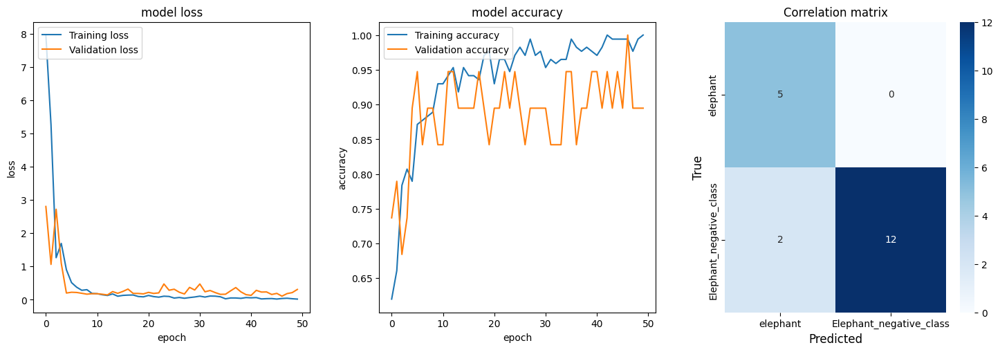

accuracy 89.474
Epoch 1/50


2023-11-24 11:09:21.208873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 2s 129ms/step - loss: 12.7213 - accuracy: 0.5263 - val_loss: 15.9094 - val_accuracy: 0.5263
Epoch 2/50
6/6 [==============================] - 1s 187ms/step - loss: 7.0794 - accuracy: 0.5789 - val_loss: 2.6956 - val_accuracy: 0.7368
Epoch 3/50
6/6 [==============================] - 1s 191ms/step - loss: 2.3935 - accuracy: 0.7251 - val_loss: 1.8241 - val_accuracy: 0.7368
Epoch 4/50
6/6 [==============================] - 1s 189ms/step - loss: 1.4822 - accuracy: 0.7427 - val_loss: 0.9025 - val_accuracy: 0.6842
Epoch 5/50
6/6 [==============================] - 1s 184ms/step - loss: 0.4680 - accuracy: 0.8538 - val_loss: 0.9660 - val_accuracy: 0.7368
Epoch 6/50
6/6 [==============================] - 1s 204ms/step - loss: 0.3761 - accuracy: 0.8713 - val_loss: 0.7639 - val_accuracy: 0.7368
Epoch 7/50
6/6 [==============================] - 1s 193ms/step - loss: 0.3797 - accuracy: 0.8363 - val_loss: 0.7932 - val_accuracy: 0.7368
Epoch 8/50
6/6 [=============

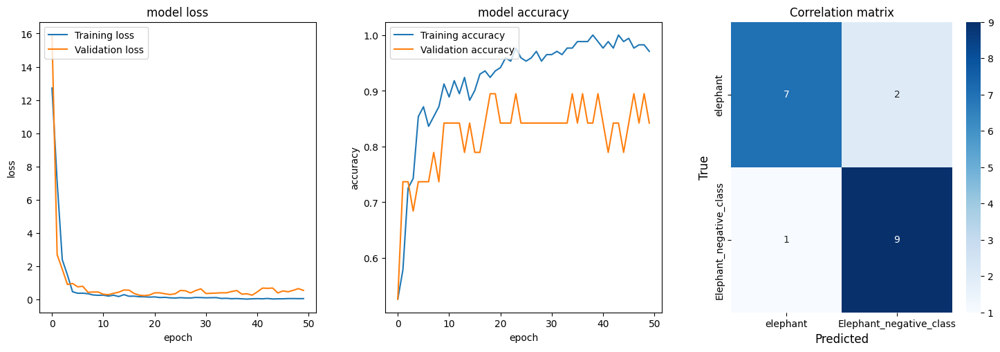

accuracy 84.211
Epoch 1/50


2023-11-24 11:10:18.395776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 2s 188ms/step - loss: 13.7356 - accuracy: 0.4971 - val_loss: 2.3516 - val_accuracy: 0.6842
Epoch 2/50
6/6 [==============================] - 1s 189ms/step - loss: 3.5790 - accuracy: 0.6608 - val_loss: 3.9413 - val_accuracy: 0.6316
Epoch 3/50
6/6 [==============================] - 1s 185ms/step - loss: 2.4845 - accuracy: 0.7661 - val_loss: 1.3420 - val_accuracy: 0.8421
Epoch 4/50
6/6 [==============================] - 1s 184ms/step - loss: 1.0287 - accuracy: 0.8246 - val_loss: 0.6172 - val_accuracy: 0.8421
Epoch 5/50
6/6 [==============================] - 1s 192ms/step - loss: 0.7523 - accuracy: 0.8012 - val_loss: 0.3989 - val_accuracy: 0.8947
Epoch 6/50
6/6 [==============================] - 1s 186ms/step - loss: 0.5232 - accuracy: 0.8304 - val_loss: 0.3056 - val_accuracy: 0.8421
Epoch 7/50
6/6 [==============================] - 1s 207ms/step - loss: 0.3276 - accuracy: 0.8363 - val_loss: 0.2096 - val_accuracy: 0.8947
Epoch 8/50
6/6 [==============

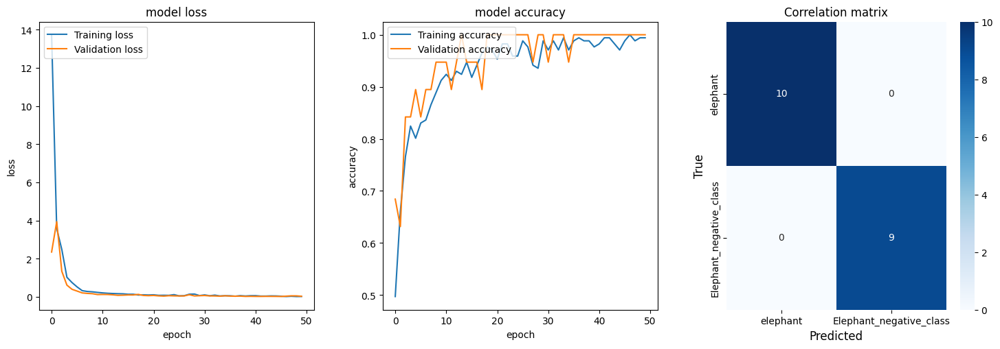

accuracy 100.000
Epoch 1/50


2023-11-24 11:11:11.810880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 2s 130ms/step - loss: 11.5638 - accuracy: 0.5556 - val_loss: 1.7051 - val_accuracy: 0.7895
Epoch 2/50
6/6 [==============================] - 1s 112ms/step - loss: 2.3033 - accuracy: 0.7427 - val_loss: 4.8958 - val_accuracy: 0.6316
Epoch 3/50
6/6 [==============================] - 1s 109ms/step - loss: 1.7618 - accuracy: 0.7895 - val_loss: 1.6164 - val_accuracy: 0.8421
Epoch 4/50
6/6 [==============================] - 1s 125ms/step - loss: 0.7466 - accuracy: 0.8421 - val_loss: 1.4337 - val_accuracy: 0.8947
Epoch 5/50
6/6 [==============================] - 1s 108ms/step - loss: 0.6349 - accuracy: 0.8538 - val_loss: 0.6985 - val_accuracy: 0.7895
Epoch 6/50
6/6 [==============================] - 1s 110ms/step - loss: 0.5514 - accuracy: 0.8363 - val_loss: 0.5516 - val_accuracy: 0.8947
Epoch 7/50
6/6 [==============================] - 1s 109ms/step - loss: 0.3894 - accuracy: 0.8947 - val_loss: 1.0412 - val_accuracy: 0.7368
Epoch 8/50
6/6 [==============

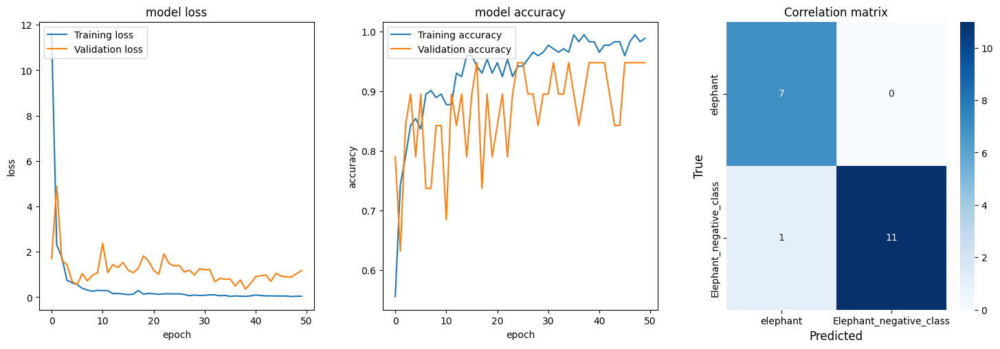

accuracy 94.737
Epoch 1/50


2023-11-24 11:12:07.739427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 2s 128ms/step - loss: 24.7854 - accuracy: 0.4795 - val_loss: 5.2673 - val_accuracy: 0.4737
Epoch 2/50
6/6 [==============================] - 1s 110ms/step - loss: 6.4199 - accuracy: 0.6140 - val_loss: 2.1769 - val_accuracy: 0.6842
Epoch 3/50
6/6 [==============================] - 1s 107ms/step - loss: 2.1293 - accuracy: 0.7368 - val_loss: 1.6088 - val_accuracy: 0.6842
Epoch 4/50
6/6 [==============================] - 1s 111ms/step - loss: 0.8693 - accuracy: 0.8187 - val_loss: 0.6346 - val_accuracy: 0.9474
Epoch 5/50
6/6 [==============================] - 1s 114ms/step - loss: 0.8063 - accuracy: 0.8187 - val_loss: 1.0125 - val_accuracy: 0.6842
Epoch 6/50
6/6 [==============================] - 1s 108ms/step - loss: 0.5035 - accuracy: 0.8538 - val_loss: 0.4731 - val_accuracy: 0.8947
Epoch 7/50
6/6 [==============================] - 1s 116ms/step - loss: 0.3503 - accuracy: 0.8480 - val_loss: 0.4504 - val_accuracy: 0.8947
Epoch 8/50
6/6 [==============

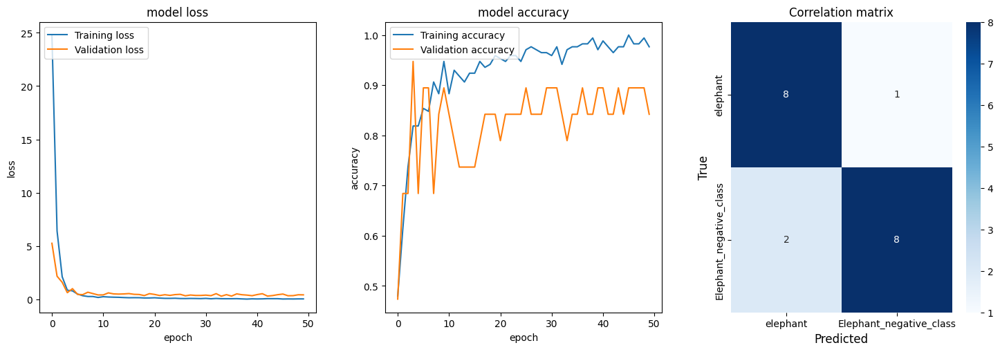

accuracy 84.211
Epoch 1/50


2023-11-24 11:12:59.707037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 3s 203ms/step - loss: 20.2291 - accuracy: 0.5322 - val_loss: 29.0979 - val_accuracy: 0.3158
Epoch 2/50
6/6 [==============================] - 1s 191ms/step - loss: 7.9870 - accuracy: 0.6374 - val_loss: 0.4387 - val_accuracy: 0.7895
Epoch 3/50
6/6 [==============================] - 1s 208ms/step - loss: 2.1573 - accuracy: 0.7251 - val_loss: 0.3404 - val_accuracy: 0.9474
Epoch 4/50
6/6 [==============================] - 1s 180ms/step - loss: 1.4646 - accuracy: 0.7895 - val_loss: 0.2545 - val_accuracy: 0.8421
Epoch 5/50
6/6 [==============================] - 1s 129ms/step - loss: 0.8648 - accuracy: 0.7836 - val_loss: 0.0549 - val_accuracy: 1.0000
Epoch 6/50
6/6 [==============================] - 1s 109ms/step - loss: 0.4693 - accuracy: 0.8480 - val_loss: 0.1194 - val_accuracy: 0.9474
Epoch 7/50
6/6 [==============================] - 1s 115ms/step - loss: 0.4068 - accuracy: 0.8655 - val_loss: 0.0717 - val_accuracy: 1.0000
Epoch 8/50
6/6 [=============

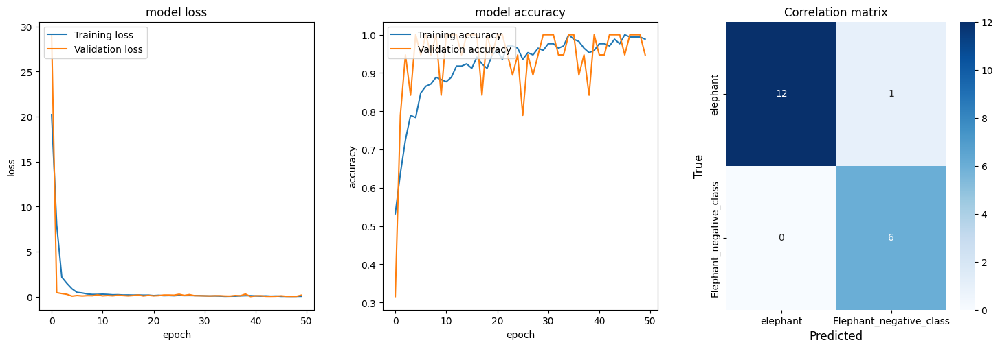

accuracy 94.737
Epoch 1/50


2023-11-24 11:13:56.299705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 3s 202ms/step - loss: 45.9556 - accuracy: 0.5322 - val_loss: 12.4313 - val_accuracy: 0.7368
Epoch 2/50
6/6 [==============================] - 1s 229ms/step - loss: 11.3126 - accuracy: 0.5673 - val_loss: 16.2194 - val_accuracy: 0.2632
Epoch 3/50
6/6 [==============================] - 1s 190ms/step - loss: 4.9539 - accuracy: 0.5789 - val_loss: 5.3055 - val_accuracy: 0.7368
Epoch 4/50
6/6 [==============================] - 1s 159ms/step - loss: 3.9195 - accuracy: 0.5614 - val_loss: 2.3920 - val_accuracy: 0.3158
Epoch 5/50
6/6 [==============================] - 1s 112ms/step - loss: 1.0198 - accuracy: 0.7485 - val_loss: 0.9604 - val_accuracy: 0.8421
Epoch 6/50
6/6 [==============================] - 1s 112ms/step - loss: 0.8152 - accuracy: 0.7953 - val_loss: 0.6341 - val_accuracy: 0.6842
Epoch 7/50
6/6 [==============================] - 1s 133ms/step - loss: 0.4928 - accuracy: 0.8480 - val_loss: 0.6296 - val_accuracy: 0.8421
Epoch 8/50
6/6 [===========

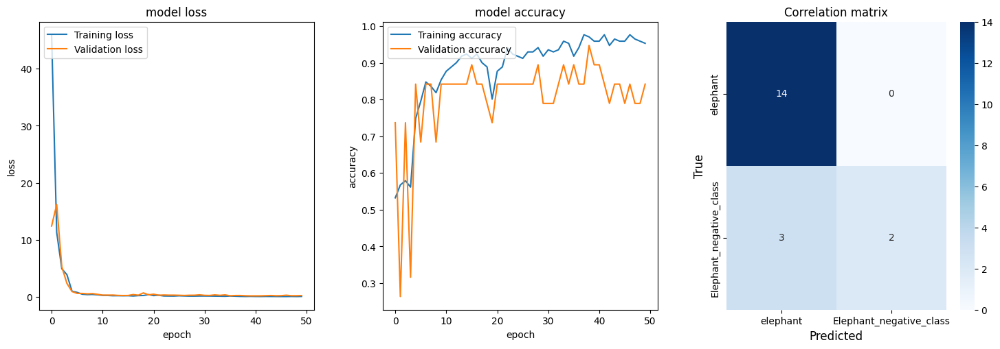

accuracy 84.211
Epoch 1/50


2023-11-24 11:14:55.413867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


6/6 [==============================] - 3s 197ms/step - loss: 8.5915 - accuracy: 0.5789 - val_loss: 3.3382 - val_accuracy: 0.6842
Epoch 2/50
6/6 [==============================] - 1s 203ms/step - loss: 2.4256 - accuracy: 0.7310 - val_loss: 9.9570 - val_accuracy: 0.5263
Epoch 3/50
6/6 [==============================] - 1s 205ms/step - loss: 2.8085 - accuracy: 0.7076 - val_loss: 1.1655 - val_accuracy: 0.7368
Epoch 4/50
6/6 [==============================] - 1s 111ms/step - loss: 1.2014 - accuracy: 0.8129 - val_loss: 1.0427 - val_accuracy: 0.7368
Epoch 5/50
6/6 [==============================] - 1s 110ms/step - loss: 0.7124 - accuracy: 0.8246 - val_loss: 2.0339 - val_accuracy: 0.7368
Epoch 6/50
6/6 [==============================] - 1s 118ms/step - loss: 0.6168 - accuracy: 0.8889 - val_loss: 0.3678 - val_accuracy: 0.7895
Epoch 7/50
6/6 [==============================] - 1s 122ms/step - loss: 0.3628 - accuracy: 0.8830 - val_loss: 0.5392 - val_accuracy: 0.7895
Epoch 8/50
6/6 [===============

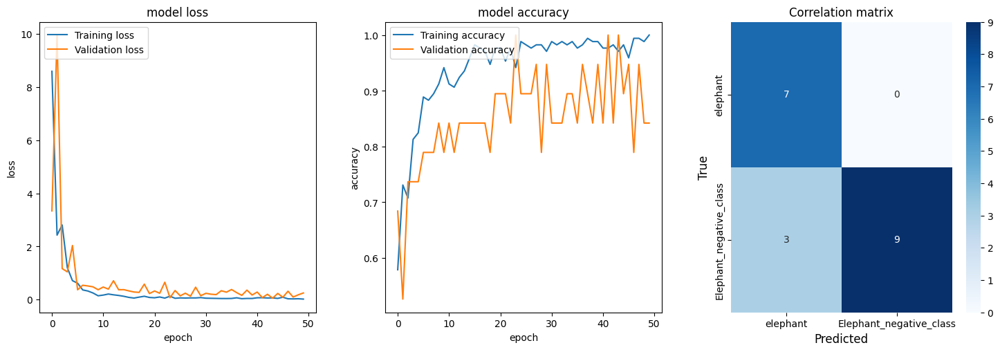

accuracy 84.211


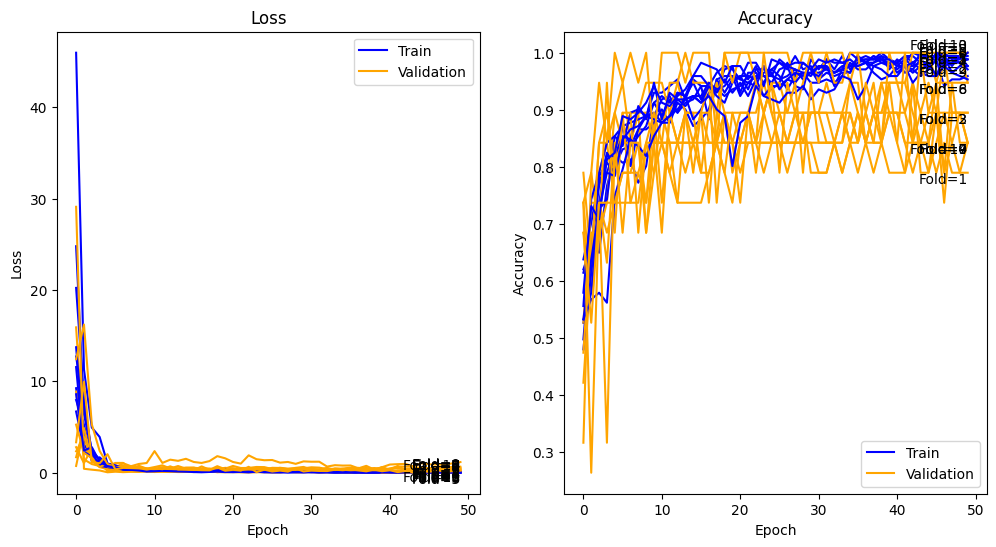

Accuracy: mean=88.421 std=6.138, n=10


In [ ]:
n_folds=10
epochs=50
run_evaluation(n_folds,epochs,X_train,y_train,printk=True)

#Amélioration : DataGenerator

##DataGenerator du modèle Baseline

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import numpy as np

# Definition du premier modèle baseline
def define_modelBaselineGen():
    model1 = models.Sequential()
    model1.add(layers.Conv2D(filters=32, kernel_size=(3, 3), input_shape=(124, 124, 3), activation='relu'))
    model1.add(layers.Flatten())  # Couche Flatten pour les images en couleur (124x124x3)
    model1.add(layers.Dense(128, activation='relu'))
    model1.add(layers.Dense(1, activation='sigmoid'))

    model1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model1

def evaluate_model(model, dataX, dataY, epochs=10):
    scores, histories = list(), list()
    datagen = ImageDataGenerator(shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest', rotation_range=20)

    X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size=0.2, random_state=42)

    # ré-initialisation du modèle
    model = define_modelBaselineGen()

    # préparation de l'itérateur
    train_iterator = datagen.flow(X_train, y_train, batch_size=32)

    # fit du modele
    history = model.fit(train_iterator, epochs=epochs, validation_data=(X_test, y_test), verbose=1)

    # evaluate du modele
    loss, acc = model.evaluate(X_test, y_test, verbose=0)
    y_pred = model.predict(X_test)
    y_pred_binary = (y_pred > 0.5).astype(int)  # Convertir en étiquettes binaires
    conf = confusion_matrix(y_test, y_pred_binary)
    print(conf)
    plot_curves_confusion(history, conf, my_classes)

    print('accuracy %.3f' % (acc * 100.0))
    scores.append(acc)
    histories.append(history)

    return scores, histories

# Fonction pour charger, transformer et évaluer le modele
def run_evaluation(epochs, X_train, y_train):
    # define model
    model = define_modelBaselineGen()
    print(model.summary())
    # evaluate model
    scores, histories = evaluate_model(model, X_train, y_train, epochs)
    #plot_curves(histories, printk)
    print('Accuracy: mean=%.3f std=%.3f, n=%d' % (np.mean(scores)*100, np.std(scores)*100, len(scores)))

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 122, 122, 32)      896       
                                                                 
 flatten_14 (Flatten)        (None, 476288)            0         
                                                                 
 dense_28 (Dense)            (None, 128)               60964992  
                                                                 
 dense_29 (Dense)            (None, 1)                 129       
                                                                 
Total params: 60,966,017
Trainable params: 60,966,017
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/50


2023-11-24 11:48:16.546693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 [==============================] - 3s 223ms/step - loss: 12.7189 - accuracy: 0.5625 - val_loss: 7.2307 - val_accuracy: 0.5500
Epoch 2/50
5/5 [==============================] - 1s 221ms/step - loss: 4.2644 - accuracy: 0.6562 - val_loss: 6.9981 - val_accuracy: 0.6500
Epoch 3/50
5/5 [==============================] - 1s 223ms/step - loss: 3.9198 - accuracy: 0.6938 - val_loss: 1.0261 - val_accuracy: 0.8000
Epoch 4/50
5/5 [==============================] - 1s 207ms/step - loss: 2.0167 - accuracy: 0.7875 - val_loss: 2.0661 - val_accuracy: 0.8000
Epoch 5/50
5/5 [==============================] - 1s 199ms/step - loss: 1.1207 - accuracy: 0.8125 - val_loss: 1.6819 - val_accuracy: 0.7000
Epoch 6/50
5/5 [==============================] - 1s 210ms/step - loss: 0.8771 - accuracy: 0.8438 - val_loss: 1.3555 - val_accuracy: 0.7750
Epoch 7/50
5/5 [==============================] - 1s 128ms/step - loss: 0.6385 - accuracy: 0.8375 - val_loss: 0.5656 - val_accuracy: 0.8250
Epoch 8/50
5/5 [==============

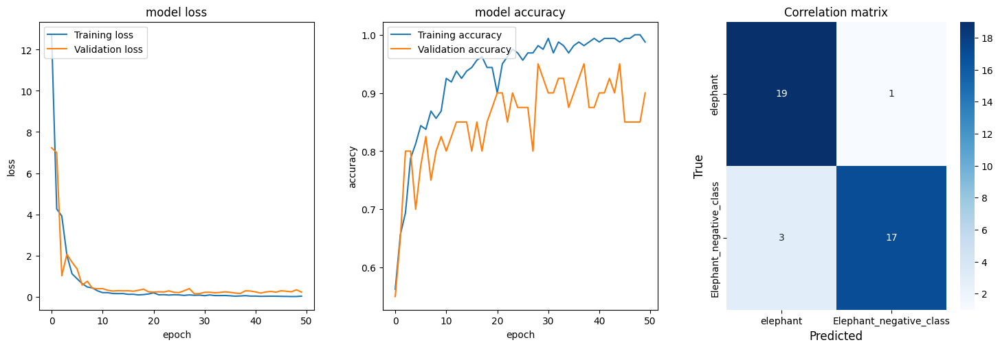

accuracy 90.000
Accuracy: mean=90.000 std=0.000, n=1


In [ ]:
epochs=50
run_evaluation(epochs,X_elephant,y_elephant)

##DataGenerator du modèle amélioré (Droupout..)

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import RMSprop
from scikeras.wrappers import KerasClassifier, KerasRegressor
from sklearn.model_selection import GridSearchCV
# definition du premier modèle baseline
def define_modelElephantGen():
  # Créez votre modèle
  model1 = models.Sequential()
  model1.add(Conv2D(filters=10, kernel_size=(1, 1), input_shape=(124, 124, 3), activation='relu'))
  model1.add(layers.Flatten(input_shape=(124, 124, 3)))  # Couche Flatten pour les images en couleur (28x28x3)
  model1.add(layers.Dense(128, activation='relu'))
  model1.add(layers.Dense(1, activation='sigmoid'))

  model1.compile(optimizer='adam', loss='binary_crossentropy',metrics=['accuracy'])

  return model1

# Evaluation avec un k-fold
def evaluate_model(model, dataX, dataY, epochs=10):
    scores, histories = list(), list()
    datagen = ImageDataGenerator(shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest', rotation_range=20)

    X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size=0.2, random_state=42)

    # ré-initialisation du modèle
    model = define_modelBaselineGen()

    # préparation de l'itérateur
    train_iterator = datagen.flow(X_train, y_train, batch_size=32)

    # fit du modele
    history = model.fit(train_iterator, epochs=epochs, validation_data=(X_test, y_test), verbose=1)

    # evaluate du modele
    loss, acc = model.evaluate(X_test, y_test, verbose=0)
    y_pred = model.predict(X_test)
    y_pred_binary = (y_pred > 0.5).astype(int)  # Convertir en étiquettes binaires
    conf = confusion_matrix(y_test, y_pred_binary)
    print(conf)
    plot_curves_confusion(history, conf, my_classes)

    print('accuracy %.3f' % (acc * 100.0))
    scores.append(acc)
    histories.append(history)

    return scores, histories


# Fonction pour charger, transformer et évaluer le modele
def run_evaluation(epochs, X_train, y_train):
    # define model
    model = define_modelBaselineGen()
    print(model.summary())
    # evaluate model
    scores, histories = evaluate_model(model, X_train, y_train, epochs)
    #plot_curves(histories, printk)
    print('Accuracy: mean=%.3f n=%d' % (np.mean(scores)*100, len(scores)))

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 122, 122, 32)      896       
                                                                 
 flatten_16 (Flatten)        (None, 476288)            0         
                                                                 
 dense_32 (Dense)            (None, 128)               60964992  
                                                                 
 dense_33 (Dense)            (None, 1)                 129       
                                                                 
Total params: 60,966,017
Trainable params: 60,966,017
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/50


2023-11-24 11:54:23.034647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


5/5 [==============================] - 5s 221ms/step - loss: 14.4346 - accuracy: 0.5688 - val_loss: 7.0400 - val_accuracy: 0.5750
Epoch 2/50
5/5 [==============================] - 1s 208ms/step - loss: 3.2090 - accuracy: 0.7750 - val_loss: 6.4327 - val_accuracy: 0.6000
Epoch 3/50
5/5 [==============================] - 1s 198ms/step - loss: 4.2435 - accuracy: 0.7312 - val_loss: 3.7538 - val_accuracy: 0.7750
Epoch 4/50
5/5 [==============================] - 1s 212ms/step - loss: 2.2116 - accuracy: 0.7750 - val_loss: 0.9169 - val_accuracy: 0.8250
Epoch 5/50
5/5 [==============================] - 1s 141ms/step - loss: 1.5336 - accuracy: 0.8438 - val_loss: 2.4782 - val_accuracy: 0.6250
Epoch 6/50
5/5 [==============================] - 1s 119ms/step - loss: 1.3351 - accuracy: 0.8313 - val_loss: 1.8453 - val_accuracy: 0.8000
Epoch 7/50
5/5 [==============================] - 1s 122ms/step - loss: 0.9750 - accuracy: 0.8438 - val_loss: 1.1373 - val_accuracy: 0.7000
Epoch 8/50
5/5 [==============

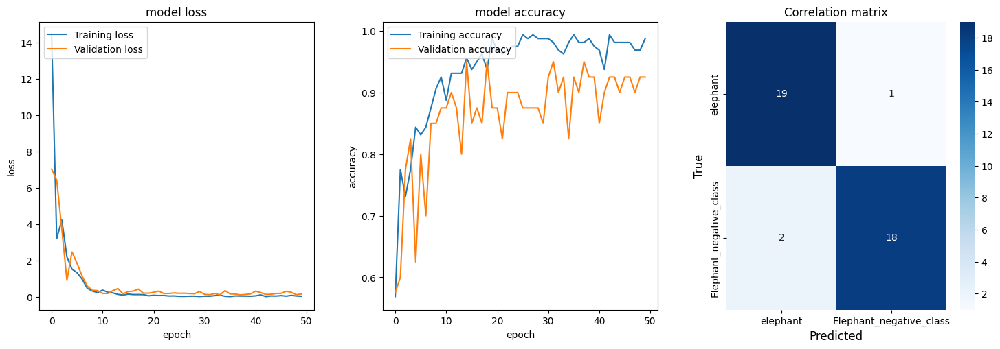

accuracy 92.500
Accuracy: mean=92.500 n=1


In [ ]:
epochs=50
run_evaluation(epochs,X_elephant,y_elephant)

#Amélioration : EarlyStopping

Epoch 1/40
5/5 [==============================] - 19s 3s/step - loss: 23.8045 - accuracy: 0.5224 - val_loss: 6.0890 - val_accuracy: 0.5000
Epoch 2/40
5/5 [==============================] - 25s 5s/step - loss: 5.2444 - accuracy: 0.4851 - val_loss: 1.4494 - val_accuracy: 0.5000
Epoch 3/40
5/5 [==============================] - 21s 4s/step - loss: 0.6865 - accuracy: 0.5896 - val_loss: 0.6640 - val_accuracy: 0.5909
Epoch 4/40
5/5 [==============================] - 19s 4s/step - loss: 0.4672 - accuracy: 0.8955 - val_loss: 0.9653 - val_accuracy: 0.6515
Epoch 5/40
5/5 [==============================] - 17s 3s/step - loss: 1.7273 - accuracy: 0.6716 - val_loss: 0.6467 - val_accuracy: 0.6212
Epoch 6/40
5/5 [==============================] - 19s 4s/step - loss: 0.2984 - accuracy: 0.8582 - val_loss: 2.2581 - val_accuracy: 0.5000
Epoch 7/40
5/5 [==============================] - 19s 4s/step - loss: 0.7432 - accuracy: 0.7910 - val_loss: 0.6938 - val_accuracy: 0.5303
Epoch 8/40
5/5 [=================

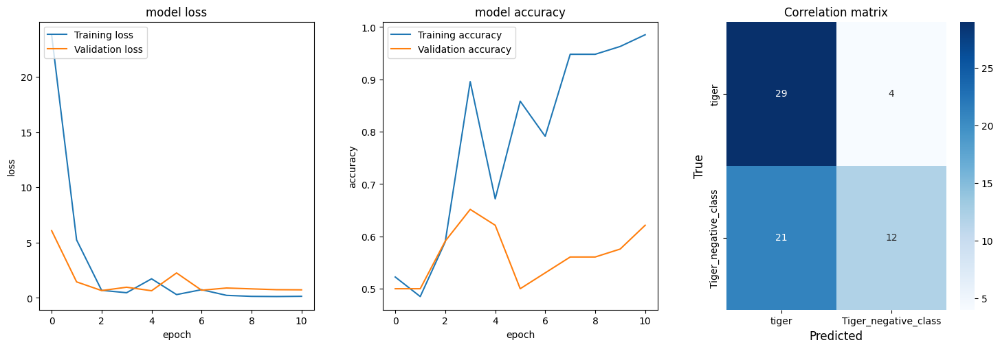

In [ ]:
early_stop = keras.callbacks.EarlyStopping(
  monitor='val_accuracy',
  patience=7
)

model1 = models.Sequential()
model1.add(Conv2D(filters=64, kernel_size=(5, 5), input_shape=(124, 124, 3), activation='relu'))
model1.add(layers.Flatten(input_shape=(124, 124, 3)))  # Couche Flatten pour les images en couleur (28x28x3)
model1.add(layers.Dense(128, activation='relu'))
model1.add(layers.Dense(1, activation='sigmoid'))
# compilation du modèle
model1.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
# fit le modèle sur le jeu de données. Nous mettons un batchsize de 32
history=model1.fit(X_train, y_train, validation_data=(X_test,y_test),epochs=40, batch_size=32, callbacks=[early_stop])

y_pred=model1.predict(X_test)
y_pred[y_pred <= 0.5] = 0.
y_pred[y_pred > 0.5] = 1.

print ("\nRappel du modèle testé")
print (model1.summary(),'\n')
conf=confusion_matrix(y_test,y_pred)
plot_curves_confusion (history,conf,my_classes)

#Génération de nouvelles images

In [ ]:
tf.keras.preprocessing.image.ImageDataGenerator(
featurewise_center=False, samplewise_center=False,
featurewise_std_normalization=False, samplewise_std_normalization=False,
zca_whitening=False, zca_epsilon=1e-06, rotation_range=0, width_shift_range=0.0,
height_shift_range=0.0, brightness_range=None, shear_range=0.0, zoom_range=0.0,
channel_shift_range=0.0, fill_mode='nearest', cval=0.0, horizontal_flip=False,
vertical_flip=False, rescale=None, preprocessing_function=None,
data_format=None, validation_split=0.0, dtype=None)


In [ ]:
datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)

for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=9, shuffle=False):
    # Redimensionner les images augmentées à la taille appropriée
    resized_images = [cv2.resize(image, (124, 124)) for image in X_batch]
    # Affichage de 3x3
    fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(4, 4))
    for i in range(3):
        for j in range(3):
            ax[i][j].imshow(resized_images[i * 3 + j], cmap=plt.get_cmap("gray"))
    plt.show()
    break


In [ ]:
datagen = ImageDataGenerator(rotation_range=80)
# configuration du batch size et récupération d'un batch d'images
for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=9, shuffle=False):
    # Affichage de 3x3
    fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(4,4))
    for i in range(3):
        for j in range(3):
            ax[i][j].imshow(X_batch[i * 3 + j].reshape(124, 124, 3), cmap=plt.get_cmap("gray"))

    plt.show()
    break

In [ ]:
shift = 0.4
datagen = ImageDataGenerator(width_shift_range=shift, height_shift_range=shift)
# configuration du batch size et récupération d'un batch d'images
for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=9, shuffle=False):
    # Affichage de 3x3
    fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(4,4))
    for i in range(3):
        for j in range(3):
            ax[i][j].imshow(X_batch[i*3+j].reshape(124,124,3), cmap=plt.get_cmap("gray"))
    plt.show()
    break

In [ ]:
datagen = ImageDataGenerator(zoom_range=1.5)
# configuration du batch size et récupération d'un batch d'images
for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=9, shuffle=False):
    # Affichage de 3x3
    fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(4,4))
    for i in range(3):
        for j in range(3):
            ax[i][j].imshow(X_batch[i*3+j].reshape(124,124,3), cmap=plt.get_cmap("gray"))
    plt.show()
    break

In [ ]:
datagen = ImageDataGenerator(zoom_range=-4, vertical_flip=True )
# configuration du batch size et récupération d'un batch d'images
for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=9, shuffle=False):
    # Affichage de 3x3
    fig, ax = plt.subplots(3, 3, sharex=True, sharey=True, figsize=(4,4))
    for i in range(3):
        for j in range(3):
            ax[i][j].imshow(X_batch[i*3+j].reshape(124,124,3), cmap=plt.get_cmap("gray"))
    plt.show()
    break

In [ ]:
datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
nb_images=0;

for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=1, shuffle=False):
    plt.figure(figsize=(4,4))
    plt.imshow(X_batch.reshape(124,124,3), cmap=plt.get_cmap("gray"))
    plt.xlabel('image'+str(nb_images+1))
    plt.show()
    nb_images+=1
    if nb_images >= 10:
      break

In [ ]:
datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
nb_images=0;

for X_batch, y_batch in datagen.flow(X_train, y_train, batch_size=1, shuffle=False,
                                     save_to_dir='.', save_prefix='augmente', save_format='png'):
    plt.figure(figsize=(3,3))
    plt.imshow(X_batch.reshape(124,124,3), cmap=plt.get_cmap("gray"))
    # show the plot
    plt.xlabel('image'+str(nb_images+1))
    plt.show()
    nb_images+=1drive/
    if nb_images >= 2:
      break

In [ ]:
# mis en place du générateur avec décalage de 0.2 en largeur, 0.2 en hauteur et
# permutation horizontale

epochs=2
batch=2
datagen = ImageDataGenerator(width_shift_range=0.2,
                               height_shift_range=0.2,
                                horizontal_flip=True)

# preparation de l'iterateur pour remplir les batchs.
batches = datagen.flow(X_train, y_train, batch_size=batch_size)

# appel de la fonction fit. Dans les anciennes versions de Keras
# mettre fit_generator
history = model.fit(batches,
                    #steps_per_epoch=X_train.shape[0] // batch_size,
                    epochs=epochs,
                    validation_data=(X_test, y_test), verbose=1)

In [ ]:
# pour vérifier que l'image existe dans le répertoire
%ls *.png

In [ ]:
# Évaluer le modèle sur le jeu de test
test_loss, test_acc = model.evaluate(X_test, y_test, verbose=2)

# Faire des prédictions sur le jeu de test
y_pred_probs = model.predict(X_test)
y_pred_classes = np.argmax(y_pred_probs, axis=1)

# Calculer la matrice de confusion
conf = confusion_matrix(np.argmax(y_test, axis=1), y_pred_classes)
print(conf)

# Afficher les résultats de l'évaluation
print(f"Loss on test set: {test_loss}")
print(f"Accuracy on test set: {test_acc}")


##visualisation des données

**AVEC T-SNE**

In [ ]:
def plot_2d_fashion_mnist_scatter(X, y, labels):

    fig, plot = plt.subplots()
    fig.set_size_inches(10, 10)
    plt.prism()

    for i in range(len(labels)):
        digit_indices = (y == i)
        dim0 = X[digit_indices, 0]
        dim1 = X[digit_indices, 1]
        plot.scatter(dim0, dim1, label=f"{labels[i]}")


    plot.set_xticks(())
    plot.set_yticks(())

    plt.tight_layout()
    plt.legend()
    plt.show()

In [ ]:
new_X=X.reshape(X.shape[0],X.shape[1]*X.shape[2]*X.shape[3])
print(new_X.shape[0],new_X.shape[1])
print(X.shape[-1])
print(y)
classes=["tigre","non tigre"]

In [ ]:
print(X.shape[0],X.shape[1],X.shape[2],X.shape[3])

In [ ]:
tigger_tsne_embedding

In [ ]:
tigger_tsne_embedding = TSNE(n_components=2, perplexity=40).fit_transform(new_X)
plot_2d_fashion_mnist_scatter(tigger_tsne_embedding, y.astype(int),classes)

*UMAP*

In [ ]:
tigger_umap_reducer = UMAP()
tigger_umap_embedding = tigger_umap_reducer.fit_transform(new_X)
tigger_umap_embedding.shape

In [ ]:
plot_2d_fashion_mnist_scatter(tigger_umap_embedding, y.astype(int),classes)

Pour les éléphants :     

In [ ]:
my_path="Data_Project/Tiger-Fox-Elephant/"
my_classes=['elephant','Elephant_negative_class']
X,y=create_X_y (my_path,my_classes)
print ("Nombre de données : ",X.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
sns.countplot(np.array(y))
plt.title("Nombre d'éléments par classe")
# affichage
plot_examples(X,y)

# Surtout ne pas oublier de normaliser les données avec :
X=X.astype('float')
X=X/255.0

In [ ]:
new_X=X.reshape(X.shape[0],X.shape[1]*X.shape[2]*X.shape[3])
print(new_X.shape[0],new_X.shape[1])
print(X.shape[-1])
print(y)
classese=["elephant","non elephant"]

In [ ]:
elephant_umap_reducer = UMAP()
elephant_umap_embedding = elephant_umap_reducer.fit_transform(new_X)
elephant_umap_embedding.shape

In [ ]:
plot_2d_fashion_mnist_scatter(elephant_umap_embedding, y.astype(int),classese)

Pour les renards :     


In [ ]:
my_path="Data_Project/Tiger-Fox-Elephant/"
my_classes=['fox','Fox_negative_class']
X,y=create_X_y (my_path,my_classes)
print ("Nombre de données : ",X.shape[0])
print ("Taille d'une image pour connaître l'input du réseau", X[0].shape)
print ("Distribution des labels dans le jeu d'apprentissage")
sns.countplot(np.array(y))
plt.title("Nombre d'éléments par classe")
# affichage
plot_examples(X,y)

# Surtout ne pas oublier de normaliser les données avec :
X=X.astype('float')
X=X/255.0

In [ ]:
new_X=X.reshape(X.shape[0],X.shape[1]*X.shape[2]*X.shape[3])
print(new_X.shape[0],new_X.shape[1])
print(X.shape[-1])
print(y)
classesr=["renard","non renard"]

In [ ]:
renard_umap_reducer = UMAP()
renard_umap_embedding = renard_umap_reducer.fit_transform(new_X)
renard_umap_embedding.shape

In [ ]:
plot_2d_fashion_mnist_scatter(renard_umap_embedding, y.astype(int),classesr)